## Corotation radii database analysis

In [1]:
import numpy as np
import math
import pandas as pd
import os
import matplotlib.image as mpimg
import pylab as plt
from astroquery.ned import Ned
import warnings
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
hyp = pd.read_csv('./../data/info_about_galaxies/hyperleda_data.csv',index_col=0)
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 

In [3]:
def err_serf(cr_lr):
    
    cr_lr.sort(key = lambda x: x[0])
    
    serf=0.
    min_ = cr_lr[0][0]
    max_ = cr_lr[0][1]
    
    for i in range(1,len(cr_lr[:])):
        
        if (cr_lr[i][0] >= max_):
            serf+=max_-min_
            min_=cr_lr[i][0]
            max_=cr_lr[i][1] 
            
        elif (cr_lr[i][0] < max_) & (cr_lr[i][1] > max_):
            max_ = cr_lr[i][1]
  
    serf+=max_-min_
    return serf
def zToMpc(z):
    return np.power(10, (z-25)/5)

def consistancy(cr_l,cr_r,cr,num):
    
    sigma = (np.array(cr_r)-np.array(cr_l))/2
    
    sum_mu = 0
    k=0
    while k!=num-1:
        for i in range(k+1,num):
            sum_mu+=(cr[i]-cr[k])**2
        k+=1
    
    result = np.sqrt(sum_mu)/np.sqrt(np.sum(sigma**2)) 
        
    return result    
        

### Inclination angle dependence

In [4]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0)
df['cr_l'] = df['cr_l']/df['r25']
df['cr_r'] = df['cr_r']/df['r25']

In [5]:
import matplotlib as mpl
mpl.style.use('classic')
sns.set_style("ticks")
sns.color_palette()
sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 6.5})

/tmp/ipykernel_11560/1916404169.py:20: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if incl > 0.:
/tmp/ipykernel_11560/1916404169.py:20: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if incl > 0.:
/tmp/ipykernel_11560/1916404169.py:20: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if incl > 0.:
/tmp/ipykernel_11560/1916404169.py:20: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if incl > 0.:
/tmp/ipykernel_11560/1916404169.

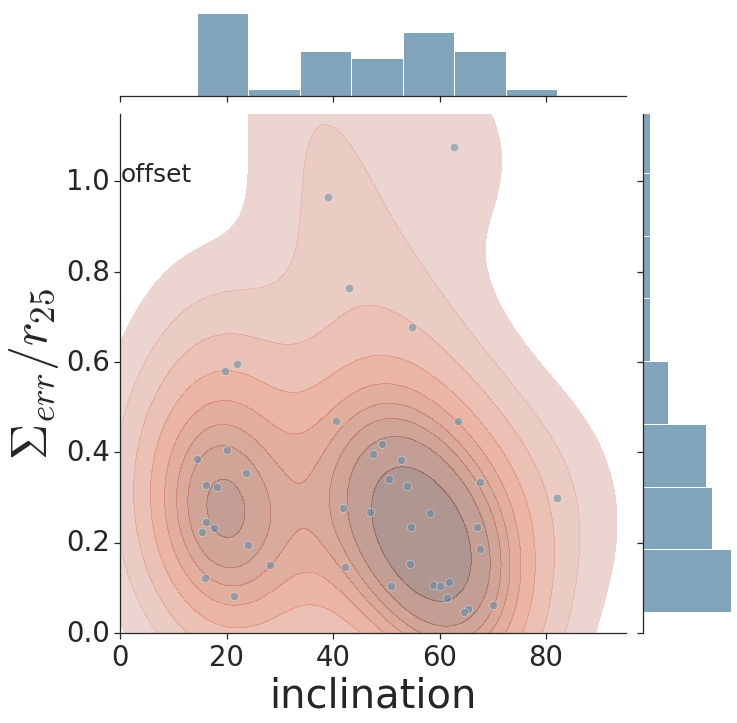

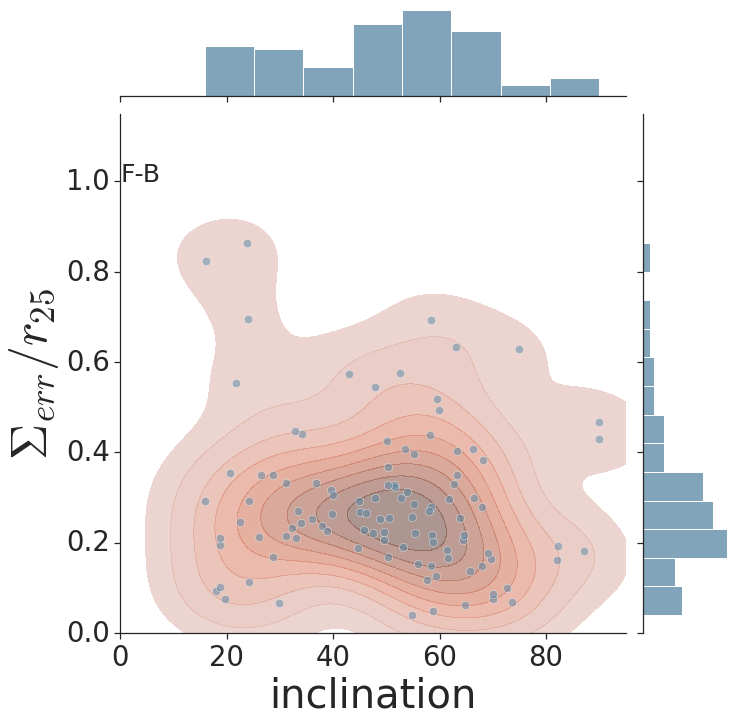

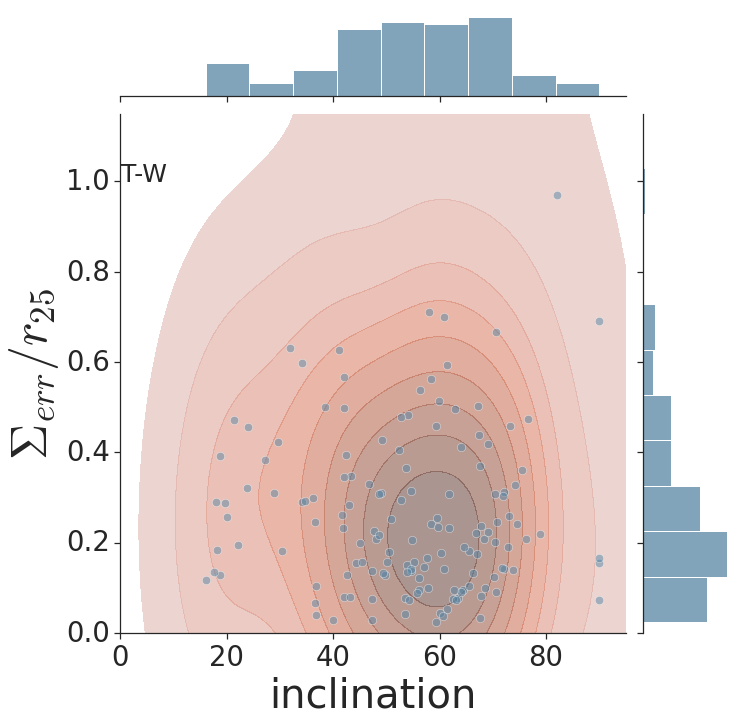

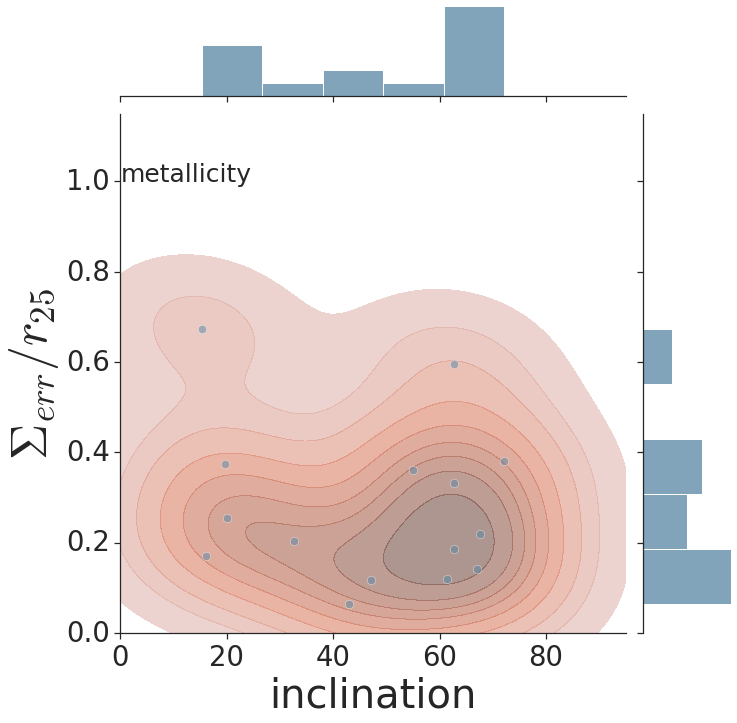

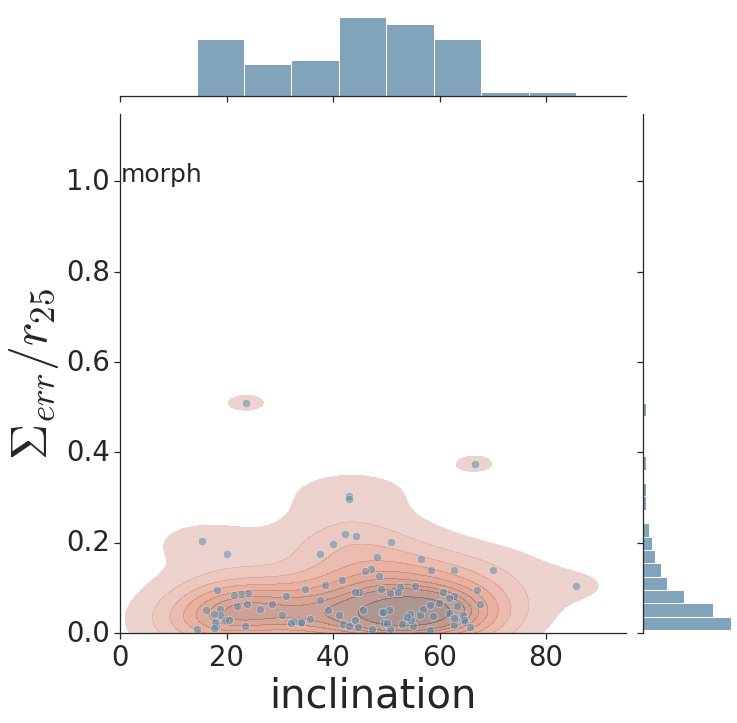

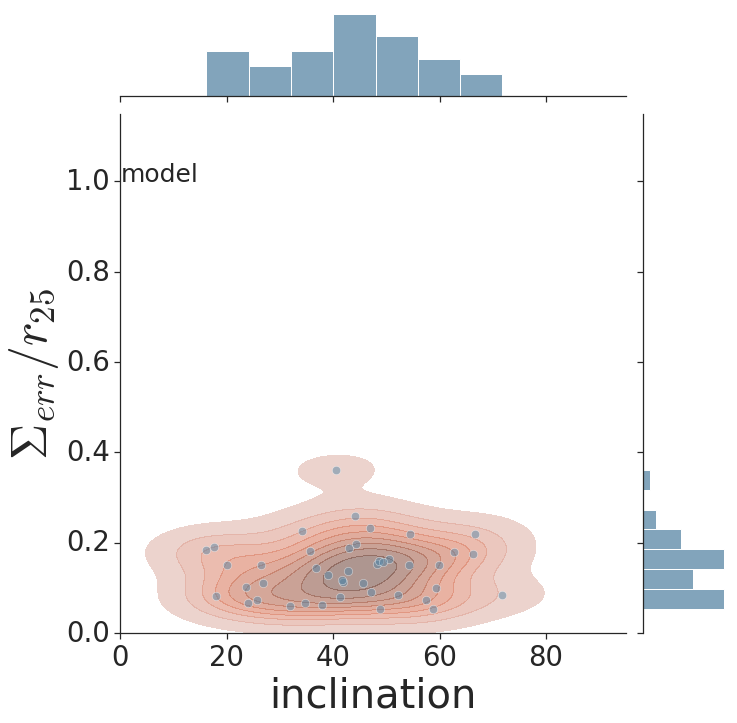

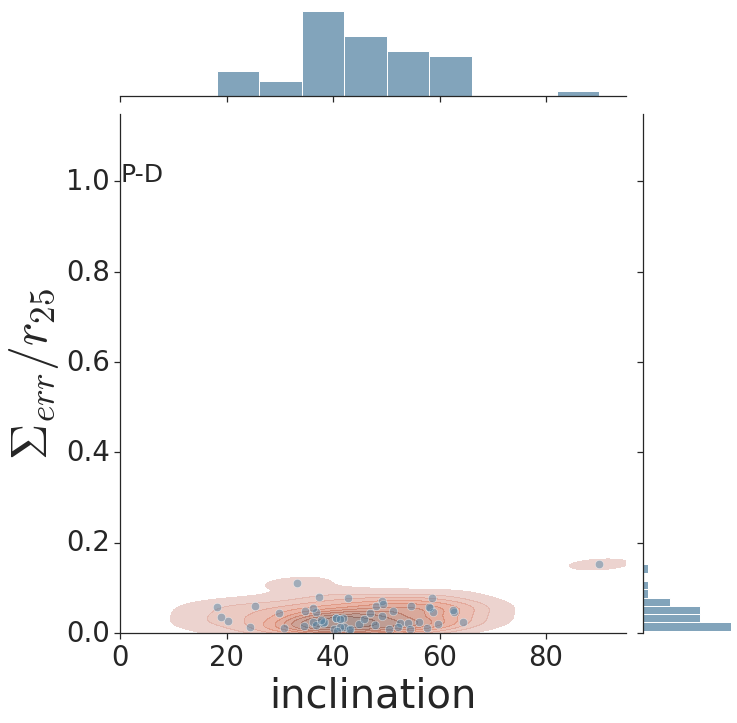

In [7]:
methods = ['offset', 'F-B', 'T-W', 'metallicity', 'morph', 'model', 'P-D']
for ind,name in enumerate(methods):
    
    dff = df.loc[df.method == name]
    gf = dff.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
    gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
    gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
    gf['far_cr'] = gf['cr_r'].apply(max)

    altnames = []
    for val in gf['altname']:
        altnames.append(val[0])

    df_incl = pd.read_csv('./../data/info_about_galaxies/incl_data.csv',index_col=0)    
    incl_array=[]
    for i,val in enumerate(altnames):
    
        try:
            incl = df_incl[df_incl['name']==val].incl.to_numpy()
            if incl > 0.:
                incl_array.append(incl[0])
            else:
                incl_array.append(0)
        except:
            incl_array.append(0)
        
    gf['incl'] = incl_array 
    gf__ = gf[gf['cover_CR']>0]
    gf_ = gf__[gf__['incl']>0]
    
    g1=sns.jointplot(data=gf_, x='incl', y='cover_CR', s=70, color='#5886a5', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=5)

    g1.plot_joint(sns.kdeplot, color="#df8d77", zorder=0, levels=10,fill=True, alpha=0.6)
    ax = g1.ax_joint
    ax.set_xlim(0,95)
    ax.set_ylim(0,1.15)
    ax.set_xlabel(r'inclination',fontsize=40)
    ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=50)
    ax.text(0.1, 1, name, fontsize=25)

/tmp/ipykernel_7219/3192535819.py:15: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if incl > 0.:


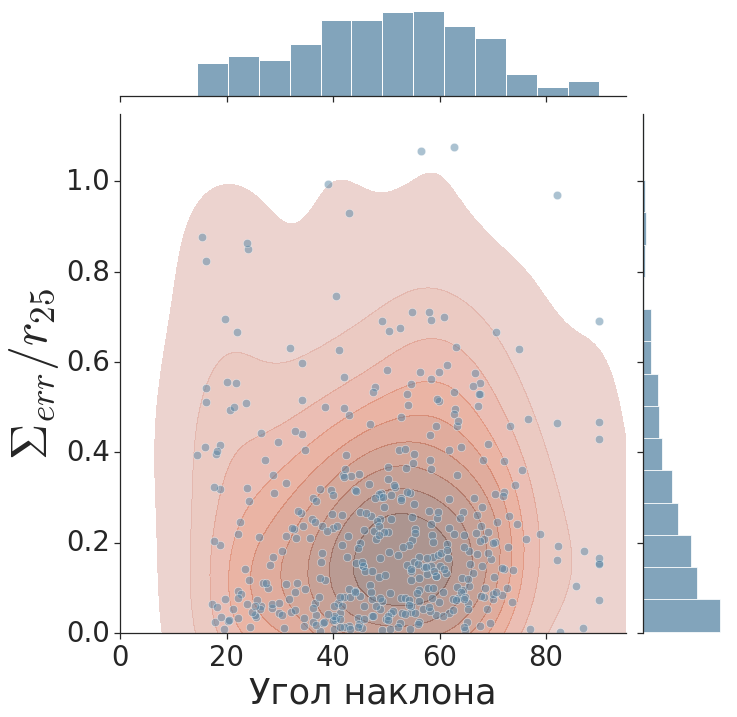

In [9]:
gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)
altnames = []
for val in gf['altname']:
    altnames.append(val[0])

df_incl = pd.read_csv('./../../data/info_about_galaxies/incl_data.csv',index_col=0)    
incl_array=[]
for i,val in enumerate(altnames):

    try:
        incl = df_incl[df_incl['name']==val].incl.to_numpy()
        if incl > 0.:
            incl_array.append(incl[0])
        else:
            incl_array.append(0)
    except:
        incl_array.append(0)

gf['incl'] = incl_array 
gf__ = gf[gf['cover_CR']>0]
gf_ = gf__[gf__['incl']>0]

g1=sns.jointplot(data=gf_, x='incl', y='cover_CR', s=70, color='#5886a5', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=5)

g1.plot_joint(sns.kdeplot, color="#df8d77", zorder=0, levels=10,fill=True, alpha=0.6)
ax = g1.ax_joint
ax.set_xlim(0,95)
ax.set_ylim(0,1.15)
ax.set_xlabel(r'Угол наклона',fontsize=35)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=50)
plt.savefig('./diploma_images/cover_incl.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

### Main info

In [8]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 
df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']
# df = df.loc[df.method != 'potential-density']
# df = df.loc[df.method != 'bar-torque']

In [9]:
gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))

In [10]:
gf['cr_number'] = [len(row) for row in gf['cr'].values]

In [11]:
gf['methods_list'] = [list(set(row)) for row in gf['method'].values]

In [12]:
gf['method_number'] = [len(row) for row in gf['methods_list'].values]

In [13]:
gf

,cr,cr_r,cr_l,altname,method,crs,cover_CR,cr_number,methods_list,method_number
altname,,,,,,,,,,
2MASX J14192411+4554021,[12.52978723158978],[2.38844113816591],[0.22414441060919713],[2MASX J14192411+4554021],[T-W],"[(0.22414441060919713, 2.38844113816591)]",2.164297,1,[T-W],1
2MASX J14213483+4021294,[24.045877101006205],[1.8082237785050361],[0.7486377071651238],[2MASX J14213483+4021294],[T-W],"[(0.7486377071651238, 1.8082237785050361)]",1.059586,1,[T-W],1
CGCG 008-010,[21.9],[0.8990053557765876],[0.7765876052027544],[CGCG 008-010],[gaps],"[(0.7765876052027544, 0.8990053557765876)]",0.122418,1,[gaps],1
CGCG 013-075,"[12.6, 21.19843157006126]","[0.5047801147227533, 0.8106474787786333]","[0.45889101338432126, 0.8106474787786333]","[CGCG 013-075, CGCG 013-075]","[gaps, rings]","[(0.45889101338432126, 0.5047801147227533), (0...",0.045889,2,"[gaps, rings]",2
CGCG 039-041,[21.28748439607381],[0.647035999880663],[0.647035999880663],[CGCG 039-041],[rings],"[(0.647035999880663, 0.647035999880663)]",0.000000,1,[rings],1
...,...,...,...,...,...,...,...,...,...,...
WISEA J162050.98+574408.7,[13.6],[0.5897905226764287],[0.5165751474476307],[WISEA J162050.98+574408.7],[gaps],"[(0.5165751474476307, 0.5897905226764287)]",0.073215,1,[gaps],1
WISEA J162259.35+464031.2,[7.955328738590675],[0.8143452806591037],[0.5197034755261157],[WISEA J162259.35+464031.2],[T-W],"[(0.5197034755261157, 0.8143452806591037)]",0.294642,1,[T-W],1
WISEA J163233.73+390751.8,[2.449917932954063],[0.318605622336181],[0.16979348409867204],[WISEA J163233.73+390751.8],[T-W],"[(0.16979348409867204, 0.318605622336181)]",0.148812,1,[T-W],1


In [14]:
gff = gf[gf['method_number']>1]


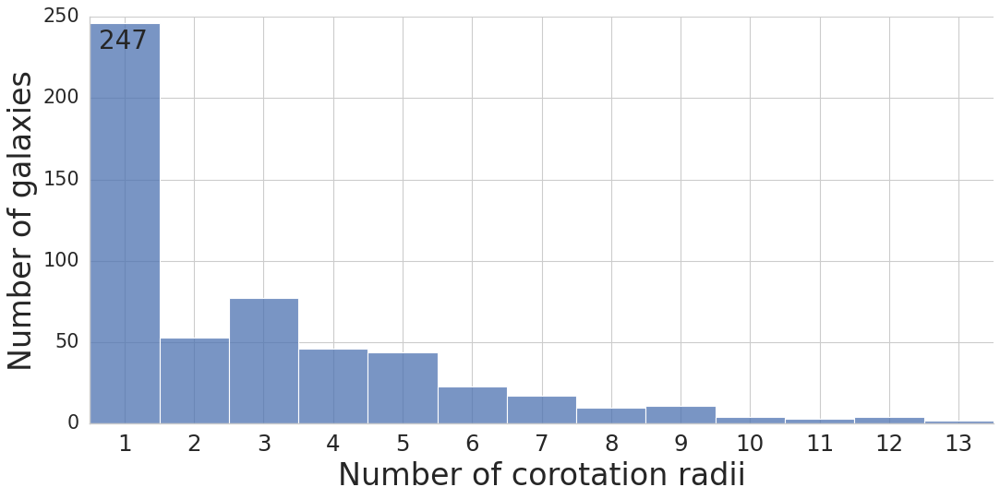

In [15]:
xtick = []
for i in range(0,14):
    xtick.append(str(int(i)))

import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')

sns.set_theme(style="whitegrid")
sns.color_palette("muted")
sns.set_context("notebook", font_scale=1.7, rc={"lines.linewidth": 6.5})

g = sns.displot(gf, x="cr_number", bins=[1,2, 3, 4, 5, 6, 7,8,9,10,11,12,13,14], height=7, aspect=2)
#g.despine(left=True)
g.set_axis_labels("Number of corotation radii", 'Number of galaxies', fontsize=30)
plt.text(1.13,230,'247', fontsize=25)
plt.grid(True)
plt.xticks(np.arange(len(xtick))+0.5, labels=xtick, fontsize=22)
plt.xlim(1,)
plt.savefig('./../images/images_RAA/cr_num_hist.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

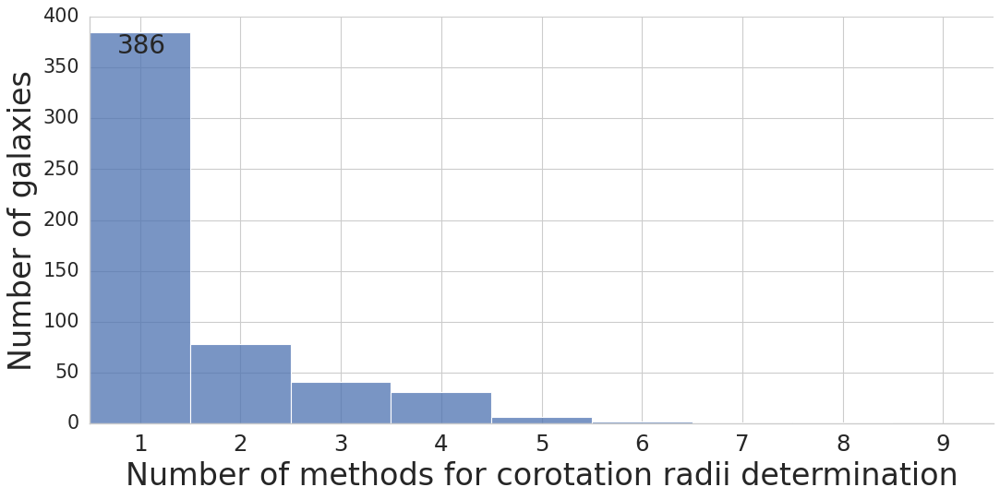

In [16]:
xtick = []
for i in range(0,10):
    xtick.append(str(int(i)))
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')

sns.set_theme(style="whitegrid")
sns.color_palette("muted")
sns.set_context("notebook", font_scale=1.7, rc={"lines.linewidth": 6.5})

g = sns.displot(gf, x="method_number", bins=[1, 2, 3, 4, 5, 6, 7,8,9,10], height=7, aspect=2)
#g.despine(left=True)
g.set_axis_labels("Number of methods for corotation radii determination", 'Number of galaxies', fontsize=30)

plt.text(1.27,364,'386', fontsize=25)
plt.xticks(np.arange(len(xtick))+0.5, labels=xtick, fontsize=22)
plt.xlim(1,)

plt.savefig('./../images//images_RAA/method_num_hist.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

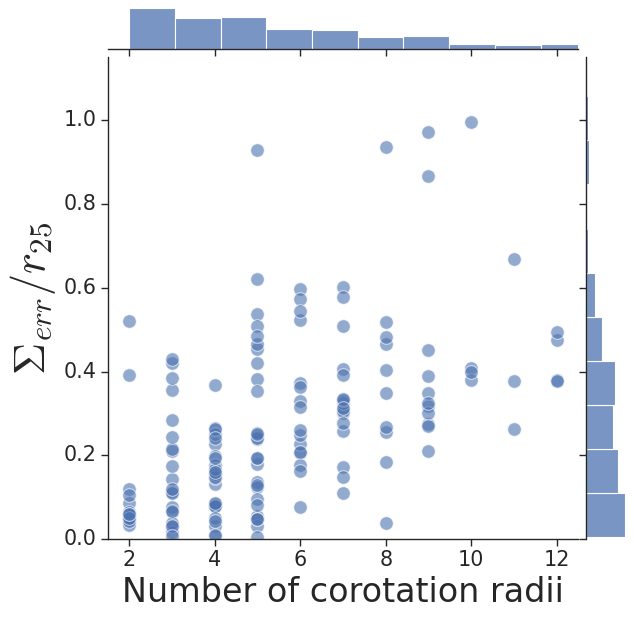

In [17]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')
sns.set(font_scale=1.7)
sns.set_style("ticks")
 
g1=sns.jointplot(data=gff, x='cr_number', y='cover_CR', s=150, color='b', alpha=0.6, marginal_ticks=False, dropna=True,  height=8, ratio=10)

#g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
ax = g1.ax_joint
ax.set_xlim(1.5,12.5)
ax.set_ylim(0,1.15)
ax.set_xlabel(r'Number of corotation radii',fontsize=30)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)
plt.savefig('./../images/images_RAA/cover_cr_num.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

(-0.5, 11.0)

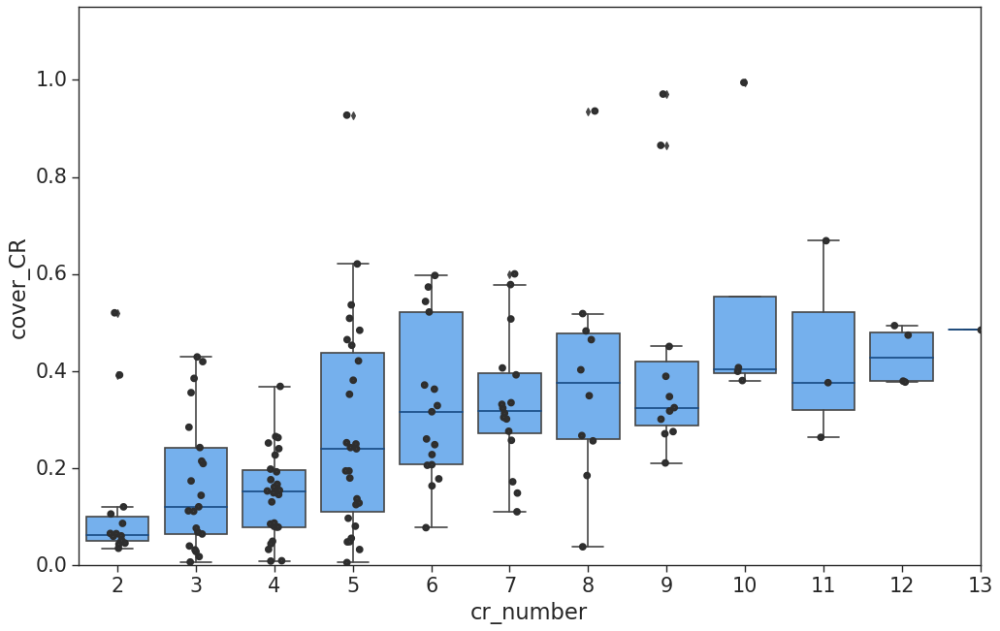

In [18]:
fig, ax = plt.subplots(figsize=(15,9))
sns.boxplot(
    data=gff, x="cr_number", y="cover_CR",
    orient='v',
    boxprops={"facecolor": '#75b0ed'},
    medianprops={"color": "#154983"},
)
sns.stripplot(data=gff, x="cr_number", y="cover_CR",
              size=4, color=".3", linewidth=3)
plt.ylim(0,1.15)
plt.xlim(-0.5,11)

In [19]:


galnames = []
for val in df['altname']:
    galnames.append(val)
    
galnames = list(set(galnames))

for name in galnames:
    
    methods = []
    index = []
    for ind,row in df[df['altname']==name].iterrows():
        methods.append(row['method'])
        index.append(ind)   
    
    if 'F-B' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='F-B') & (count==0):
                count+=1
            elif (m=='F-B') & (count>=1):
                count+=1
                df.drop(index[i],inplace=True)
                
    if 'widths' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='widths') & (count==0):
                count+=1
            elif (m=='widths') & (count>=1):
                count+=1
                df.drop(index[i],inplace=True)
                
    if 'P-D' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='P-D') & (count==0):
                count+=1
            elif (m=='P-D') & (count>=1):
                count+=1
                df.drop(index[i],inplace=True) 
                
    if 'potential-density' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='potential-density') & (count==0):
                count+=1
            elif (m=='potential-density') & (count>=1):
                count+=1
                df.drop(index[i],inplace=True)             
                    
    if 'T-W' in methods or 'T-W ' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='T-W' or m=='T-W ')  & count==0:
                count+=1
            elif (m=='T-W' or m=='T-W ') & count>=1:
                count+=1
                df.drop(index[i],inplace=True)
                    
    if 'bar-torque' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='bar-torque') & (count==0):
                count+=1
            elif (m=='bar-torque') & (count>=1):
                count+=1
                df.drop(index[i],inplace=True) 
                    
    if 'gaps' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='gaps') & (count==0):
                count+=1
            elif (m=='gaps') & (count>=1):
                count+=1
                df.drop(index[i],inplace=True) 
                    
    if 'rings' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='rings') & count==0:
                count+=1
            if (m=='rings') & count>=1:
                count+=1
                df.drop(index[i],inplace=True) 

    
    if 'metallicity' in methods or 'metallicity ' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='metallicity' or m=='metallicity ')  & count==0:
                count+=1
            elif (m=='metallicity' or m=='metallicity ') & count>=1:
                count+=1
                df.drop(index[i],inplace=True)
                    
                    
    if 'model' in methods or 'model ' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='model' or m=='model ')  & count==0:
                count+=1
            elif (m=='model' or m=='model ') & count>=1:
                count+=1
                df.drop(index[i],inplace=True) 
                    
    if 'morph' in methods or 'morph ' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='morph' or m=='morph ')  & count==0:
                count+=1
            elif (m=='morph' or m=='morph ') & count>=1:
                 df.drop(index[i],inplace=True) 
                    
    if 'offset' in methods or 'offset ' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='offset' or m=='offset ') & count==0:
                count+=1
            elif (m=='offset' or m=='offset ') & count>=1:
                 df.drop(index[i],inplace=True)        

In [20]:
df_ = df[df['method'].isin(['F-B','P-D','potential-density','T-W','metallicity','model','morph','offset', 'widths'])]

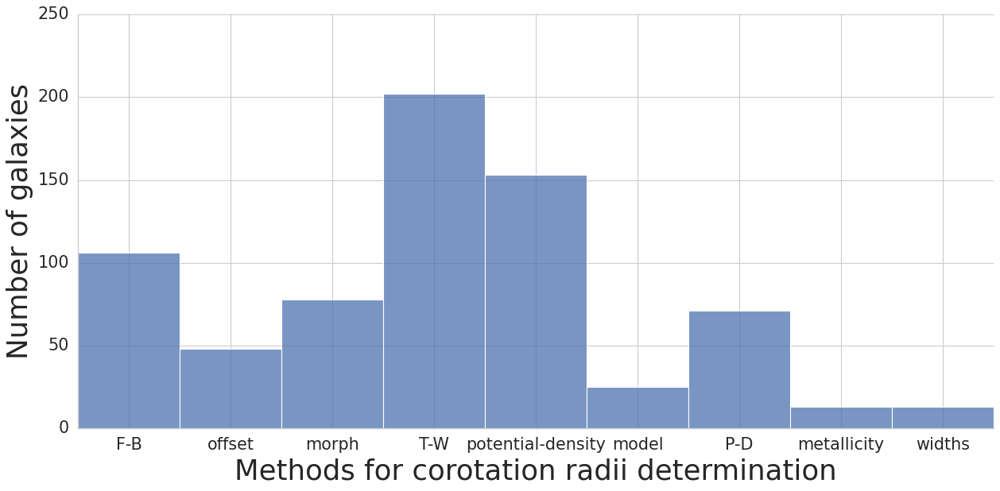

In [21]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')

sns.set_theme(style="whitegrid")
sns.color_palette("muted")
sns.set_context("notebook", font_scale=1.7, rc={"lines.linewidth": 6.5})

g = sns.displot(df_, x="method", height=8, aspect=2)
#g.despine(left=True)
g.set_axis_labels("Methods for corotation radii determination", r'Number of galaxies', fontsize=32)

plt.savefig('./../images/images_RAA/method_hist.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

### The farthest measument versus error coverage

In [22]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')

In [23]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 

df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']
# df = df.loc[df.method != 'potential-density']
# df = df.loc[df.method != 'bar-torque']

gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)
gf['cr_number'] = [len(row) for row in gf['cr'].values]
gf_ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3) & (gf['far_cr']<2)]


dp_names = ['NGC2403','NGC3686','NGC4321']
x_ax=[]
y_ax=[]
for name in dp_names:
    altname=Ned.query_object(name)['Object Name'][0]
    x_ax.append(gf_[gf_.index==altname]['far_cr'].values[0])
    y_ax.append(gf_[gf_.index==altname]['cover_CR'].values[0])

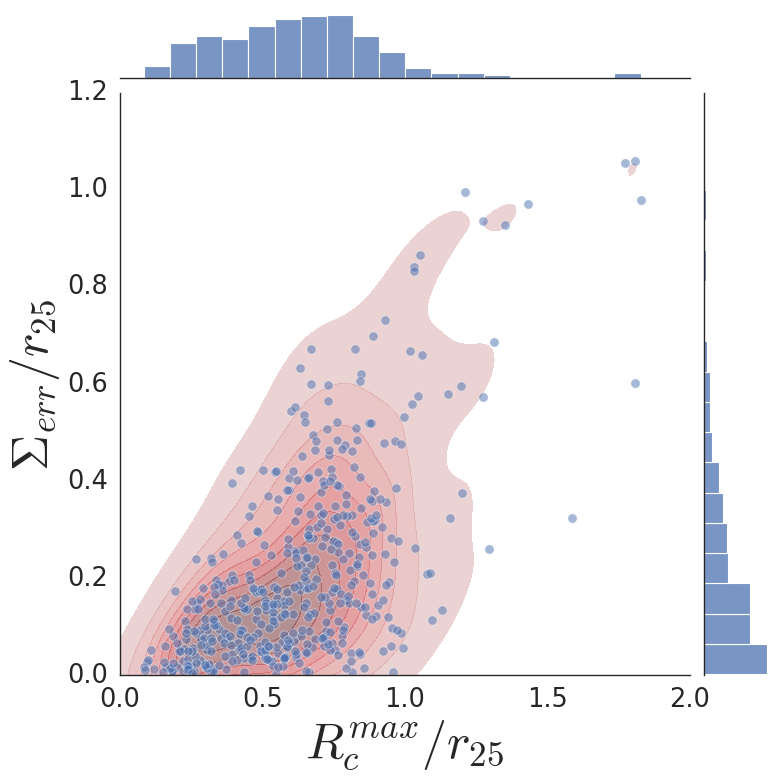

In [24]:
sns.set_theme(style="white")
sns.color_palette("muted")
sns.set_context("notebook", font_scale=2.1, rc={"lines.linewidth": 6.5})
g1=sns.jointplot(data=gf_, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)

ax = g1.ax_joint

#ax.plot([0,1],[0,2],color='k', lw=1)
ax.set_xlim(0,2.)
ax.set_ylim(0,1.2)

# ax.scatter(x_ax[0],y_ax[0],marker='s',color='k',s=100)
# ax.scatter(x_ax[1],y_ax[1],marker='s',color='k',s=100)
# ax.scatter(x_ax[2],y_ax[2],marker='s',color='k',s=100)

ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)
plt.savefig('./../images/images_RAA/cover_cr_.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

In [25]:
from scipy. stats import pearsonr

In [26]:
pearsonr(gf_['far_cr'],gf_['cover_CR'])

PearsonRResult(statistic=0.6318344536025788, pvalue=7.477288910850011e-53)

(0.0, 1.15)

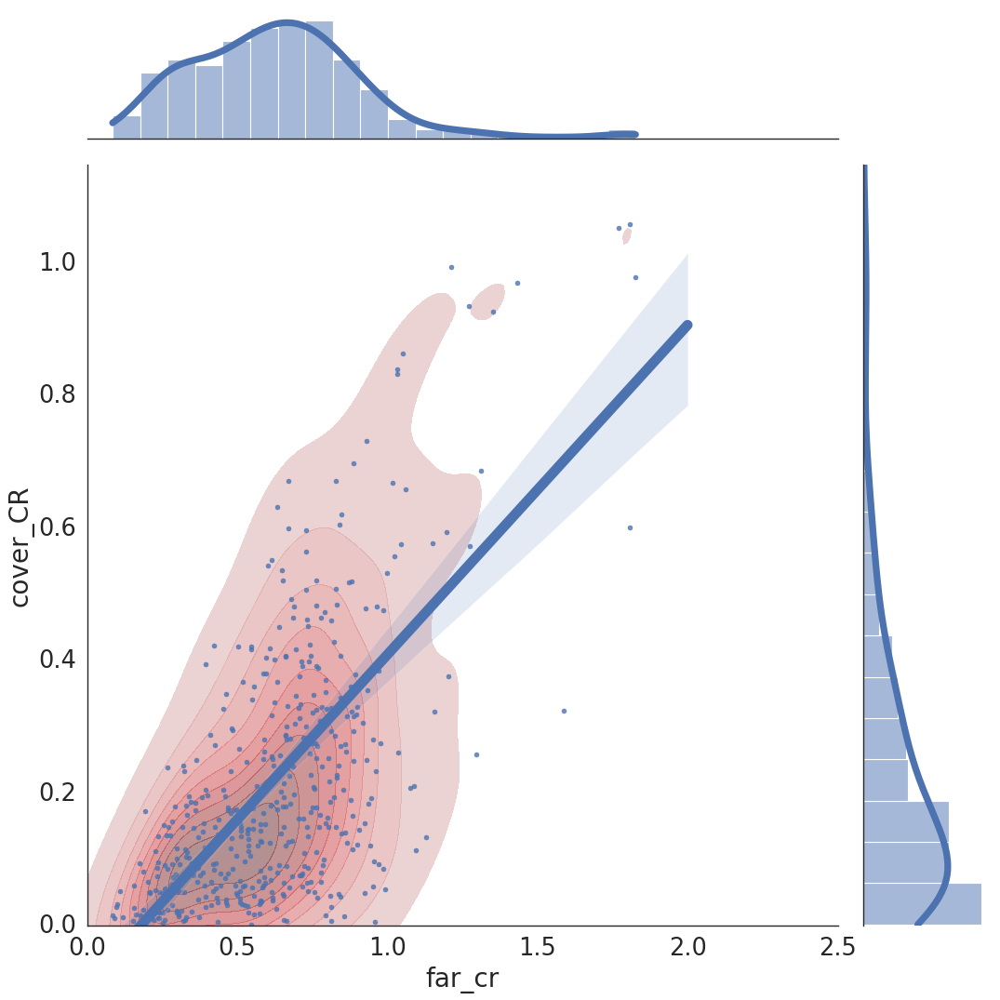

In [27]:
g1=sns.jointplot(data=gf_, x='far_cr', y='cover_CR',kind="reg", color='b',truncate=False, height=14)
g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)

ax = g1.ax_joint

#ax.plot([0,1],[0,2],color='k', lw=1)
ax.set_xlim(0,2.5)
ax.set_ylim(0,1.15)

Text(94.75974839409726, 0.5, '$\\Sigma_{err}/r_{25}$')

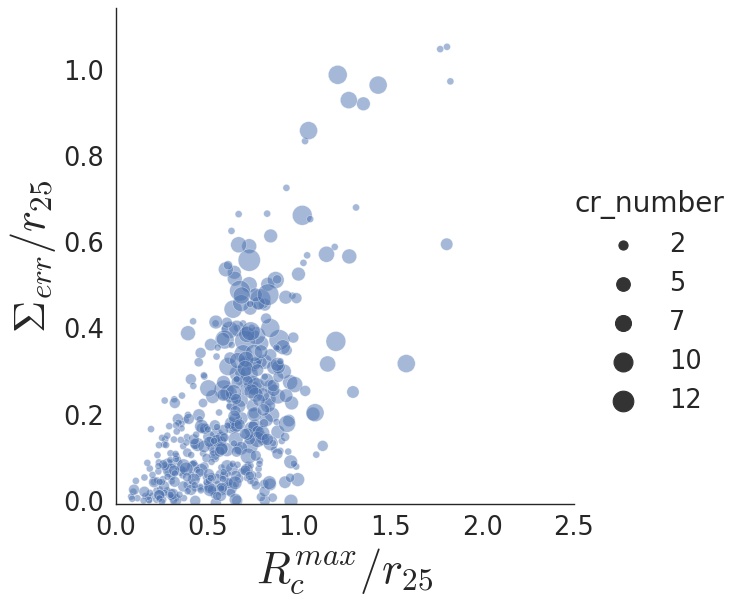

In [28]:
gf__ = gf_[gf_['cr_number']<15]

sns.relplot(data=gf__, x='far_cr', y='cover_CR', size="cr_number",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=8)
plt.xlim(0,2.5)
plt.ylim(0,1.15)
plt.xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
plt.ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)


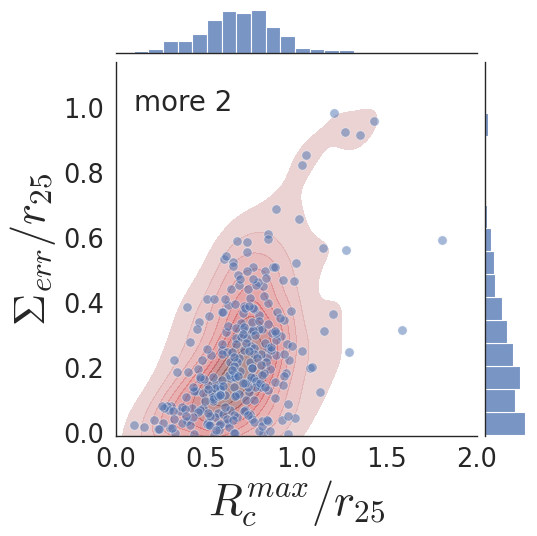

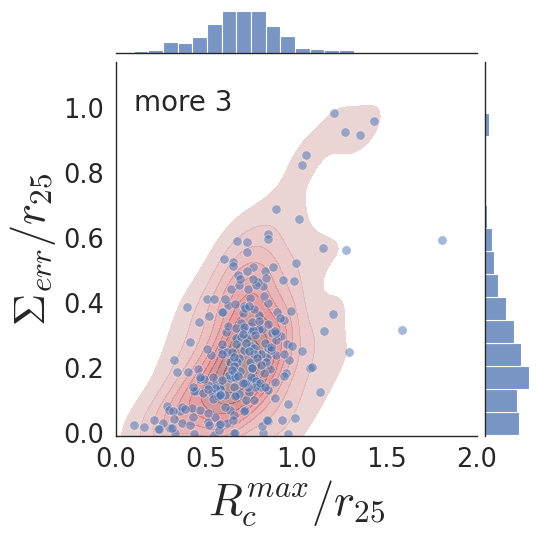

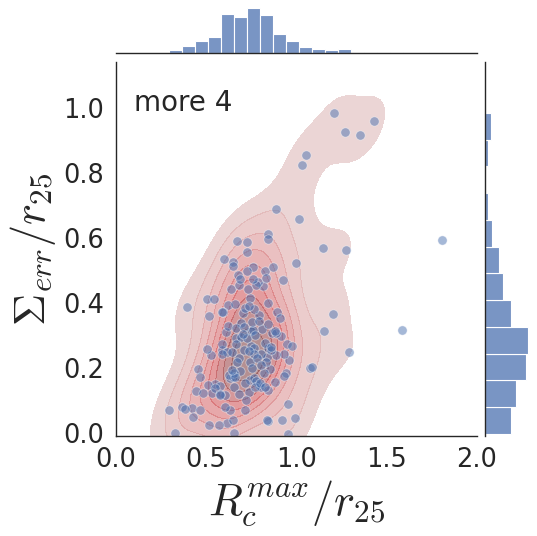

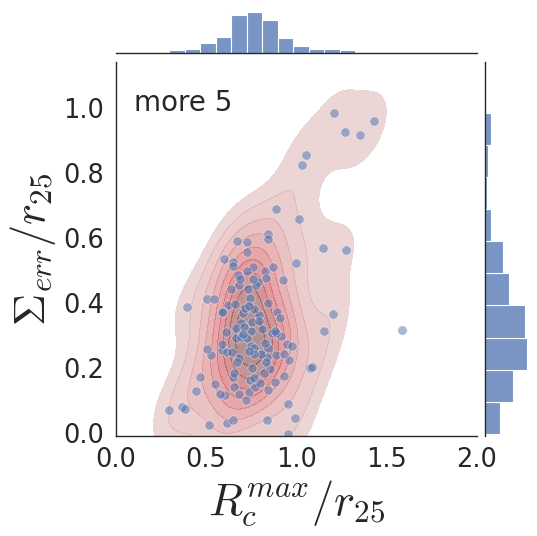

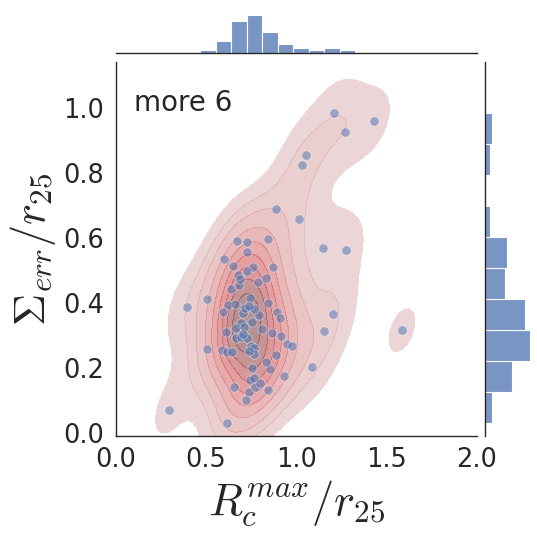

In [29]:
cr_num_bound = [2,3,4,5,6]

for bound in cr_num_bound:
    gf__ = gf_[gf_['cr_number']>=bound]
    g1=sns.jointplot(data=gf__, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=7, ratio=7)

    g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
    ax = g1.ax_joint
    
#ax.plot([0,1],[0,2],color='k', lw=1)
    ax.set_xlim(0,2)
    ax.set_ylim(0,1.15)

    ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
    ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)
    ax.text(0.1, 1,'more '+ str(bound), fontsize=25)

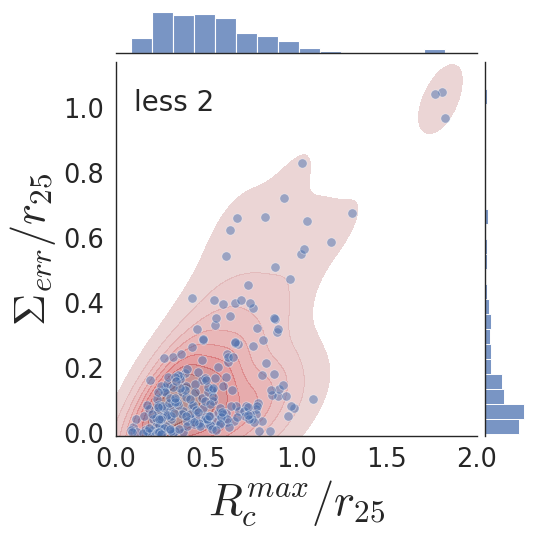

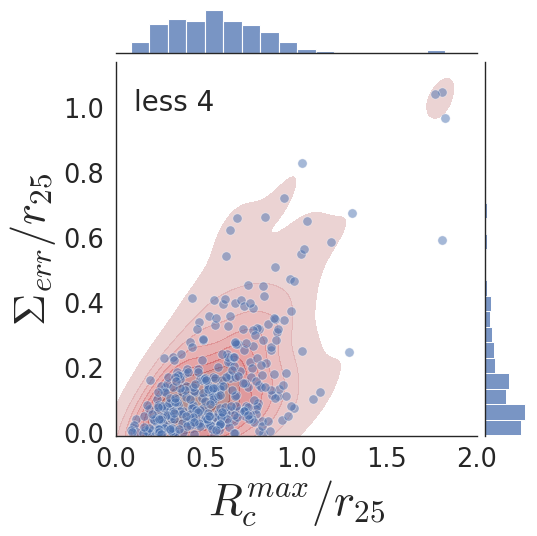

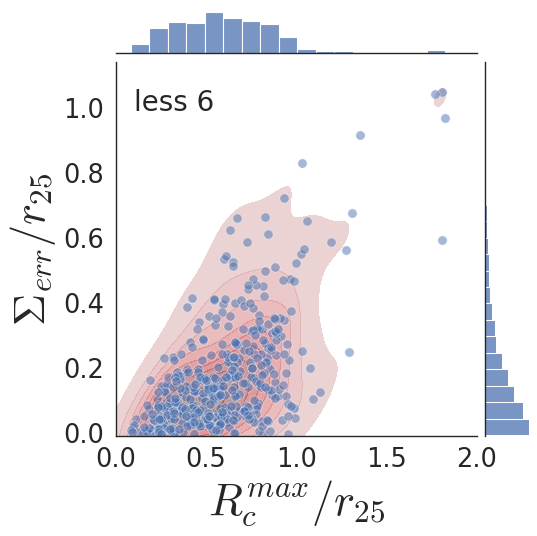

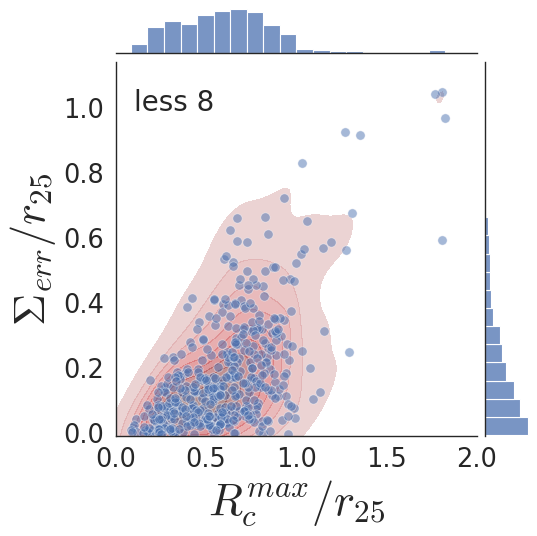

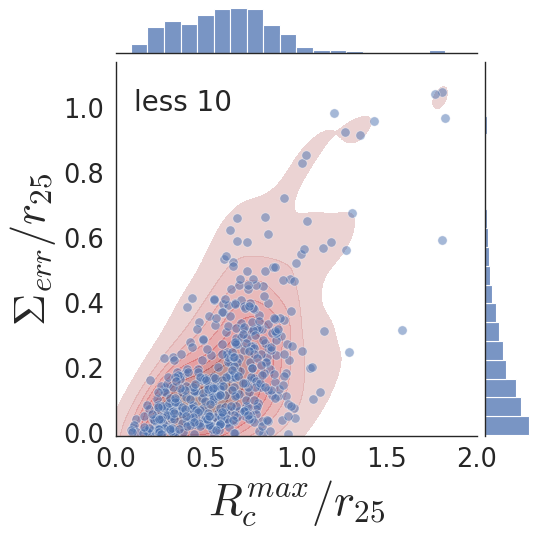

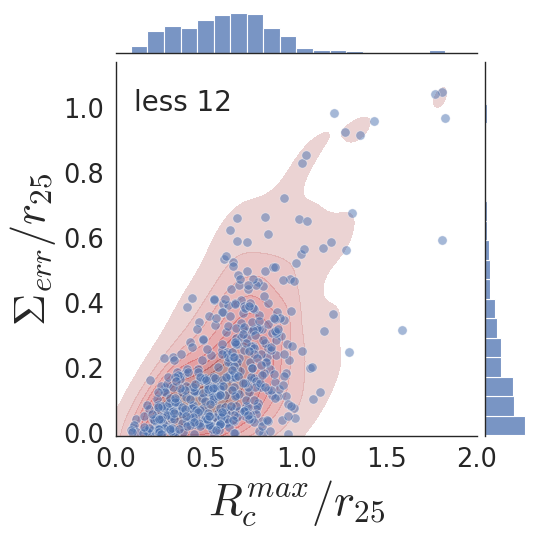

In [30]:
cr_num_bound = [2,4,6,8,10,12]

for bound in cr_num_bound:
    gf__ = gf_[gf_['cr_number']<=bound]
    g1=sns.jointplot(data=gf__, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=7, ratio=7)

    g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
    ax = g1.ax_joint
    
#ax.plot([0,1],[0,2],color='k', lw=1)
    ax.set_xlim(0,2.)
    ax.set_ylim(0,1.15)

    ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
    ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)
    ax.text(0.1, 1,'less '+ str(bound), fontsize=25)

### The farthest measument versus error coverage for different methods

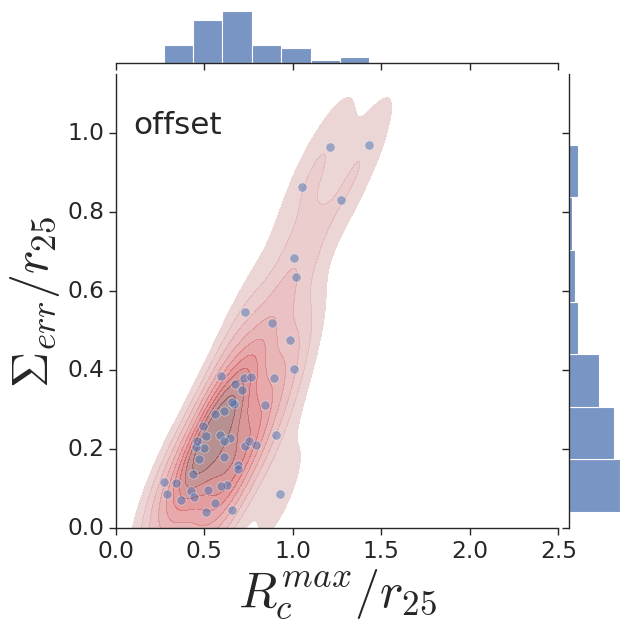

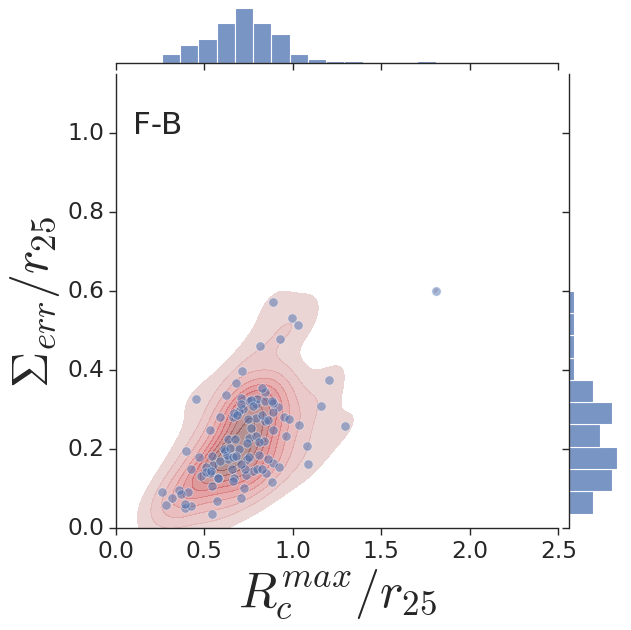

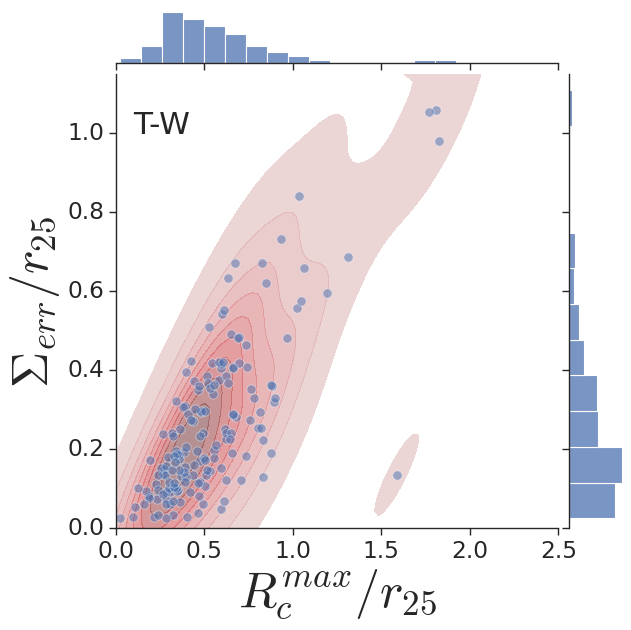

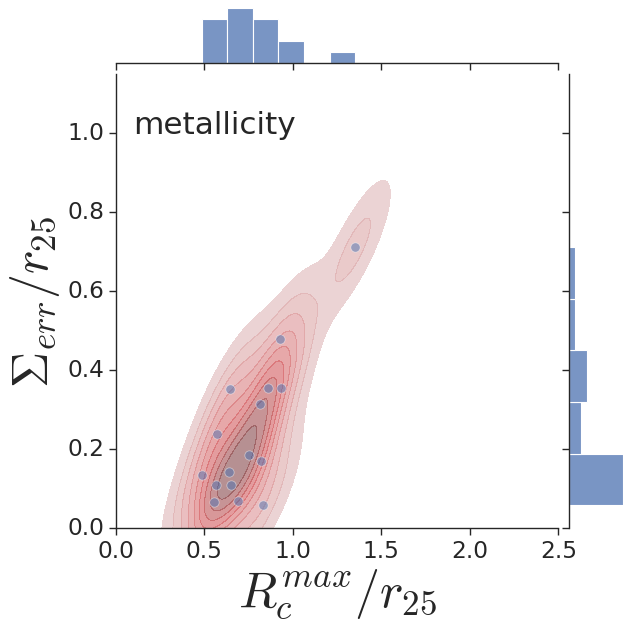

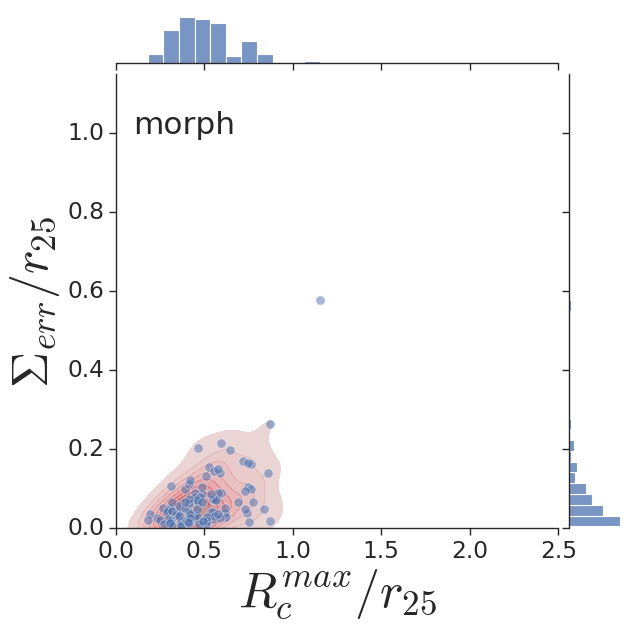

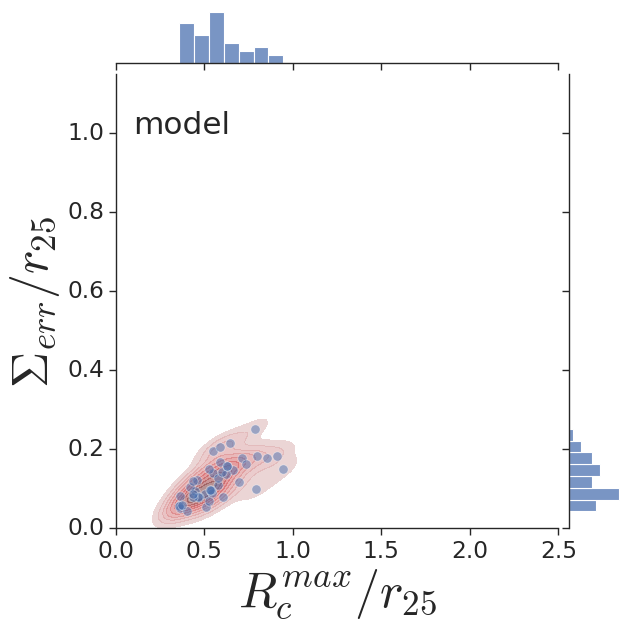

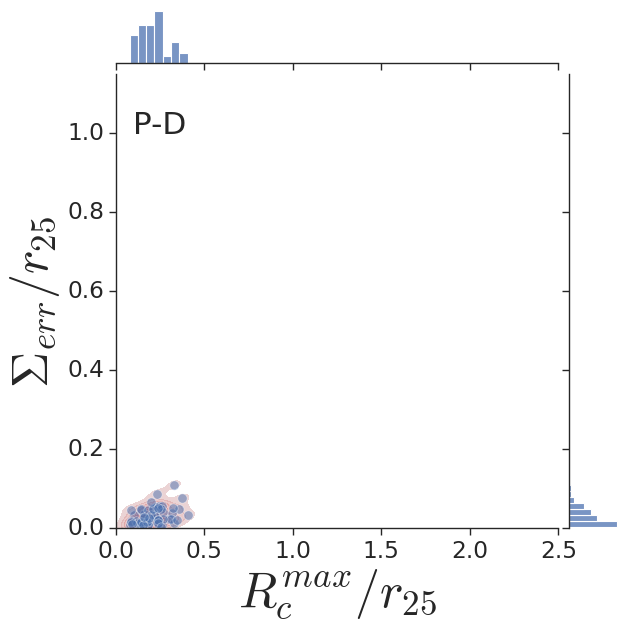

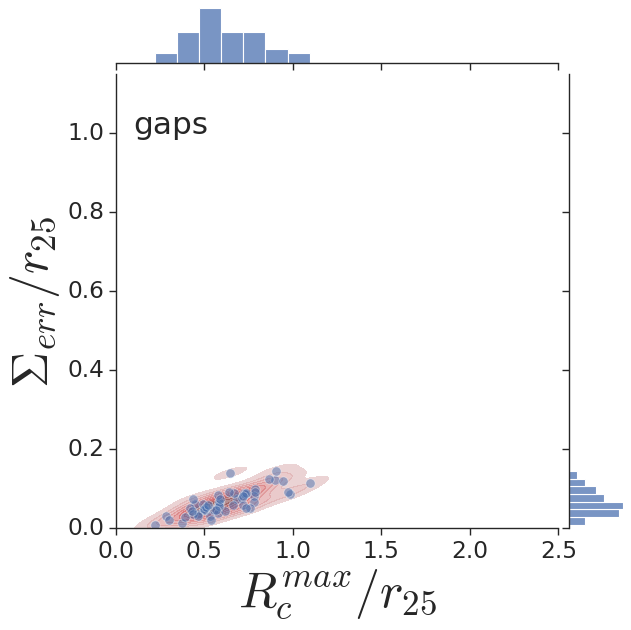

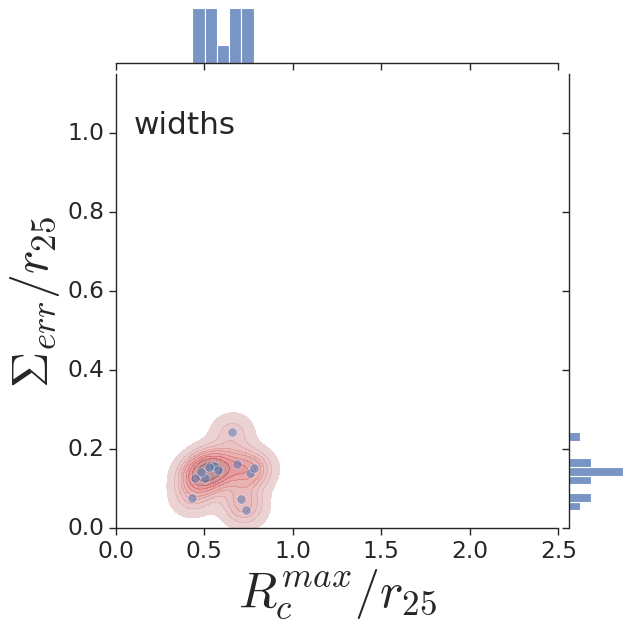

In [32]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 
methods = ['offset', 'F-B', 'T-W', 'metallicity', 'morph', 'model', 'P-D', 'gaps', 'widths']

df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']

for ind,name in enumerate(methods):
    
    dff = df.loc[df.method == name]
    gf = dff.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
    gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
    gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
    gf['far_cr'] = gf['cr_r'].apply(max)
    gf_ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]
    
    
    sns.set(font_scale=1.9)
    sns.set_style("ticks")
    g1=sns.jointplot(data=gf_, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=8, ratio=7)

    g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
    ax = g1.ax_joint
    ax.set_xlim(0,2.5)
    ax.set_ylim(0,1.15)
    ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
    ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)
    ax.text(0.1, 1, name, fontsize=28)
    plt.savefig('./../images/images_RAA/cover_'+name+'.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

In [33]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 

df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']

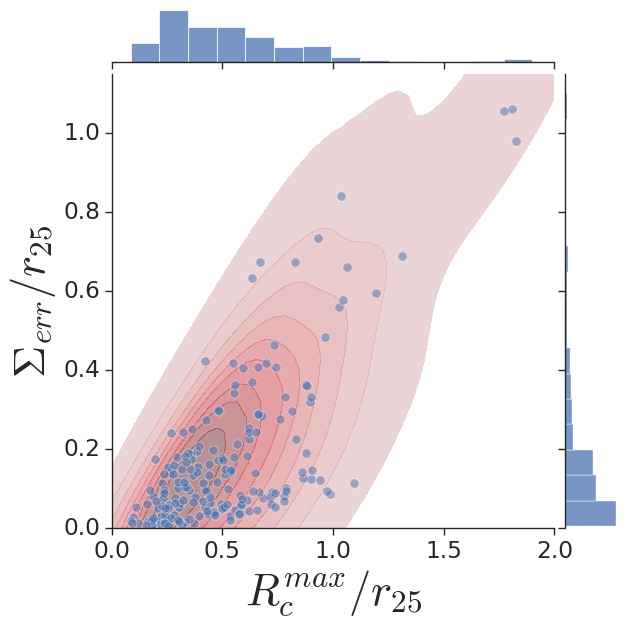

In [34]:
gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)
gf['cr_number'] = [len(row) for row in gf['cr'].values]
gf_ = gf[gf['cover_CR']>0]

gf_1cr = gf_[gf_['cr_number']==1]

sns.set(font_scale=1.9)
sns.set_style("ticks")

g1=sns.jointplot(data=gf_1cr, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=8, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
ax = g1.ax_joint
ax.set_xlim(0,2.)
ax.set_ylim(0,1.15)
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)
plt.savefig('./../images/images_RAA/cover_1cr.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

In [35]:
gf_1cr[gf_1cr['cover_CR']>0.8]

,cr,cr_r,cr_l,altname,method,crs,cover_CR,far_cr,cr_number
altname,,,,,,,,,
2MASX J14192411+4554021,[12.52978723158978],[2.38844113816591],[0.22414441060919713],[2MASX J14192411+4554021],[T-W],"[(0.22414441060919713, 2.38844113816591)]",2.164297,2.388441,1
2MASX J14213483+4021294,[24.045877101006205],[1.8082237785050361],[0.7486377071651238],[2MASX J14213483+4021294],[T-W],"[(0.7486377071651238, 1.8082237785050361)]",1.059586,1.808224,1
CGCG 213-005,[10.400548886538491],[1.0339782101032853],[0.19300082869124965],[CGCG 213-005],[T-W],"[(0.19300082869124965, 1.0339782101032853)]",0.840977,1.033978,1
CGCG 223-023,[27.70501661942411],[7.084605148484956],[0.7723588238658387],[CGCG 223-023],[T-W],"[(0.7723588238658387, 7.084605148484956)]",6.312246,7.084605,1
CGCG 224-065,[21.670266440343827],[2.7195693996566623],[0.6188939435206566],[CGCG 224-065],[T-W],"[(0.6188939435206566, 2.7195693996566623)]",2.100675,2.719569,1
CGCG 263-062,[21.86991922463612],[2.451804290376568],[0.47087245652876986],[CGCG 263-062],[T-W],"[(0.47087245652876986, 2.451804290376568)]",1.980932,2.451804,1
CGCG 390-083,[32.16213788360789],[1.826840838933417],[0.8473637904562688],[CGCG 390-083],[T-W],"[(0.8473637904562688, 1.826840838933417)]",0.979477,1.826841,1
NGC 4519,[68.0],[1.771217712177122],[0.7169214549288351],[NGC 4519],[T-W],"[(0.7169214549288351, 1.771217712177122)]",1.054296,1.771218,1
UGC 03944,[8.907298616860105],[0.9787050356037541],[-0.6447856872678551],[UGC 03944],[T-W],"[(-0.6447856872678551, 0.9787050356037541)]",1.623491,0.978705,1


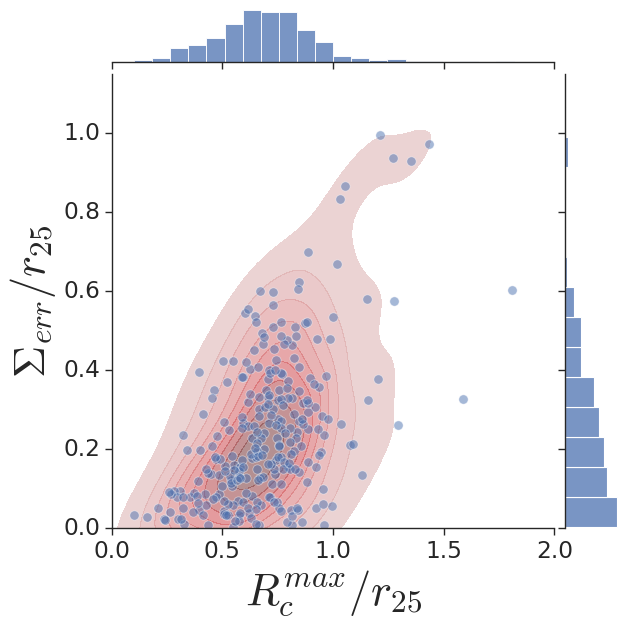

In [36]:
gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)
gf['cr_number'] = [len(row) for row in gf['cr'].values]
gf_ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]

gf_1cr = gf_[gf_['cr_number']>1]

g1=sns.jointplot(data=gf_1cr, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=8, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
ax = g1.ax_joint
ax.set_xlim(0,2.)
ax.set_ylim(0,1.15)
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)
plt.savefig('./../images/images_RAA/cover_more1cr.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

### Corotation radii measurements with error

In [37]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 

In [38]:
df['cr'] = df['cr']/df['r25_NED']
df['err_range'] = df['err_range']/df['r25_NED']

In [39]:
dff = df[(df['err_range']>0) & (df['err_range']<1.2)]

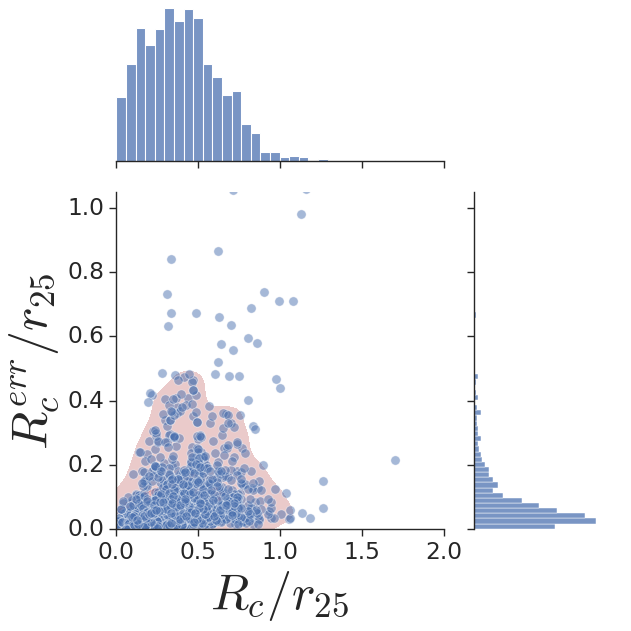

In [40]:
sns.set_context("notebook", font_scale=1.9, rc={"lines.linewidth": 6.5})
g1=sns.jointplot(data=dff, x='cr', y='err_range', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=True,  height=8, ratio=2 )

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=4,fill=True, alpha=0.6)
#g1.plot_marginal_ticks(fontsize=30)
ax = g1.ax_joint
ax.set_xlim(0,2.)
ax.set_ylim(0,1.05)

ax.set_xlabel(r'$R_{c}/r_{25}$',fontsize=45)
ax.set_ylabel(r'$R_{c}^{err}/r_{25}$',fontsize=45)

plt.savefig('./../images/images_RAA/cr_errors.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

In [41]:
df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']
df = df.loc[df.method != 'potential-density']
df = df.loc[df.method != 'bar-torque']
df = df.loc[df.method != 'gaps']
df = df.loc[df.method != 'ring']
dff = df[df['err_range']<0.25]

gf = dff.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)
gf_ = gf[gf['cover_CR']>0]

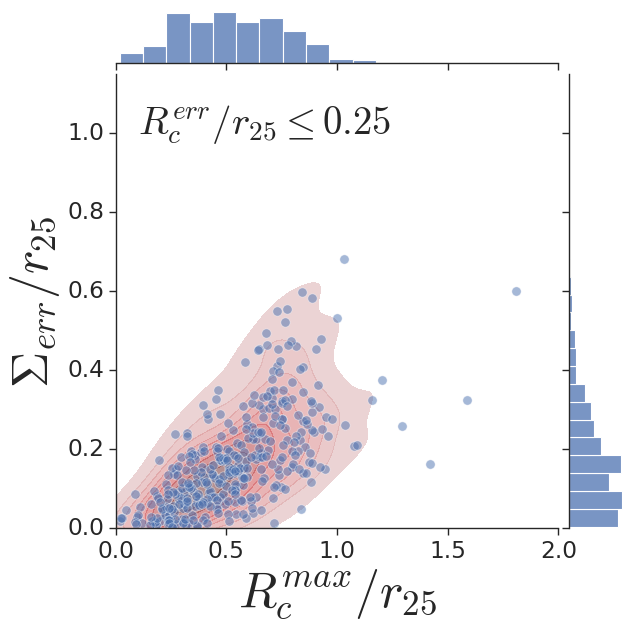

In [42]:
g1=sns.jointplot(data=gf_, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=8, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)

ax = g1.ax_joint

#ax.plot([0,1],[0,2],color='k', lw=1)
ax.set_xlim(0,2.)
ax.set_ylim(0,1.15)

# ax.scatter(x_ax[0],y_ax[0],marker='s',color='k',s=100)
# ax.scatter(x_ax[1],y_ax[1],marker='s',color='k',s=100)
ax.text(0.1, 1.,r'$R_{c}^{err}/r_{25} \leq 0.25$', fontsize=35)
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)
plt.savefig('./../images/images_RAA/cover_cr_cut.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

### The fraction of max(error)

In [43]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 

df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']
df = df.loc[df.method != 'potential-density']
df = df.loc[df.method != 'bar-torque']
df = df.loc[df.method != 'gaps']
df = df.loc[df.method != 'ring']

gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))

gf['far_cr'] = gf['cr_r'].apply(max)
gf['cr_number'] = [len(row) for row in gf['cr'].values]
gf['max_error'] = gf['crs'].apply(lambda l: max([(_[1] - _[0]) for _ in l]))
gf['max_err_part'] = gf['max_error']/gf['cover_CR']

gf_ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]
gff = gf_[gf_['cr_number']>1]

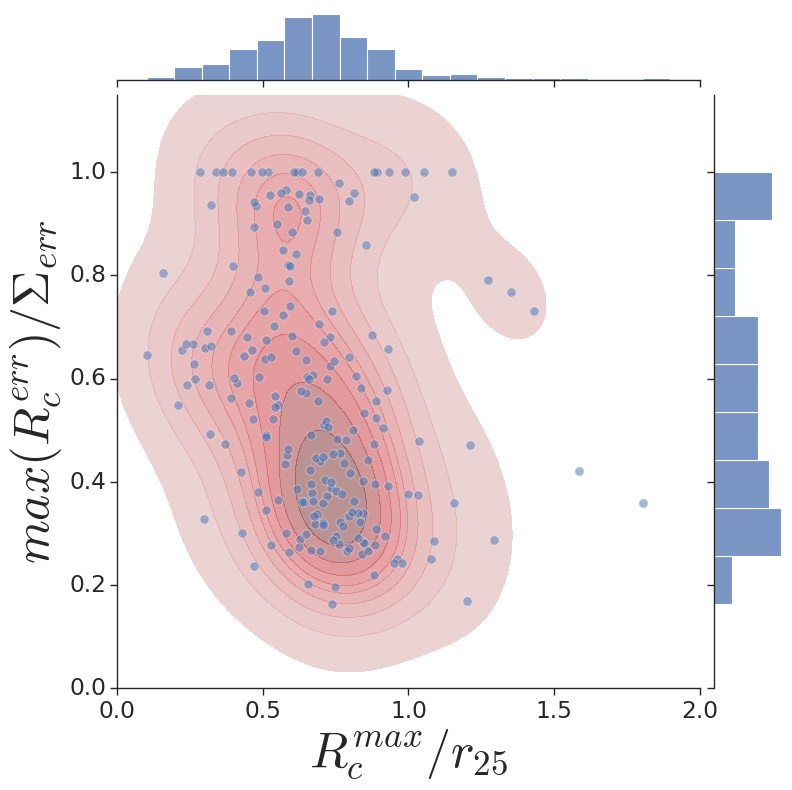

In [44]:
g1=sns.jointplot(data=gff, x='far_cr', y='max_err_part', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)

ax = g1.ax_joint

#ax.plot([0,1],[0,2],color='k', lw=1)
ax.set_xlim(0,2.)
ax.set_ylim(0,1.15)

# ax.scatter(x_ax[0],y_ax[0],marker='s',color='k',s=100)
# ax.scatter(x_ax[1],y_ax[1],marker='s',color='k',s=100)
# ax.text(0.1, 1.1,r'$R_{c}^{err}/r_{25} \leq 0.25$', fontsize=30)
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
ax.set_ylabel(r'$max(R_c^{err})/\Sigma_{err}$',fontsize=45)
plt.savefig('./../images/images_RAA/max_err.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

### Methods exclusion

#### Exclude offset

In [59]:
df = pd.read_csv('./../../data/crs/total_crs.csv',index_col=0)
df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']
df_offset = df.loc[df.method != 'offset']

In [60]:
gf = df_offset.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)

In [61]:
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]

In [62]:
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)

In [63]:
colors=['#4388b0','#d679bc','#ff9545']

In [64]:
altnames = []
for val in gf['altname']:
    altnames.append(val[0])

In [65]:
md=pd.read_table('Morf_type.tsv',sep=',')
dist_Mpc=[]
type_=[]
hubble_type=[]
dustpedia=[]
bar=[]
for i,val in enumerate(altnames):
    
    modz = hyp[hyp['name']==val].modz.to_numpy()
    Mpc = zToMpc(modz)
    if Mpc > 0.:
            dist_Mpc.append(Mpc[0])
    else:
            modz = hyp[hyp['name']==val].mod0.to_numpy()
            Mpc = zToMpc(modz) 
            if Mpc > 0.:
                dist_Mpc.append(Mpc[0])
            else:
                dist_Mpc.append(0.0)
                                
    t='nan'            
    for k, row in md[md['Altname']==val].iterrows():
        t=row['Type']
            
    type_.append(t)    
    h_type = hyp[hyp['name']==val].type.to_numpy()
            
    if (h_type == 'SBa') or (h_type == 'Sa') or (h_type == 'SABa'):
        hubble_type.append('Sa')
    elif (h_type == 'SBb') or (h_type == 'Sb') or (h_type == 'SABb') or (h_type == 'SABab') or (h_type == 'SBab') or (h_type == 'Sab'):
        hubble_type.append('Sb')
    elif (h_type == 'SBc') or (h_type == 'Sc') or (h_type == 'SABc') or (h_type == 'SABbc') or (h_type == 'SBbc') or (h_type == 'Sbc') or (h_type == 'Scd') or (h_type == 'SBcd') or (h_type == 'SBd') or (h_type == 'Sd') or (h_type == 'SABd'):
        hubble_type.append('Sc') 
    elif len(h_type)==0:
        hubble_type.append('nan')
    elif (h_type == 'SBm') or (h_type == 'Sm') or (h_type == 'SABm'):
        hubble_type.append('Sm')  
    else:    
        hubble_type.append(str(h_type[0]))
    
    try:      
        if (str(h_type[0][1])=='B') or (str(h_type[0][1])=='A'):
            bar.append('True')
            
        else:
            bar.append('False')
    except:
        
        bar.append('Nan')

In [66]:
gf['Type'] = type_
gf['Hubble Type'] = hubble_type
gf['Bar'] = bar
gf['dist_Mpc'] = dist_Mpc

In [67]:
gf__ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]
gf_ = gf__[gf__['dist_Mpc']>0]
gf_type = gf_[gf_['Type'].isin(['G','F','M'])]

In [68]:
gf_hubble =  gf_[gf_['Hubble Type'].isin(['Sa','Sb','Sc'])]
gf_hubble = gf_hubble.drop('CGCG 008-010',axis = 0)
gf_hubble = gf_hubble.drop('CGCG 106-036',axis = 0)

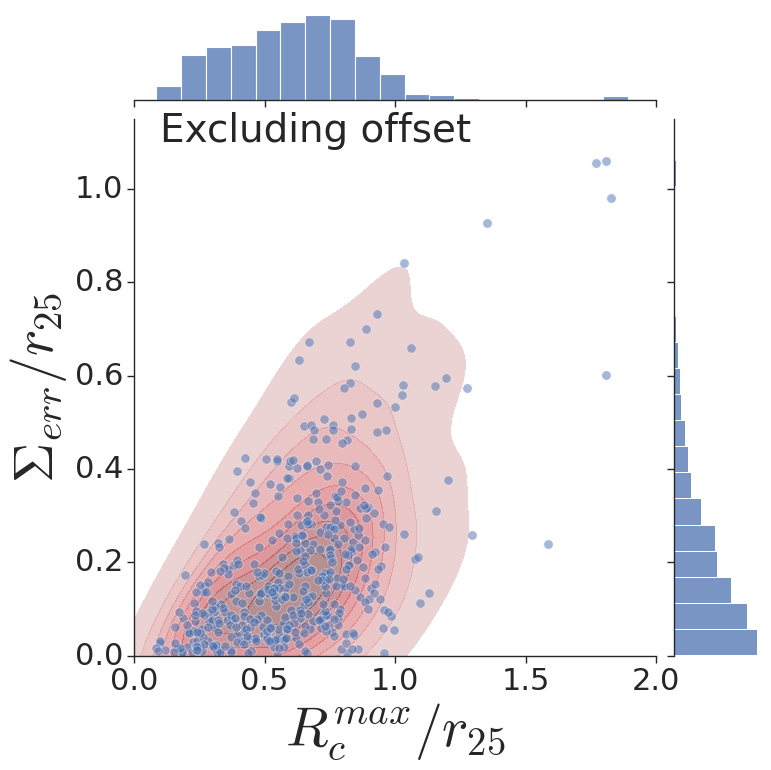

In [69]:
sns.set_style("ticks")
sns.color_palette("muted")
sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 6.5})
 
g1=sns.jointplot(data=gf_, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=5)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
ax = g1.ax_joint
ax.set_xlim(0,2.)
ax.set_ylim(0,1.15)
ax.text(0.1, 1.1,r'Excluding offset', fontsize=35)
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=50)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=50)
plt.savefig('./images_RAA/cover_cr_offset.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

(-0.05, 1.15)

<Figure size 680x800 with 0 Axes>

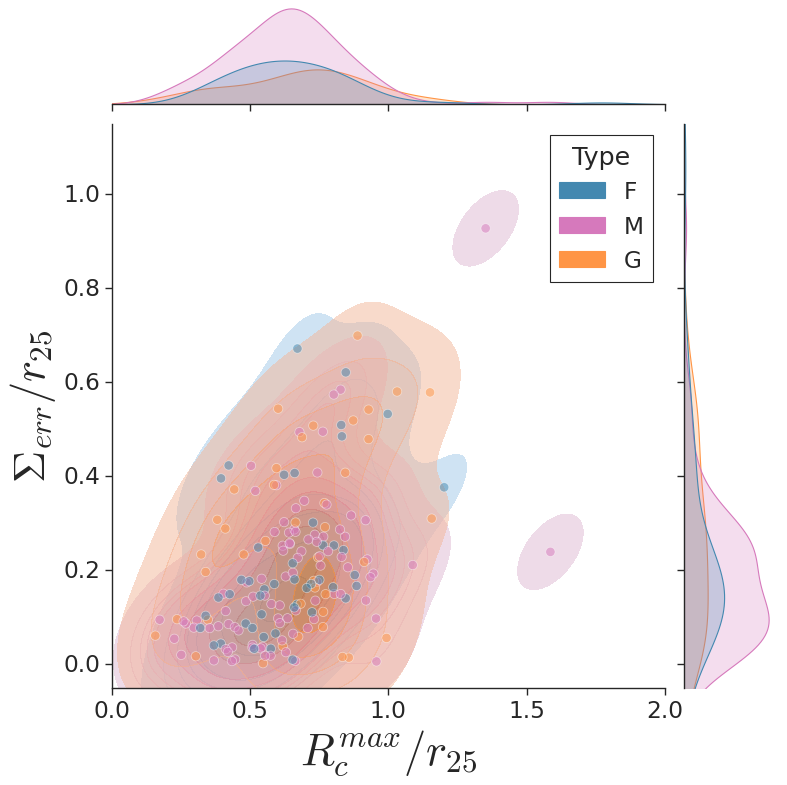

In [70]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')
fig = plt.figure(figsize=[8.5,10])

sns.set(font_scale=1.9)
sns.set_style("ticks")

g1=sns.jointplot(data=gf_type, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=5, hue='Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)

ax.set_xlim(0,2.)
ax.set_ylim(-0.05,1.15)

(-0.05, 1.15)

<Figure size 680x800 with 0 Axes>

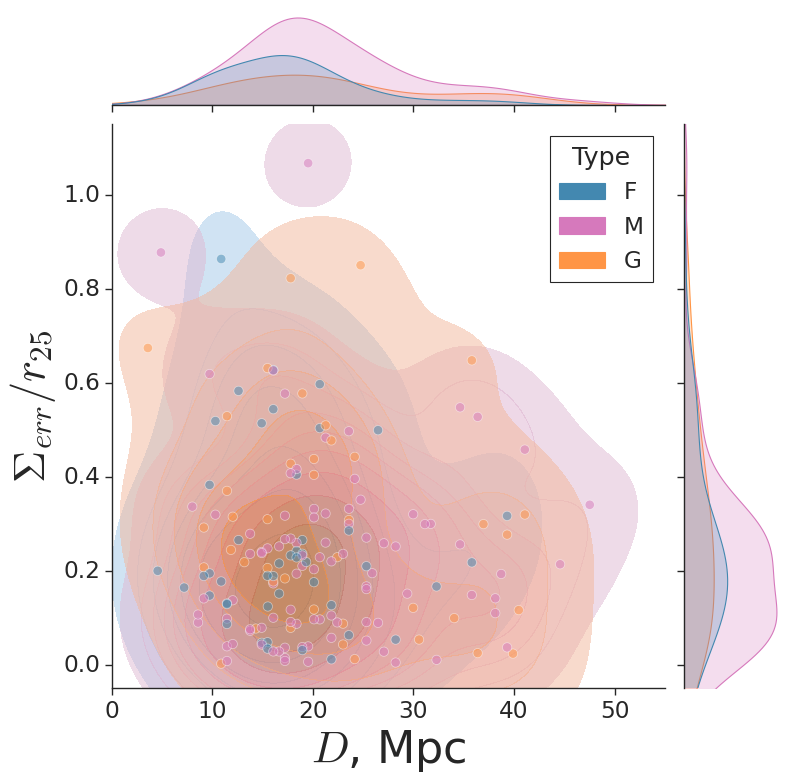

In [134]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_type, x='dist_Mpc', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=5,hue='Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint
ax.set_xlabel(r'$D$, Mpc',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)

ax.set_xlim(0,55)
ax.set_ylim(-0.05,1.15)

(-0.05, 1.1)

<Figure size 680x800 with 0 Axes>

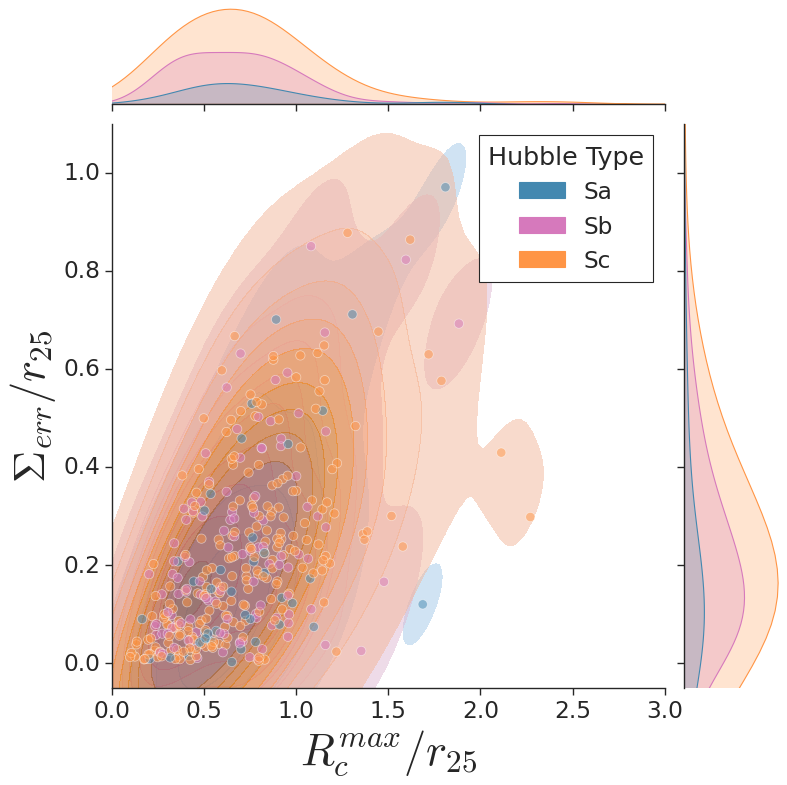

In [136]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_hubble, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, height=10, marginal_ticks=False, dropna=False, ratio=5,hue='Hubble Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint

ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)

ax.set_xlim(0,3.)
ax.set_ylim(-0.05,1.1)

#### Exclude Font-Beckman

In [79]:
df_FB = df.loc[df.method != 'F-B']

In [80]:
gf = df_FB.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)

In [81]:
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]

In [82]:
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)

In [83]:
colors=['#4388b0','#d679bc','#ff9545']

In [84]:
altnames = []
for val in gf['altname']:
    altnames.append(val[0])

In [85]:
md=pd.read_table('Morf_type.tsv',sep=',')
dist_Mpc=[]
type_=[]
hubble_type=[]
dustpedia=[]
bar=[]
for i,val in enumerate(altnames):
    
    modz = hyp[hyp['name']==val].modz.to_numpy()
    Mpc = zToMpc(modz)
    if Mpc > 0.:
            dist_Mpc.append(Mpc[0])
    else:
            modz = hyp[hyp['name']==val].mod0.to_numpy()
            Mpc = zToMpc(modz) 
            if Mpc > 0.:
                dist_Mpc.append(Mpc[0])
            else:
                dist_Mpc.append(0.0)
                                
    t='nan'            
    for k, row in md[md['Altname']==val].iterrows():
        t=row['Type']
            
    type_.append(t)    
    h_type = hyp[hyp['name']==val].type.to_numpy()
            
    if (h_type == 'SBa') or (h_type == 'Sa') or (h_type == 'SABa'):
        hubble_type.append('Sa')
    elif (h_type == 'SBb') or (h_type == 'Sb') or (h_type == 'SABb') or (h_type == 'SABab') or (h_type == 'SBab') or (h_type == 'Sab'):
        hubble_type.append('Sb')
    elif (h_type == 'SBc') or (h_type == 'Sc') or (h_type == 'SABc') or (h_type == 'SABbc') or (h_type == 'SBbc') or (h_type == 'Sbc') or (h_type == 'Scd') or (h_type == 'SBcd') or (h_type == 'SBd') or (h_type == 'Sd') or (h_type == 'SABd'):
        hubble_type.append('Sc') 
    elif len(h_type)==0:
        hubble_type.append('nan')
    elif (h_type == 'SBm') or (h_type == 'Sm') or (h_type == 'SABm'):
        hubble_type.append('Sm')  
    else:    
        hubble_type.append(str(h_type[0]))
    
    try:      
        if (str(h_type[0][1])=='B') or (str(h_type[0][1])=='A'):
            bar.append('True')
            
        else:
            bar.append('False')
    except:
        
        bar.append('Nan')

In [86]:
gf['Type'] = type_
gf['Hubble Type'] = hubble_type
gf['Bar'] = bar
gf['dist_Mpc'] = dist_Mpc

In [87]:
gf__ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]
gf_ = gf__[gf__['dist_Mpc']>0]
gf_type = gf_[gf_['Type'].isin(['G','F','M'])]

In [88]:
gf_hubble =  gf_[gf_['Hubble Type'].isin(['Sa','Sb','Sc'])]
gf_hubble = gf_hubble.drop('CGCG 008-010',axis = 0)
gf_hubble = gf_hubble.drop('CGCG 106-036',axis = 0)

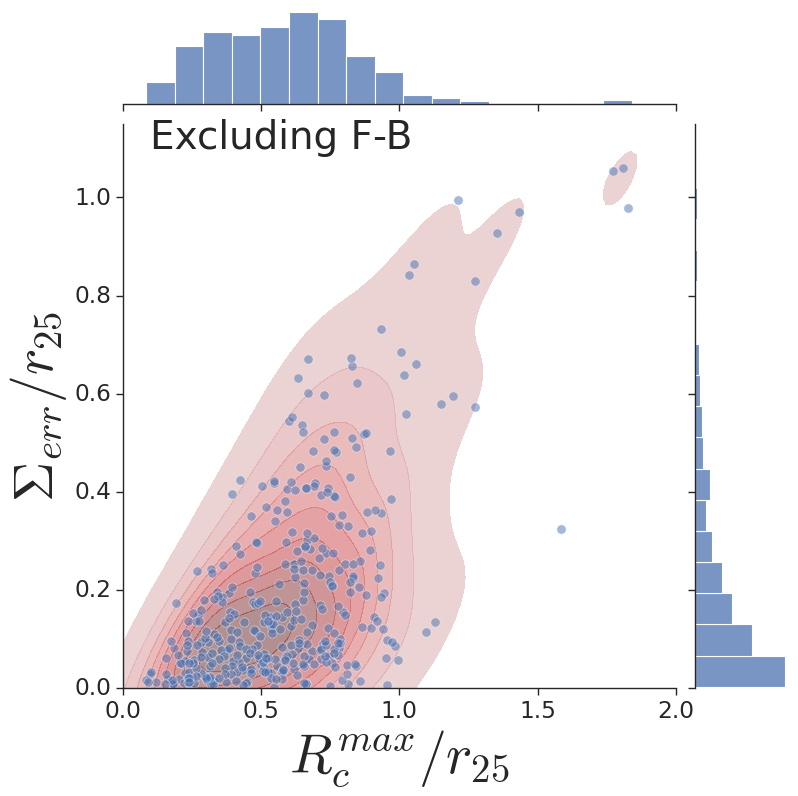

In [89]:

g1=sns.jointplot(data=gf_, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=5)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
ax = g1.ax_joint
ax.set_xlim(0,2.)
ax.set_ylim(0,1.15)
ax.text(0.1, 1.1,r'Excluding F-B', fontsize=35)
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=50)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=50)
plt.savefig('./images_RAA/cover_cr_FB.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

(-0.05, 1.15)

<Figure size 680x800 with 0 Axes>

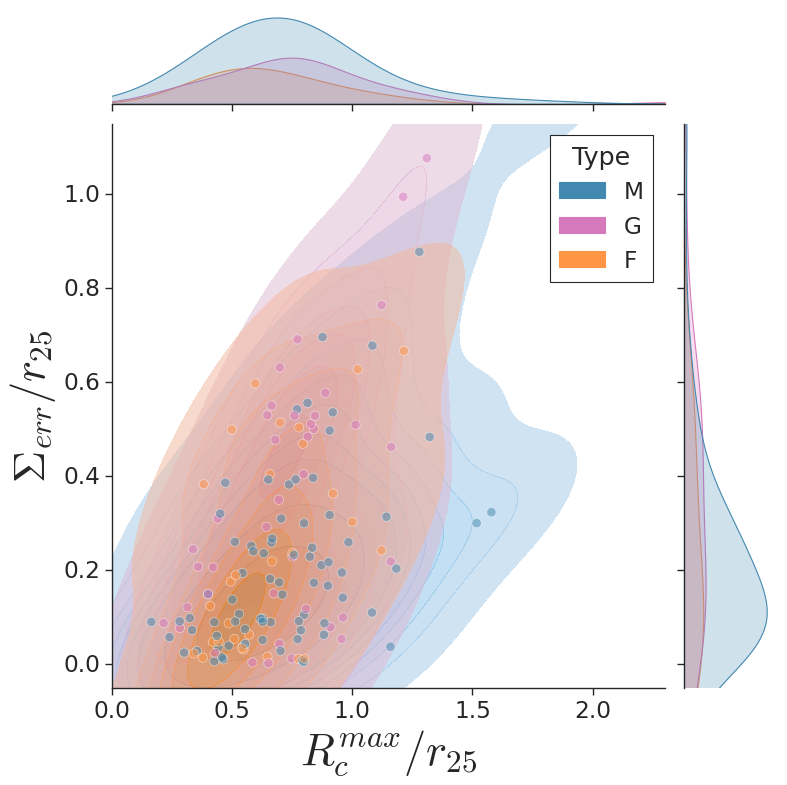

In [148]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')
fig = plt.figure(figsize=[8.5,10])

sns.set(font_scale=1.9)
sns.set_style("ticks")

g1=sns.jointplot(data=gf_type, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=5, hue='Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)

ax.set_xlim(0,2.3)
ax.set_ylim(-0.05,1.15)

(-0.05, 1.15)

<Figure size 680x800 with 0 Axes>

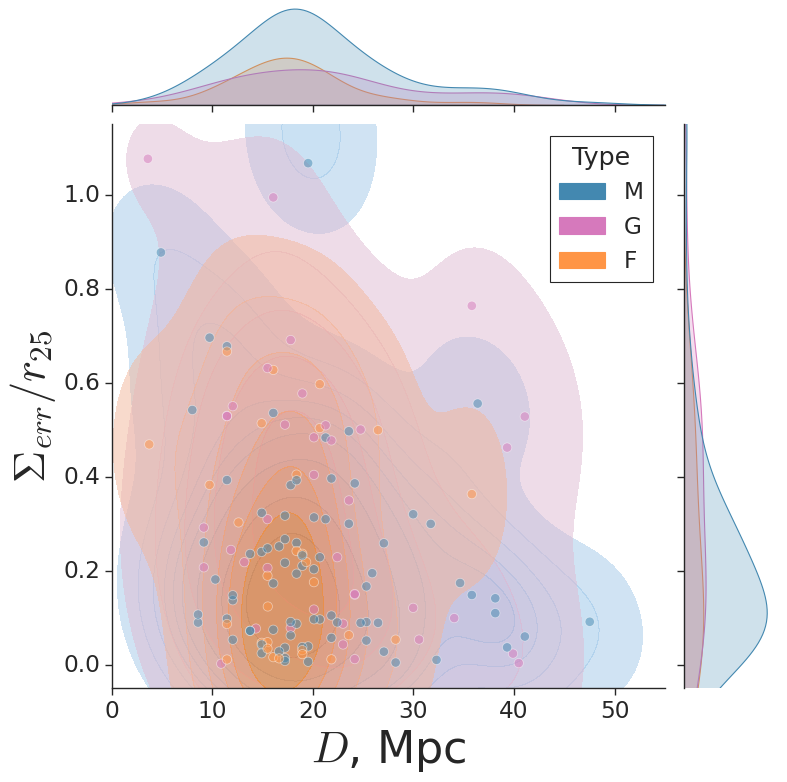

In [149]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_type, x='dist_Mpc', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=5,hue='Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint
ax.set_xlabel(r'$D$, Mpc',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)

ax.set_xlim(0,55)
ax.set_ylim(-0.05,1.15)

(-0.05, 1.1)

<Figure size 680x800 with 0 Axes>

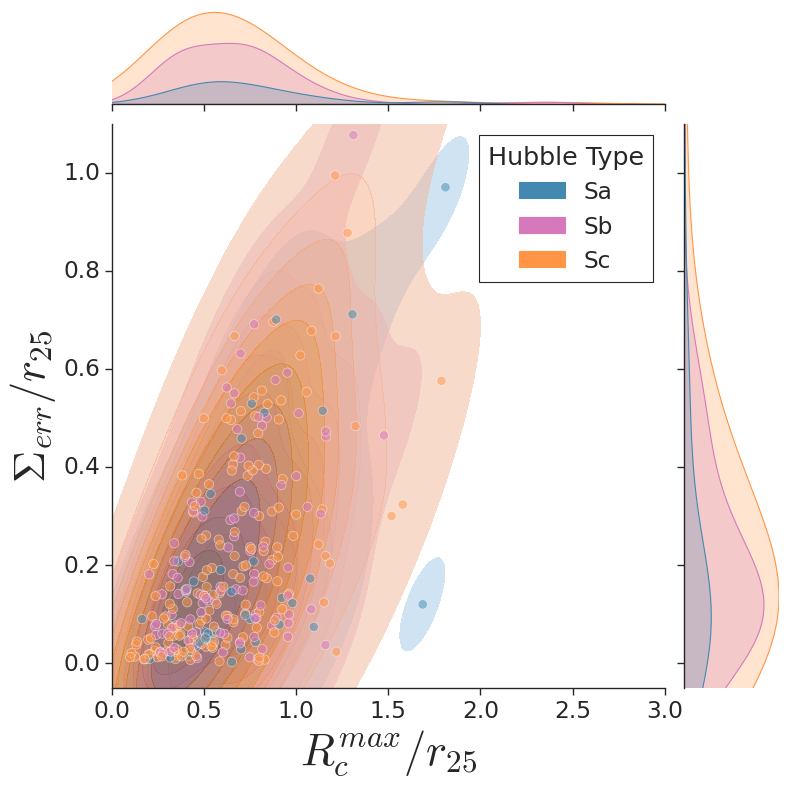

In [150]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_hubble, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, height=10, marginal_ticks=False, dropna=False, ratio=5,hue='Hubble Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint

ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)

ax.set_xlim(0,3.)
ax.set_ylim(-0.05,1.1)

#### Exclude T-W

In [90]:
df_TW = df.loc[df.method != 'T-W']

In [91]:
gf = df_TW.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)

In [92]:
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]

In [93]:
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)

In [94]:
colors=['#4388b0','#d679bc','#ff9545']

In [95]:
altnames = []
for val in gf['altname']:
    altnames.append(val[0])

In [96]:
md=pd.read_table('Morf_type.tsv',sep=',')
dist_Mpc=[]
type_=[]
hubble_type=[]
dustpedia=[]
bar=[]
for i,val in enumerate(altnames):
    
    modz = hyp[hyp['name']==val].modz.to_numpy()
    Mpc = zToMpc(modz)
    if Mpc > 0.:
            dist_Mpc.append(Mpc[0])
    else:
            modz = hyp[hyp['name']==val].mod0.to_numpy()
            Mpc = zToMpc(modz) 
            if Mpc > 0.:
                dist_Mpc.append(Mpc[0])
            else:
                dist_Mpc.append(0.0)
                                
    t='nan'            
    for k, row in md[md['Altname']==val].iterrows():
        t=row['Type']
            
    type_.append(t)    
    h_type = hyp[hyp['name']==val].type.to_numpy()
            
    if (h_type == 'SBa') or (h_type == 'Sa') or (h_type == 'SABa'):
        hubble_type.append('Sa')
    elif (h_type == 'SBb') or (h_type == 'Sb') or (h_type == 'SABb') or (h_type == 'SABab') or (h_type == 'SBab') or (h_type == 'Sab'):
        hubble_type.append('Sb')
    elif (h_type == 'SBc') or (h_type == 'Sc') or (h_type == 'SABc') or (h_type == 'SABbc') or (h_type == 'SBbc') or (h_type == 'Sbc') or (h_type == 'Scd') or (h_type == 'SBcd') or (h_type == 'SBd') or (h_type == 'Sd') or (h_type == 'SABd'):
        hubble_type.append('Sc') 
    elif len(h_type)==0:
        hubble_type.append('nan')
    elif (h_type == 'SBm') or (h_type == 'Sm') or (h_type == 'SABm'):
        hubble_type.append('Sm')  
    else:    
        hubble_type.append(str(h_type[0]))
    
    try:      
        if (str(h_type[0][1])=='B') or (str(h_type[0][1])=='A'):
            bar.append('True')
            
        else:
            bar.append('False')
    except:
        
        bar.append('Nan')

In [97]:
gf['Type'] = type_
gf['Hubble Type'] = hubble_type
gf['Bar'] = bar
gf['dist_Mpc'] = dist_Mpc

In [98]:
gf__ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]
gf_ = gf__[gf__['dist_Mpc']>0]
gf_type = gf_[gf_['Type'].isin(['G','F','M'])]

In [99]:
gf_hubble =  gf_[gf_['Hubble Type'].isin(['Sa','Sb','Sc'])]
gf_hubble = gf_hubble.drop('CGCG 008-010',axis = 0)
gf_hubble = gf_hubble.drop('CGCG 106-036',axis = 0)

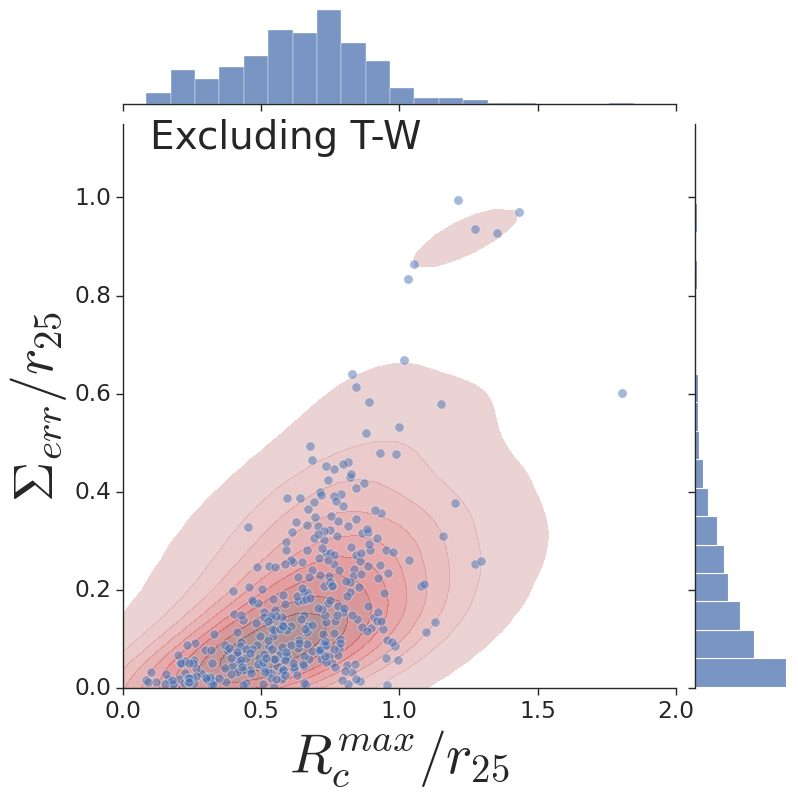

In [100]:

g1=sns.jointplot(data=gf__, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=5)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
ax = g1.ax_joint
ax.set_xlim(0,2.)
ax.set_ylim(0,1.15)
ax.text(0.1, 1.1,r'Excluding T-W', fontsize=35)
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=50)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=50)
plt.savefig('./images_RAA/cover_cr_TW.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

(-0.05, 1.15)

<Figure size 680x800 with 0 Axes>

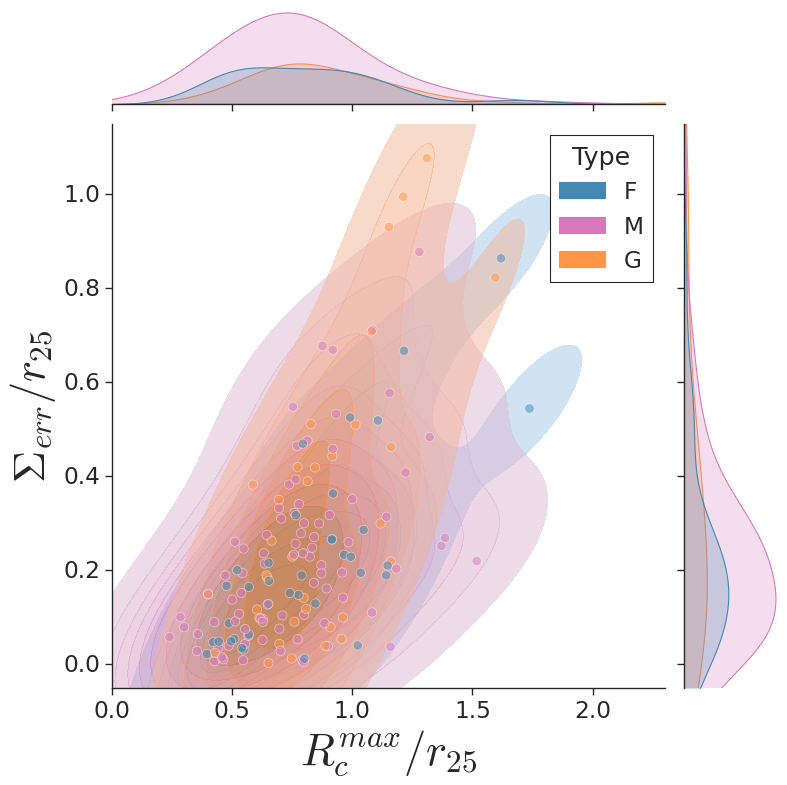

In [162]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')
fig = plt.figure(figsize=[8.5,10])

sns.set(font_scale=1.9)
sns.set_style("ticks")

g1=sns.jointplot(data=gf_type, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=5, hue='Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)

ax.set_xlim(0,2.3)
ax.set_ylim(-0.05,1.15)

(-0.05, 1.15)

<Figure size 680x800 with 0 Axes>

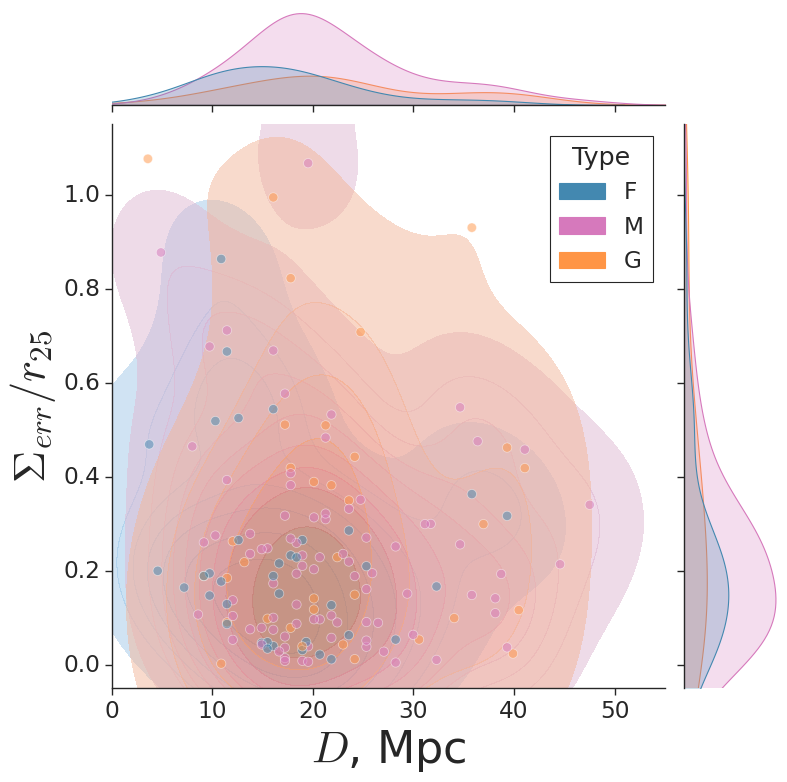

In [163]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_type, x='dist_Mpc', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=5,hue='Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint
ax.set_xlabel(r'$D$, Mpc',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)

ax.set_xlim(0,55)
ax.set_ylim(-0.05,1.15)

(-0.05, 1.1)

<Figure size 680x800 with 0 Axes>

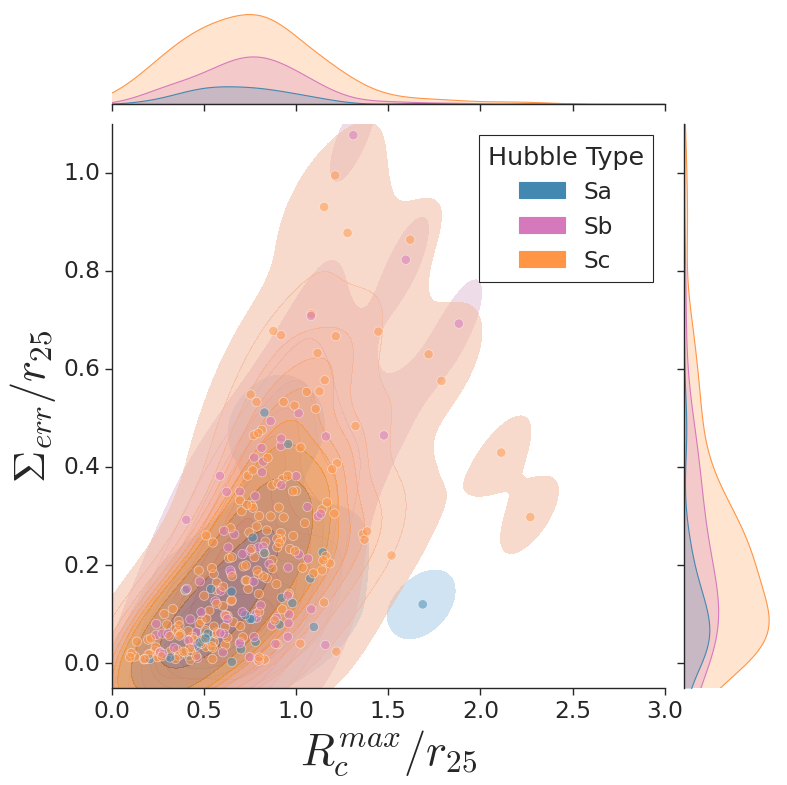

In [164]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_hubble, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, height=10, marginal_ticks=False, dropna=False, ratio=5,hue='Hubble Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint

ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)

ax.set_xlim(0,3.)
ax.set_ylim(-0.05,1.1)

### Methods versus spiral structure type

In [45]:
gf = pd.read_csv('./../data/crs/total_crs.csv',index_col=0)
altnames = []
for val in gf['altname']:
    altnames.append(val)

In [48]:
md=pd.read_table('./../data/info_about_galaxies/spiral_type.tsv',sep=',')
dist_Mpc=[]
type_=[]
bar=[]
for i,val in enumerate(altnames):
    
    modz = hyp[hyp['name']==val].modz.to_numpy()
    Mpc = zToMpc(modz)
    if Mpc > 0.:
            dist_Mpc.append(Mpc[0])
    else:
            modz = hyp[hyp['name']==val].mod0.to_numpy()
            Mpc = zToMpc(modz) 
            if Mpc > 0.:
                dist_Mpc.append(Mpc[0])
            else:
                dist_Mpc.append(0.0)
                                
    t='nan'            
    for k, row in md[md['Altname']==val].iterrows():
        t=row['Type']
            
    type_.append(t)    
    h_type = hyp[hyp['name']==val].type.to_numpy()
    
    try:
        
        if 'B' in h_type[0]:
            bar.append('True')
            
        else:
            bar.append('False')
        
    except:
        
        bar.append('Nan')

In [49]:
gf['Type'] = type_
gf['Bar'] = bar
gf['dist_Mpc'] = dist_Mpc

In [50]:
gf__ = gf[gf['err_range']>0]
gf_ = gf__[gf__['method'].isin(['F-B','P-D','potential-density','T-W','bar-torque','gaps','metallicity','model','morph','offset','rings'])]

In [51]:
gf_types = gf_[gf_['Type'].isin(['G','M','F'])]
galnames = []
for val in gf_types['altname']:
    galnames.append(val)
    
galnames = list(set(galnames))

for name in galnames:
    
    methods = []
    index = []
    for ind,row in gf_types[gf_types['altname']==name].iterrows():
        methods.append(row['method'])
        index.append(ind)   
    
    if 'F-B' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='F-B') & (count==0):
                count+=1
            elif (m=='F-B') & (count>=1):
                count+=1
                gf_types.drop(index[i],inplace=True)
                    
    if 'P-D' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='P-D') & (count==0):
                count+=1
            elif (m=='P-D') & (count>=1):
                count+=1
                gf_types.drop(index[i],inplace=True) 
                
    if 'potential-density' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='potential-density') & (count==0):
                count+=1
            elif (m=='potential-density') & (count>=1):
                count+=1
                gf_types.drop(index[i],inplace=True)             
                    
    if 'T-W' in methods or 'T-W ' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='T-W' or m=='T-W ')  & count==0:
                count+=1
            elif (m=='T-W' or m=='T-W ') & count>=1:
                count+=1
                gf_types.drop(index[i],inplace=True)
                    
    if 'bar-torque' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='bar-torque') & (count==0):
                count+=1
            elif (m=='bar-torque') & (count>=1):
                count+=1
                gf_types.drop(index[i],inplace=True) 
                    
    if 'gaps' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='gaps') & (count==0):
                count+=1
            elif (m=='gaps') & (count>=1):
                count+=1
                gf_types.drop(index[i],inplace=True) 
                    
    if 'rings' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='rings') & count==0:
                count+=1
            if (m=='rings') & count>=1:
                count+=1
                gf_types.drop(index[i],inplace=True) 
    
    if 'metallicity' in methods or 'metallicity ' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='metallicity' or m=='metallicity ')  & count==0:
                count+=1
            elif (m=='metallicity' or m=='metallicity ') & count>=1:
                count+=1
                gf_types.drop(index[i],inplace=True)
                    
                    
    if 'model' in methods or 'model ' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='model' or m=='model ')  & count==0:
                count+=1
            elif (m=='model' or m=='model ') & count>=1:
                count+=1
                gf_types.drop(index[i],inplace=True) 
                    
    if 'morph' in methods or 'morph ' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='morph' or m=='morph ')  & count==0:
                count+=1
            elif (m=='morph' or m=='morph ') & count>=1:
                 gf_types.drop(index[i],inplace=True) 
                    
    if 'offset' in methods or 'offset ' in methods:
        count = 0
        for i,m in enumerate(methods):
            if (m=='offset' or m=='offset ') & count==0:
                count+=1
            elif (m=='offset' or m=='offset ') & count>=1:
                 gf_types.drop(index[i],inplace=True)                

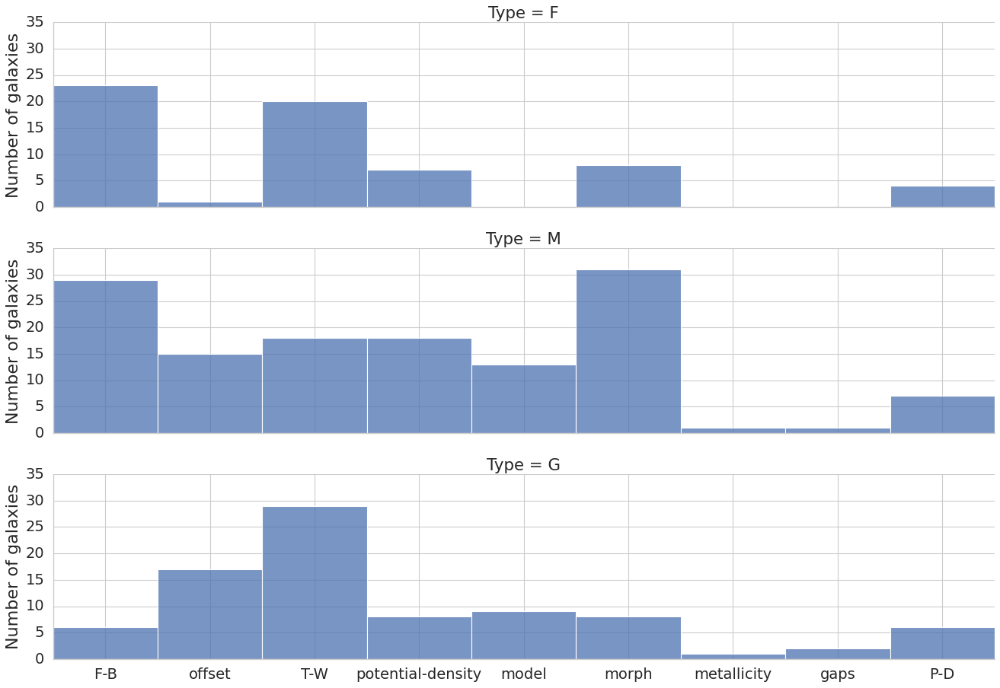

In [52]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')

sns.set_theme(style="whitegrid")
sns.color_palette("muted")
sns.set_context("notebook", font_scale=1.6, rc={"lines.linewidth": 6.5})

g = sns.displot(gf_types, x="method", height=4, aspect=4.2,row='Type')
#g.despine(left=True)
g.set_axis_labels("", r'Number of galaxies', fontsize=20)

plt.savefig('./../images/images_RAA/method_type_hist.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

### What contribution does each of the methods make to the overall error?

In [61]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 


In [62]:
gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)

In [63]:
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]

In [64]:
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)

In [65]:
altnames = []
for val in gf['altname']:
    altnames.append(val[0])

In [66]:
FB_err = []
offset_err = []
TW_err = []
model_err = []
metal_err = []
morph_err = []
PD_err = []
widths_err = []

for name in altnames:
    
    FB = []
    offset = []
    TW = []
    model = []
    metal = []
    morph = []
    PD = []
    widths = []
    for ind,row in df[df['altname']==name].iterrows():
        
        if (row['method']=='F-B'):
            FB.append(list((row['cr_l'], row['cr_r'])))
                      
        if (row['method']=='offset'):
            offset.append(list((row['cr_l'], row['cr_r'])))
                      
        if (row['method']=='T-W'):
            TW.append(list((row['cr_l'], row['cr_r'])))
                      
        if (row['method']=='model'):
            model.append(list((row['cr_l'], row['cr_r']))) 
        
        if (row['method']=='morph'):
            morph.append(list((row['cr_l'], row['cr_r']))) 
                         
        if (row['method']=='metallicity'):
            metal.append(list((row['cr_l'], row['cr_r'])))
                         
        if (row['method']=='P-D'):
            PD.append(list((row['cr_l'], row['cr_r'])))
            
        if (row['method']=='widths'):
            widths.append(list((row['cr_l'], row['cr_r'])))    
                      
        r25 = row['r25_NED']              
    
    if len(FB)!=0 :
        err = err_serf(FB)/r25
        if err>0:
            FB_err.append(err)
    if len(offset)!=0:
        err = err_serf(offset)/r25
        if (err>0) & (err<3):
            offset_err.append(err)
    if len(TW)!=0:
        err = err_serf(TW)/r25
        if (err>0) & (err<1.5):
            TW_err.append(err)
    if len(model)!=0:
        err = err_serf(model)/r25
        if err>0:
            model_err.append(err)
    if len(PD)!=0:
        err = err_serf(PD)/r25
        if err>0:
            PD_err.append(err)
    if len(morph)!=0:
        err = err_serf(morph)/r25
        if err>0:
            morph_err.append(err)
    if len(metal)!=0:
        err = err_serf(metal)/r25
        if err>0:
            metal_err.append(err) 
    if len(widths)!=0:
        err = err_serf(widths)/r25
        if err>0:
            widths_err.append(err)         
                      

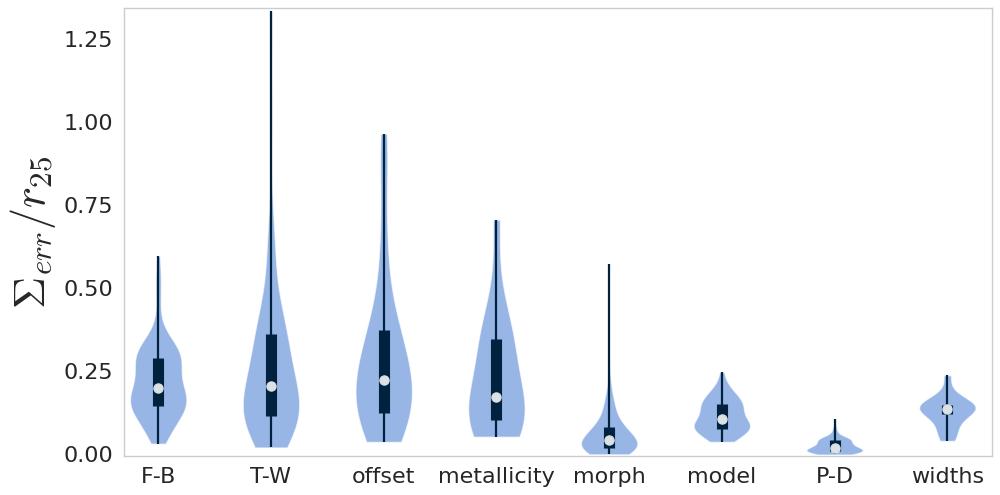

In [67]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14, 7), sharey=True)

data = np.array([FB_err,TW_err,offset_err, metal_err,morph_err,model_err,PD_err,widths_err])

violin = ax.violinplot(data, showextrema=False)
for pc in violin['bodies']:
    pc.set_facecolor('#5386d5')
    pc.set_alpha(0.6)


for i in range(len(data)):
    quartile1, medians, quartile3 = np.percentile(data[i], [25, 50, 75])
    ax.scatter(i+1, medians, marker='o', color='#dce1e6', s=70, zorder=15)
    ax.vlines(i+1, min(data[i]), max(data[i]), color='#01223f', linestyle='-', lw=2)
    ax.vlines(i+1, quartile1, quartile3, color='#01223f',linestyle='-', lw=10)


ax.grid(False)    
ax.set_xticks([y + 1 for y in range(len(data))],
                  labels=['F-B', 'T-W','offset','metallicity','morph','model','P-D', 'widths']) 
ax.set_yticks([0,0.25,0.5,0.75,1,1.25,1.5,1.75])
ax.set_ylim(0,1.35)
ax.set_xlim(0.7,8.4)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$', fontsize=40)

plt.tick_params(axis='both', which='major', labelsize=20)
plt.savefig('./../images/images_RAA/method_err_violin.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

### How many corotation radii are determined by each method

In [68]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 

In [69]:
df_ = df.loc[df.method != 'gaps']
df__ = df_.loc[df_.method != 'rings'] 
dff_ = df__.loc[df__.method != 'mode'] 
dff = dff_.loc[dff_.method != 'bar-torque']

In [70]:
gf =dff.groupby('method')[['cr','altname']].aggregate(list)

In [71]:
gf

,cr,altname
method,,
F-B,"[5.8, 17.6, 59.5, 115.6, 144.7, 58.7, 74.4, 10...","[NGC 0428, NGC 0428, NGC 0428, NGC 0428, NGC 0..."
P-D,"[42.0, 65.0, 30.0, 56.0, 48.0, 21.0, 65.0, 47....","[NGC 1073, NGC 1530, NGC 2273, NGC 3359, NGC 3..."
T-W,"[34.3, 55.1, 163.0, 117.0, 45.3, 344.0, 390.0,...","[MESSIER 077, MESSIER 077, MESSIER 066, MESSIE..."
metallicity,"[4323.084295315855, 1392.2874421679005, 147.77...","[MESSIER 031, MESSIER 033, MESSIER 074, NGC 12..."
model,"[61.0, 78.9, 126.2, 48.7, 74.1, 41.5, 50.4, 54...","[NGC 0289, NGC 0578, NGC 0613, NGC 1073, NGC 1..."
morph,"[77.34930234266113, 4185.083025303405, 813.600...","[NGC 0157, MESSIER 031, MESSIER 033, NGC 0925,..."
offset,"[218.4, 154.56, 500.94, 126.96, 118.68, 132.0,...","[NGC 2403, NGC 2841, MESSIER 081, NGC 3184, ME..."
potential-density,"[38.0, 72.2, 6.4, 40.0, 72.9, 36.7, 80.8, 25.3...","[NGC 0150, NGC 0150, NGC 0157, NGC 0157, NGC 0..."
widths,"[60.4, 63.6, 67.2, 45.2, 49.2, 56.0, 50.0, 181...","[NGC 0266, NGC 0266, NGC 0488, NGC 0488, NGC 0..."


In [72]:
def analysis(your_list, your_dict):
    for i in your_list:
        if i in your_dict:
            your_dict[i] += 1
        else:
            your_dict[i] = 1

In [73]:
methods = list(gf.index[0:])
cr_nums = []

In [74]:
for val in methods:
    name = list(gf[gf.index==val]['altname'].values)[0]
    d = dict.fromkeys(set(name),0)
    analysis(name,d)
    cr_nums.append(list(d.values()))

In [75]:
methods

['F-B',
 'P-D',
 'T-W',
 'metallicity',
 'model',
 'morph',
 'offset',
 'potential-density',
 'widths']

In [76]:
my_hists = []
my_hists_dens = []
for i in range(9):
    my_hists.append(np.histogram(cr_nums[i], bins=14, range=[1,10]))
    my_hists_dens.append(np.histogram(cr_nums[i], bins=14, range=[1,10], density=True))

In [77]:
data_num = np.zeros((9,10))
data_col = np.zeros((9,10))
for i in range(9):
    data_num[i,:], my_range = np.histogram(cr_nums[i], bins=10, range=[1,11])
    data_col[i,:], my_range = np.histogram(cr_nums[i], bins=10, range=[1,11], density=True)

In [78]:
xtick = []
for i in range(1,11):
    xtick.append(str(int(i)))

In [79]:
data_num

array([[  2.,   8.,  23.,  24.,  28.,  10.,   4.,   1.,   3.,   3.],
       [ 51.,   4.,  15.,   1.,   0.,   0.,   0.,   0.,   0.,   0.],
       [137.,  17.,  15.,   2.,   1.,   3.,   0.,   1.,   0.,   1.],
       [ 12.,   7.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
       [ 44.,   2.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
       [ 93.,  16.,   4.,   3.,   0.,   0.,   0.,   0.,   0.,   0.],
       [ 19.,  19.,   9.,   6.,   3.,   1.,   1.,   0.,   0.,   1.],
       [ 28.,  57.,  52.,  16.,   0.,   0.,   0.,   0.,   0.,   0.],
       [  6.,   7.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.]])

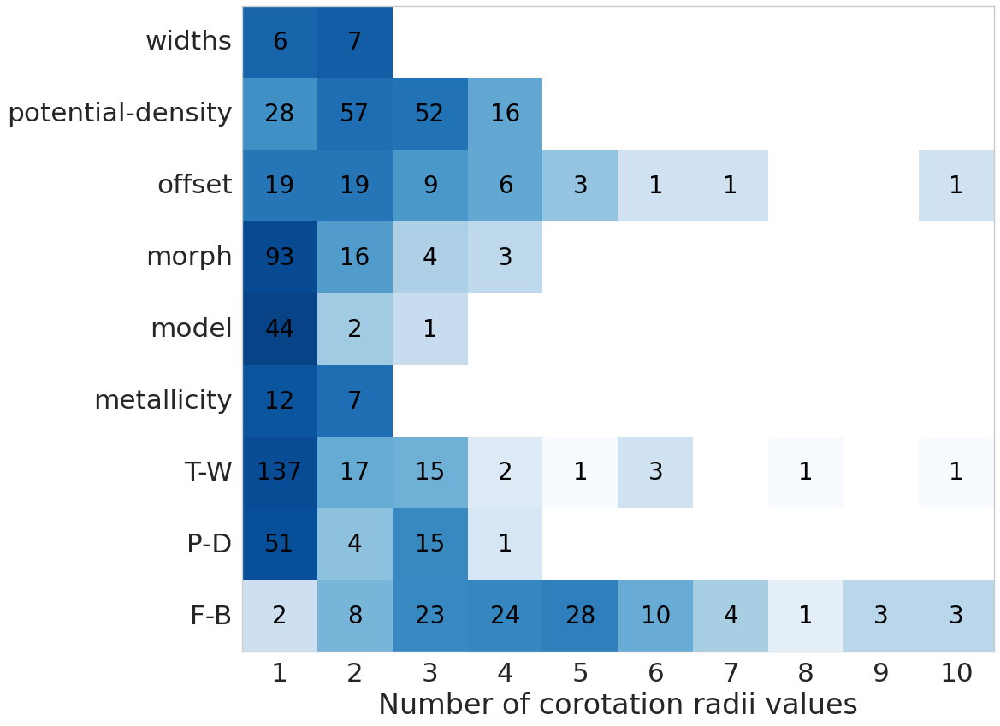

In [80]:
import matplotlib.colors as colors

fig, ax = plt.subplots(figsize=(15,11))
im = ax.pcolormesh(data_col,cmap="Blues",norm=colors.LogNorm(vmax=1.4))#,vmin=0.0001, vmax=1)
im.cmap.set_under('white')
ax.set_yticks(np.arange(len(methods))+0.5, labels=methods, fontsize=28)
ax.set_xticks(np.arange(len(xtick))+0.5, labels=xtick, fontsize=28)

for i in range(9):
    for j in range(10):
        if data_num[i, j] != 0:
            text = ax.text(j+0.5, i+0.5, int(data_num[i, j]),
                           ha="center", va="center", color="black",fontsize=25)
ax.set_xlabel('Number of corotation radii values', fontsize=30)
fig.tight_layout()
plt.savefig('./../images/images_RAA/method&cr_num.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

### Measure of consistency
        

In [81]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 

df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr'] = df['cr']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']

# df = df.loc[df.method != 'gaps']
# df = df.loc[df.method != 'ring']
df = df.loc[df.method != 'spirals']

gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))

gf['far_cr'] = gf['cr_r'].apply(max)
gf['cr_number'] = [len(row) for row in gf['cr'].values]
gf['methods_list'] = [list(set(row)) for row in gf['method'].values]
gf['method_number'] = [len(row) for row in gf['methods_list'].values]
gf_ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]
gff = gf_[gf_['cr_number']>1]

gff['max_min'] = [np.max(row)-np.min(row) for row in gff['cr'].values]
gff['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gff['cr_l'].values, gff['cr_r'].values,gff['cr'].values,gff['cr_number'].values))]

Text(50.33333333333333, 0.5, 'consistency')

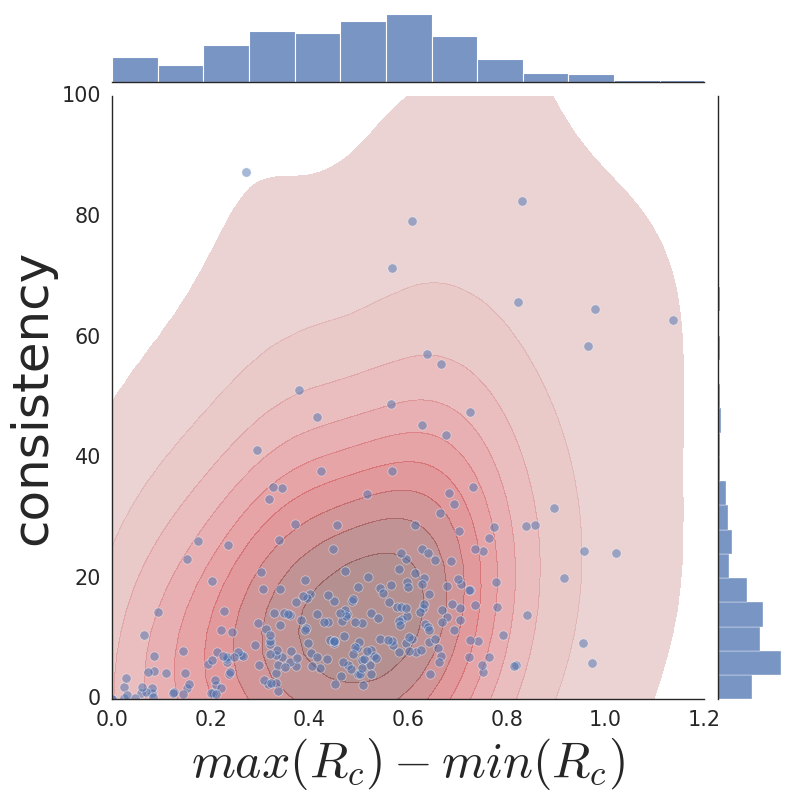

In [82]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')

sns.set_theme(style="white")
sns.color_palette("muted")
sns.set_context("notebook", font_scale=1.7, rc={"lines.linewidth": 6.5})

g1=sns.jointplot(data=gff, x='max_min', y='consistence', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)

ax = g1.ax_joint

#ax.plot([0,1],[0,2],color='k', lw=1)
ax.set_ylim(0,100)
ax.set_xlim(0,1.2)

# ax.scatter(x_ax[0],y_ax[0],marker='s',color='k',s=100)
# ax.scatter(x_ax[1],y_ax[1],marker='s',color='k',s=100)
# ax.text(0.1, 1.1,r'$R_{c}^{err}/r_{25} \leq 0.25$', fontsize=30)
ax.set_xlabel(r'$max(R_c) - min(R_c)$',fontsize=45)
ax.set_ylabel(r'consistency',fontsize=45)

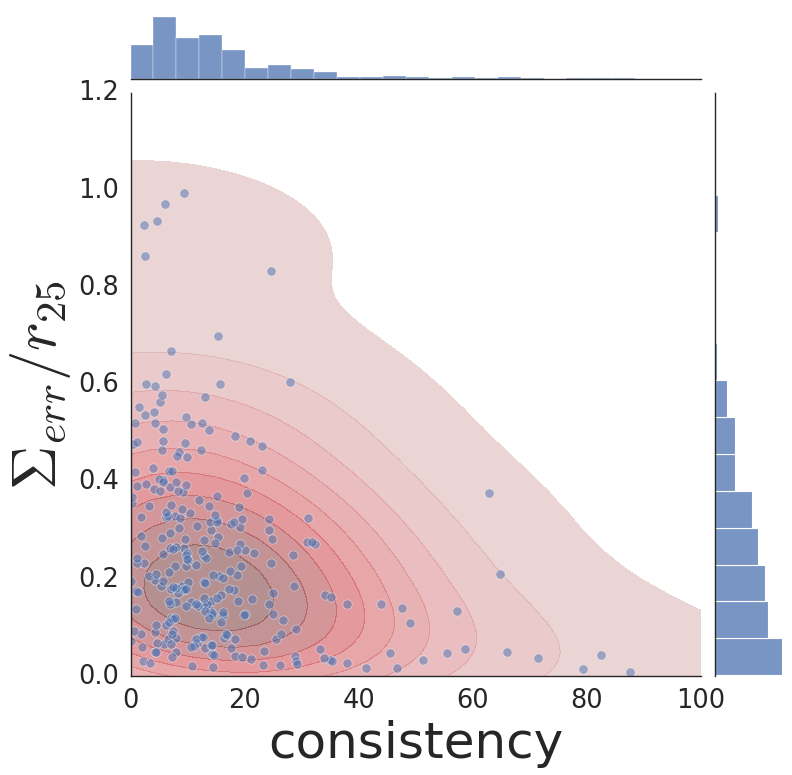

In [83]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')

sns.set_theme(style="white")
sns.color_palette("muted")
sns.set_context("notebook", font_scale=2.1, rc={"lines.linewidth": 6.5})

g1=sns.jointplot(data=gff, x='consistence', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)

ax = g1.ax_joint

#ax.plot([0,1],[0,2],color='k', lw=1)
ax.set_ylim(0,1.2)
ax.set_xlim(0,100)

# ax.scatter(x_ax[0],y_ax[0],marker='s',color='k',s=100)
# ax.scatter(x_ax[1],y_ax[1],marker='s',color='k',s=100)
# ax.text(0.1, 1.1,r'$R_{c}^{err}/r_{25} \leq 0.25$', fontsize=30)
ax.set_xlabel(r'consistency',fontsize=45)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=55)
plt.savefig('./../images/images_RAA/consistency.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

In [84]:
gff[(gff['cover_CR']<0.8) & (gff['cover_CR']>0.6) & (gff['consistence']>2)]

,cr,cr_r,cr_l,altname,method,crs,cover_CR,far_cr,cr_number,methods_list,method_number,max_min,consistence
altname,,,,,,,,,,,,,
MESSIER 063,"[0.03335980937251787, 0.07625099285146943, 0.1...","[0.03600741329097167, 0.07889859676992322, 0.1...","[0.03071220545406407, 0.07360338893301563, 0.1...","[MESSIER 063, MESSIER 063, MESSIER 063, MESSIE...","[F-B, F-B, F-B, F-B, F-B, F-B, F-B, offset, mo...","[(0.03071220545406407, 0.03600741329097167), (...",0.668785,1.018745,11,"[F-B, morph, offset, metallicity]",4,0.666878,7.129707
MESSIER 100,"[0.14298561151079137, 0.14883093525179855, 0.3...","[0.15827338129496404, 0.19649280575539568, 0.3...","[0.1276978417266187, 0.10116906474820143, 0.31...","[MESSIER 100, MESSIER 100, MESSIER 100, MESSIE...","[F-B, F-B, F-B, F-B, F-B, F-B, F-B, F-B, F-B, ...","[(0.06506294964028778, 0.06506294964028778), (...",0.699191,0.888939,27,"[F-B, model, T-W, offset, morph]",5,0.781160,15.267975
NGC 1559,"[0.17884615384615385, 0.017529304064897153, 0....","[0.17884615384615385, 0.035058608129794305, 0....","[0.17884615384615385, 0.0, 0.06510884366961801...","[NGC 1559, NGC 1559, NGC 1559, NGC 1559, NGC 1...","[potential-density, T-W, T-W, T-W, T-W]","[(0.0, 0.035058608129794305), (0.0651088436696...",0.621038,0.846415,5,"[potential-density, T-W]",2,0.663609,6.152100
NGC 1566,"[0.3955119214586255, 0.1882690461516744, 0.177...","[0.4159487076738128, 0.30536320900210595, 0.28...","[0.37507513524343816, 0.07117488330124279, 0.0...","[NGC 1566, NGC 1566, NGC 1566, NGC 1566, NGC 1...","[morph, T-W, T-W, T-W, offset, offset, P-D]","[(0.07117488330124272, 0.284699533204971), (0....",0.600508,0.671683,7,"[P-D, offset, morph, T-W]",4,0.332524,2.770450
NGC 3726,"[0.1362162162162162, 0.34054054054054056, 0.54...","[0.15135135135135136, 0.35621621621621624, 0.5...","[0.12108108108108108, 0.3248648648648649, 0.52...","[NGC 3726, NGC 3726, NGC 3726, NGC 3726, NGC 3...","[F-B, F-B, F-B, F-B, F-B, F-B, F-B, F-B, F-B, ...","[(0.07005405405405406, 0.07859459459459459), (...",0.605558,0.842056,18,"[F-B, potential-density, P-D, model, offset, m...",6,0.702432,27.921867
UGC 03273,"[0.1264957264957265, 0.5452991452991452, 1.263...","[0.1811965811965812, 0.6085470085470086, 1.338...","[0.0717948717948718, 0.48205128205128206, 1.18...","[UGC 03273, UGC 03273, UGC 03273, UGC 03273]","[F-B, F-B, F-B, F-B]","[(0.0717948717948718, 0.1811965811965812), (0....",0.601709,1.806838,4,[F-B],1,1.572650,15.701251


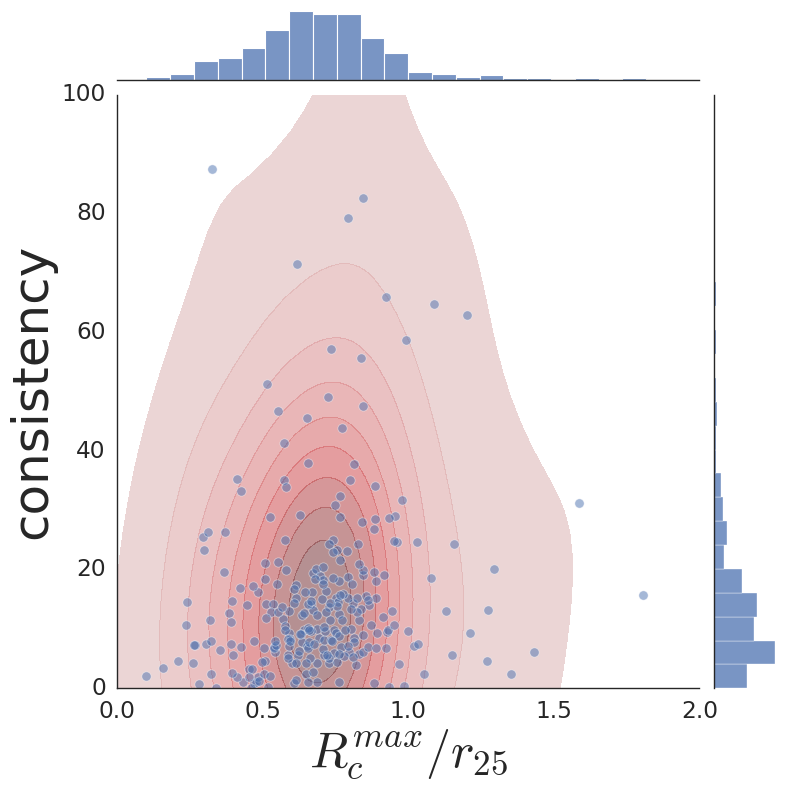

In [85]:
sns.set_theme(style="white")
sns.color_palette("muted")
sns.set_context("notebook", font_scale=1.9, rc={"lines.linewidth": 6.5})

g1=sns.jointplot(data=gff, x='far_cr', y='consistence', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)

ax = g1.ax_joint

#ax.plot([0,1],[0,2],color='k', lw=1)
ax.set_ylim(0,100)
ax.set_xlim(0,2)

# ax.scatter(x_ax[0],y_ax[0],marker='s',color='k',s=100)
# ax.scatter(x_ax[1],y_ax[1],marker='s',color='k',s=100)
# ax.text(0.1, 1.1,r'$R_{c}^{err}/r_{25} \leq 0.25$', fontsize=30)
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
ax.set_ylabel(r'consistency',fontsize=45)
plt.savefig('./../images/images_RAA/consistency_farcr.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

#### exclude objects with large magnitude of consistency

In [86]:
g = gff[(gff['consistence']>7.5) & (gff['cover_CR']<0.128) & (gff['method_number']>1)]
g


,cr,cr_r,cr_l,altname,method,crs,cover_CR,far_cr,cr_number,methods_list,method_number,max_min,consistence
altname,,,,,,,,,,,,,
CGCG 013-075,"[0.4818355640535373, 0.8106474787786333]","[0.5047801147227533, 0.8106474787786333]","[0.45889101338432126, 0.8106474787786333]","[CGCG 013-075, CGCG 013-075]","[gaps, rings]","[(0.45889101338432126, 0.5047801147227533), (0...",0.045889,0.810647,2,"[gaps, rings]",2,0.328812,14.330719
MESSIER 094,"[0.13458110516934044, 0.7311348781937017]","[0.13458110516934044, 0.7566844919786095]","[0.13458110516934044, 0.7055852644087938]","[MESSIER 094, MESSIER 094]","[T-W, gaps]","[(0.13458110516934044, 0.13458110516934044), (...",0.051099,0.756684,2,"[gaps, T-W]",2,0.596554,23.348837
MESSIER 109,"[0.20324558060132844, 0.5049439683586026]","[0.2169356974293972, 0.5088991430454844]","[0.18955546377325969, 0.5009887936717204]","[MESSIER 109, MESSIER 109]","[T-W, morph]","[(0.18955546377325969, 0.2169356974293972), (0...",0.035291,0.508899,2,"[morph, T-W]",2,0.301698,21.171806
NGC 0157,"[0.6185469999413126, 0.44579963959734237, 0.05...","[0.6185469999413126, 0.44579963959734237, 0.05...","[0.6185469999413126, 0.44579963959734237, 0.05...","[NGC 0157, NGC 0157, NGC 0157, NGC 0157, NGC 0...","[morph, offset, potential-density, potential-d...","[(0.05117952818872452, 0.05117952818872452), (...",0.038385,0.618547,8,"[potential-density, offset, morph]",3,0.567367,71.440583
NGC 1073,"[0.2585913576046274, 0.6076896903708745, 0.331...","[0.2585913576046274, 0.6076896903708745, 0.361...","[0.2585913576046274, 0.6076896903708745, 0.301...","[NGC 1073, NGC 1073, NGC 1073, NGC 1073, NGC 1...","[potential-density, potential-density, model, ...","[(0.2585913576046274, 0.2585913576046274), (0....",0.125213,0.607690,5,"[model, potential-density, morph, P-D]",4,0.349098,14.322054
NGC 1084,"[0.5753180744104561, 0.23069001029866118, 0.46...","[0.5753180744104561, 0.23069001029866118, 0.47...","[0.5753180744104561, 0.23069001029866118, 0.44...","[NGC 1084, NGC 1084, NGC 1084, NGC 1084]","[morph, potential-density, potential-density, ...","[(0.23069001029866118, 0.23069001029866118), (...",0.032956,0.575318,4,"[potential-density, morph]",2,0.344628,35.025511
NGC 1302,"[0.2656383890317052, 0.4712939160239931, 0.716...","[0.2656383890317052, 0.4712939160239931, 0.716...","[0.2656383890317052, 0.4712939160239931, 0.716...","[NGC 1302, NGC 1302, NGC 1302, NGC 1302]","[potential-density, potential-density, potenti...","[(0.2656383890317052, 0.2656383890317052), (0....",0.078835,0.716367,4,"[model, potential-density]",2,0.450728,16.355687
NGC 1637,"[0.02678945165341147, 0.19506069485140226, 0.4...","[0.02678945165341147, 0.20510673922143155, 0.4...","[0.02678945165341147, 0.18501465048137297, 0.4...","[NGC 1637, NGC 1637, NGC 1637, NGC 1637]","[potential-density, potential-density, potenti...","[(0.02678945165341147, 0.02678945165341147), (...",0.085391,0.422771,4,"[morph, potential-density]",2,0.395982,16.821890
NGC 1832,"[0.6344559642180106, 0.2931258106355383, 0.500...","[0.6344559642180106, 0.2931258106355383, 0.500...","[0.6344559642180106, 0.2931258106355383, 0.500...","[NGC 1832, NGC 1832, NGC 1832, NGC 1832]","[morph, potential-density, potential-density, ...","[(0.2931258106355383, 0.2931258106355383), (0....",0.080415,0.634456,4,"[model, potential-density, morph]",3,0.341330,12.293733


In [87]:
indexdrop = gff[(gff['consistence']>7.5) & (gff['cover_CR']<0.128)].index
gff.drop(indexdrop , inplace=True)


Text(46.33333333333333, 0.5, 'consistency')

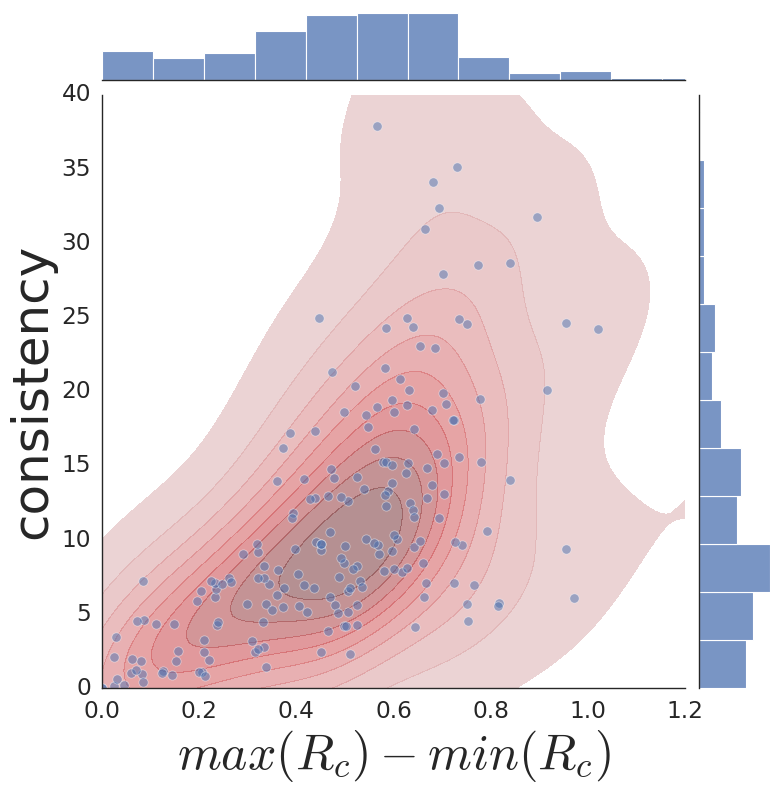

In [88]:
g1=sns.jointplot(data=gff, x='max_min', y='consistence', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)

ax = g1.ax_joint

#ax.plot([0,1],[0,2],color='k', lw=1)
ax.set_ylim(0,40)
ax.set_xlim(0,1.2)

# ax.scatter(x_ax[0],y_ax[0],marker='s',color='k',s=100)
# ax.scatter(x_ax[1],y_ax[1],marker='s',color='k',s=100)
# ax.text(0.1, 1.1,r'$R_{c}^{err}/r_{25} \leq 0.25$', fontsize=30)
ax.set_xlabel(r'$max(R_c) - min(R_c)$',fontsize=45)
ax.set_ylabel('consistency',fontsize=45)

In [89]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 

df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr'] = df['cr']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']

# df = df.loc[df.method != 'gaps']
# df = df.loc[df.method != 'ring']
# df = df.loc[df.method != 'spirals']

gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method',]].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))

gf['far_cr'] = gf['cr_r'].apply(max)
gf['cr_number'] = [len(row) for row in gf['cr'].values]
gf['methods_list'] = [list(set(row)) for row in gf['method'].values]
gf['method_number'] = [len(row) for row in gf['methods_list'].values]
gf_ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]
# gff = gf_[gf_['method_number']>1]

# gff['max_min'] = [np.max(row)-np.min(row) for row in gff['cr'].values]
# gff['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gff['cr_l'].values, gff['cr_r'].values,gff['cr'].values,gff['cr_number'].values))]
gf_.drop(indexdrop , inplace=True)

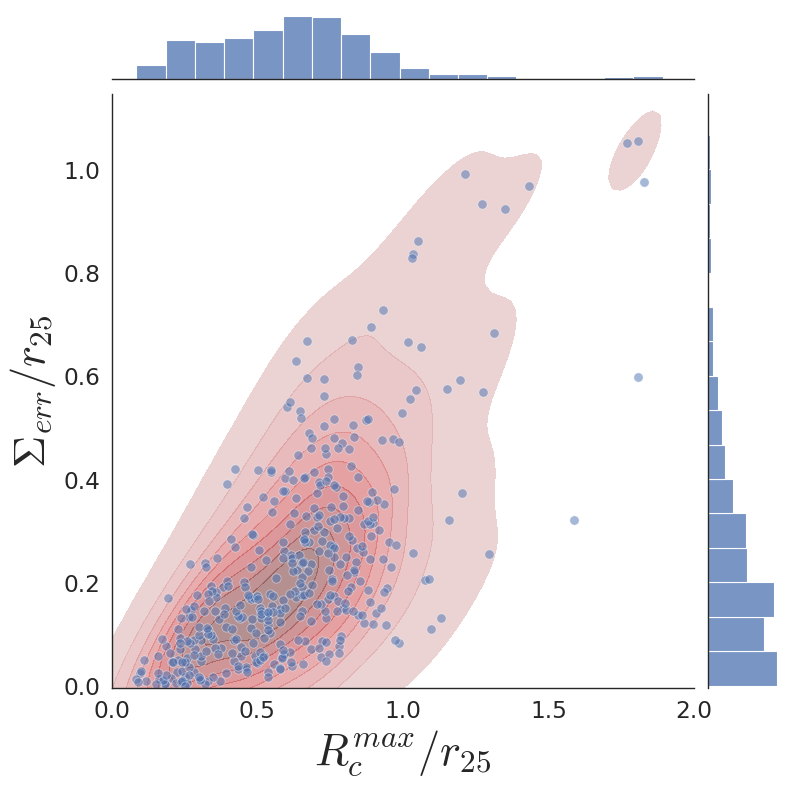

In [91]:
g1=sns.jointplot(data=gf_, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=10, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)

ax = g1.ax_joint

#ax.plot([0,1],[0,2],color='k', lw=1)
ax.set_xlim(0,2.)
ax.set_ylim(0,1.15)

ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=40)
plt.savefig('./../images/images_RAA/cover_cr_drop.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

#### exclude measurenets with large fraction of error bar

In [92]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 
df['cr'] = df['cr']/df['r25_NED']
df['err_range'] = df['err_range']/df['r25_NED']
dff = df[(df['err_range']>0) & (df['err_range']<1.2)]
# df.drop(indexdrop , inplace=True) 

Text(26.33333333333333, 0.5, '$R_{c}^{err}/r_{25}$')

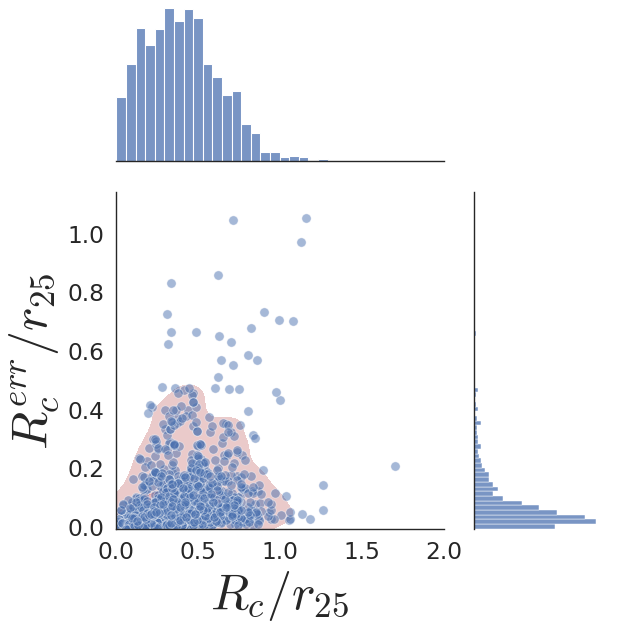

In [93]:
g1=sns.jointplot(data=dff, x='cr', y='err_range', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=True,  height=8, ratio=2)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=4,fill=True, alpha=0.6)
#g1.plot_marginal_ticks(fontsize=30)
ax = g1.ax_joint
ax.set_xlim(0,2.)
ax.set_ylim(0,1.15)

ax.set_xlabel(r'$R_{c}/r_{25}$',fontsize=45)
ax.set_ylabel(r'$R_{c}^{err}/r_{25}$',fontsize=45)

# plt.savefig('./images_RAA/cr_errors.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

In [94]:
df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']
df = df.loc[df.method != 'potential-density']
df = df.loc[df.method != 'bar-torque']
df = df.loc[df.method != 'gaps']
df = df.loc[df.method != 'ring']
dff = df[df['err_range']<0.25]

gf = dff.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)
gf_ = gf[gf['cover_CR']>0]
# gf_.drop(indexdrop , inplace=True, errors='ignore') 

Text(26.33333333333333, 0.5, '$\\Sigma_{err}/r_{25}$')

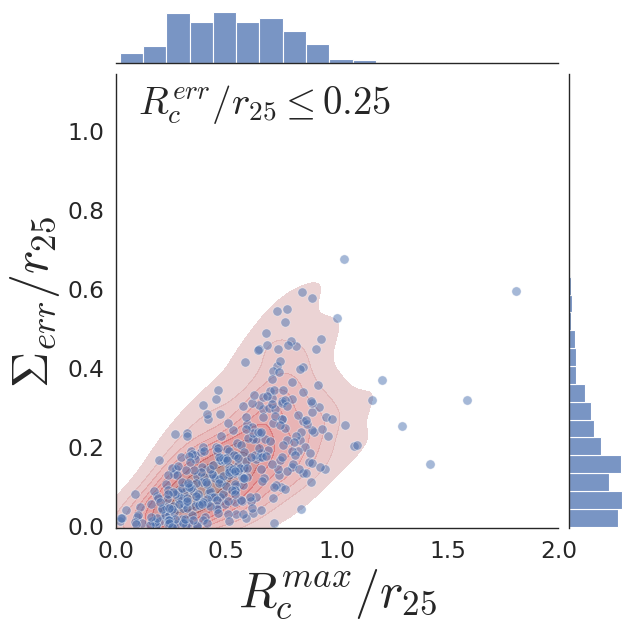

In [95]:
g1=sns.jointplot(data=gf_, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=8, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)

ax = g1.ax_joint

#ax.plot([0,1],[0,2],color='k', lw=1)
ax.set_xlim(0,2.)
ax.set_ylim(0,1.15)

# ax.scatter(x_ax[0],y_ax[0],marker='s',color='k',s=100)
# ax.scatter(x_ax[1],y_ax[1],marker='s',color='k',s=100)
ax.text(0.1, 1.05,r'$R_{c}^{err}/r_{25} \leq 0.25$', fontsize=35)
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)
# plt.savefig('./images_RAA/cover_cr_cut.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

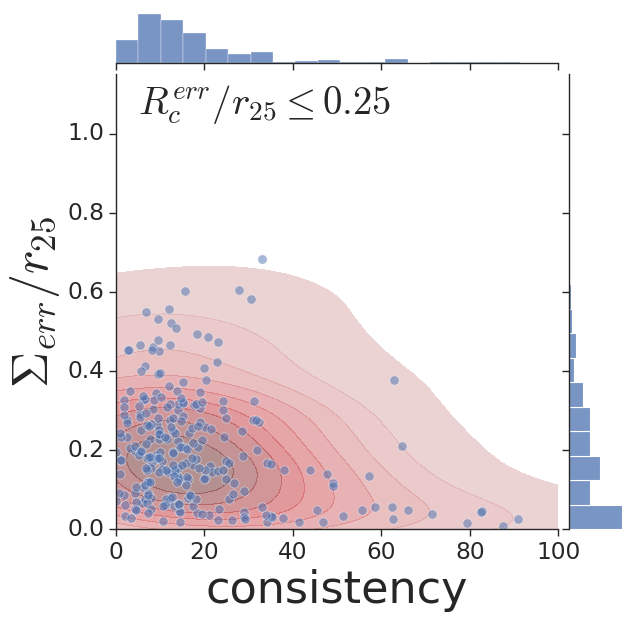

In [97]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 
df['cr'] = df['cr']/df['r25_NED']
df['err_range'] = df['err_range']/df['r25_NED']
df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']

dff = df[df['err_range']<0.25]
gf = dff.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)
gf['cr_number'] = [len(row) for row in gf['cr'].values]
gff = gf[gf['cr_number']>1]
gff['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gff['cr_l'].values, gff['cr_r'].values,gff['cr'].values,gff['cr_number'].values))]


sns.set(font_scale=1.9)
sns.set_style("ticks")
g1=sns.jointplot(data=gff, x='consistence', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=8, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
ax = g1.ax_joint
ax.set_xlim(0,100)
ax.set_ylim(0,1.15)
ax.text(5, 1.05,r'$R_{c}^{err}/r_{25} \leq 0.25$', fontsize=35)
ax.set_xlabel(r'consistency',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)
plt.savefig('./../images/images_RAA/consistency_cut.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

#### Number of measurement dependence

In [98]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 
df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr'] = df['cr']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']
gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['cr_number'] = [len(row) for row in gf['cr'].values]
# gf.drop(indexdrop , inplace=True, errors='ignore') 
gf['methods_list'] = [list(set(row)) for row in gf['method'].values]
gf['method_number'] = [len(row) for row in gf['methods_list'].values]
gff = gf[(gf['cr_number']>1) & (gf['cover_CR']>0)]
gff['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gff['cr_l'].values, gff['cr_r'].values,gff['cr'].values,gff['cr_number'].values))]

In [ ]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')
sns.set(font_scale=1.9)
sns.set_style("ticks")
 
g1=sns.jointplot(data=gff, x='cr_number', y='cover_CR', s=150, color='b', alpha=0.6, marginal_ticks=False, dropna=True,  height=8, ratio=10)

#g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
ax = g1.ax_joint
ax.set_xlim(1.5,12.5)
ax.set_ylim(0,1.15)
ax.set_xlabel(r'Number of corotation radii',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=50)
plt.savefig('./../images/images_RAA/cover_cr_num.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

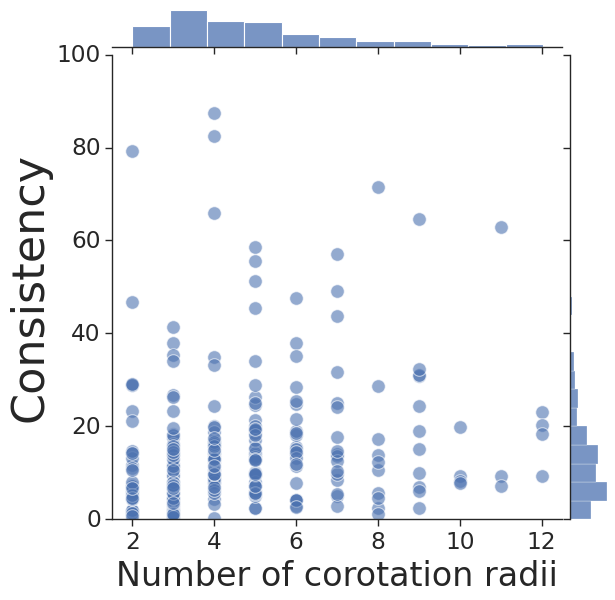

In [100]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')
sns.set(font_scale=1.9)
sns.set_style("ticks")
 
g1=sns.jointplot(data=gff, x='cr_number', y='consistence', s=150, color='b', alpha=0.6, marginal_ticks=False, dropna=True,  height=8, ratio=10)

#g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
ax = g1.ax_joint
ax.set_xlim(1.5,12.5)
ax.set_ylim(0,100)
ax.set_xlabel(r'Number of corotation radii',fontsize=30)
ax.set_ylabel(r'Consistency',fontsize=40)
plt.savefig('./../images/images_RAA/consistency_cr_num.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

#### Meathods exclusion

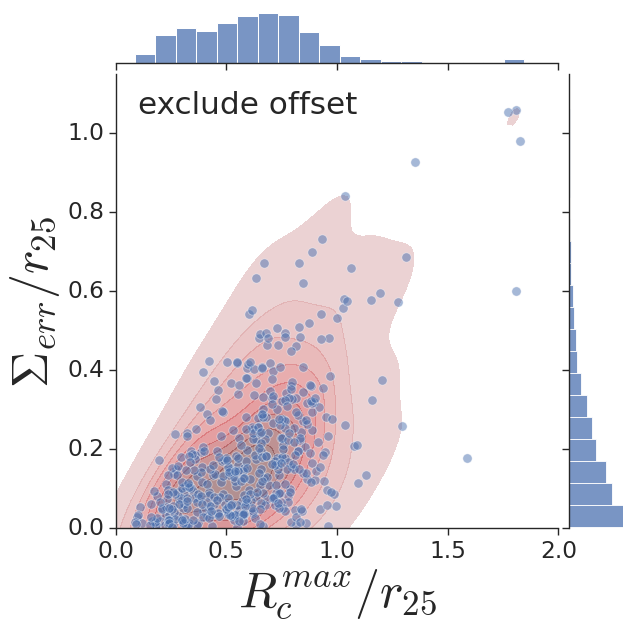

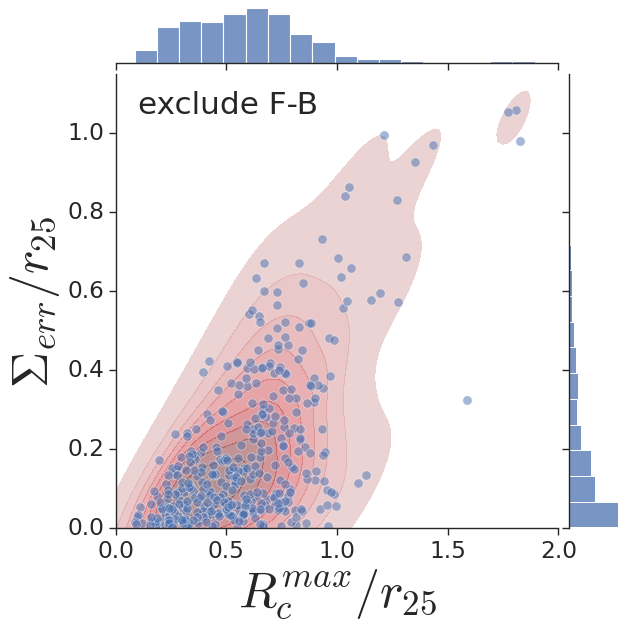

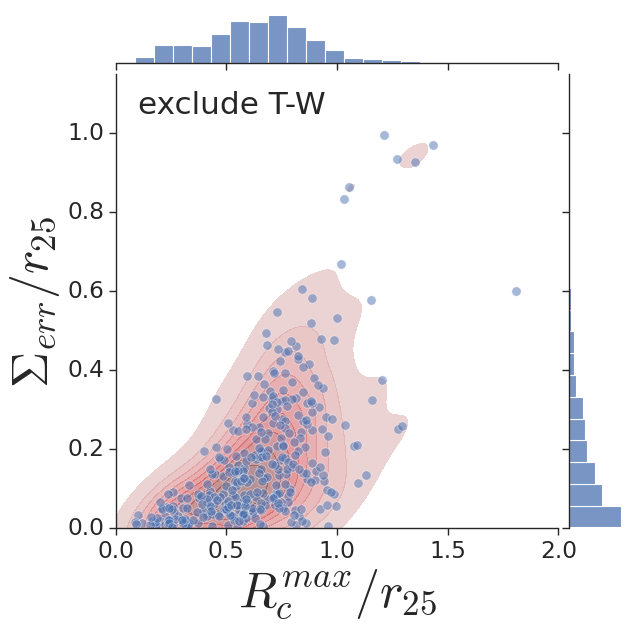

In [101]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 
methods = ['offset', 'F-B', 'T-W']

df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']

for ind,name in enumerate(methods):
    
    dff = df.loc[df.method != name]
    gf = dff.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
    gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
    gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
    gf['far_cr'] = gf['cr_r'].apply(max)
    gf_ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]
    # gf_.drop(indexdrop , inplace=True, errors='ignore') 
    
    
    sns.set(font_scale=1.9)
    sns.set_style("ticks")
    g1=sns.jointplot(data=gf_, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=8, ratio=7)

    g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
    ax = g1.ax_joint
    ax.set_xlim(0,2.)
    ax.set_ylim(0,1.15)
    ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
    ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)
    ax.text(0.1, 1.05, 'exclude '+name, fontsize=28)
    plt.savefig('./../images/images_RAA/cover_'+name+'_excl.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

Text(0.1, 1.05, 'exclude offset + T-W')

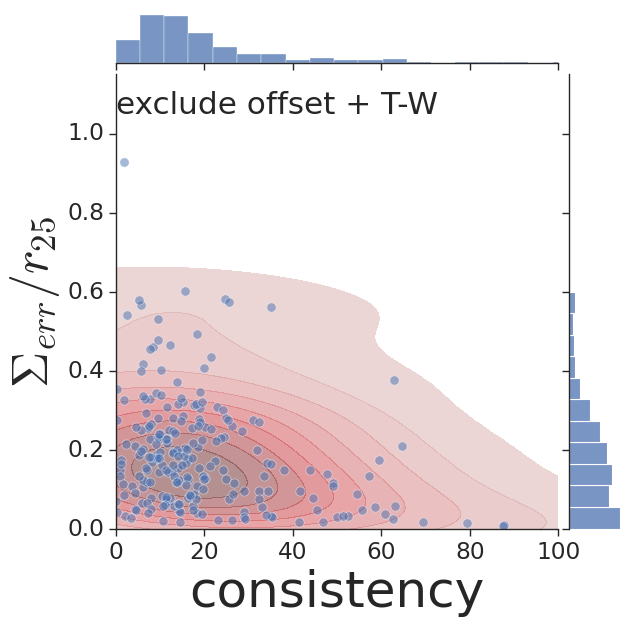

In [41]:
df = pd.read_csv('./../../data/crs/total_crs.csv',index_col=0) 
df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr'] = df['cr']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']


dff = df[(df['method'] != 'offset') & (df['method'] != 'T-W')]
gf = dff.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)
gf['cr_number'] = [len(row) for row in gf['cr'].values]
gff = gf[gf['cr_number']>1]
gff['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gff['cr_l'].values, gff['cr_r'].values,gff['cr'].values,gff['cr_number'].values))]
gf_ = gff[(gff['cover_CR']>0) & (gff['cover_CR']<3)]


sns.set(font_scale=1.9)
sns.set_style("ticks")
g1=sns.jointplot(data=gf_, x='consistence', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=8, ratio=7)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
ax = g1.ax_joint
ax.set_xlim(0,100)
ax.set_ylim(0,1.15)
ax.set_xlabel(r'consistency',fontsize=45)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)
ax.text(0.1, 1.05, 'exclude offset + T-W', fontsize=28)
# plt.savefig('./images_RAA/cover_'+name+'excl.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

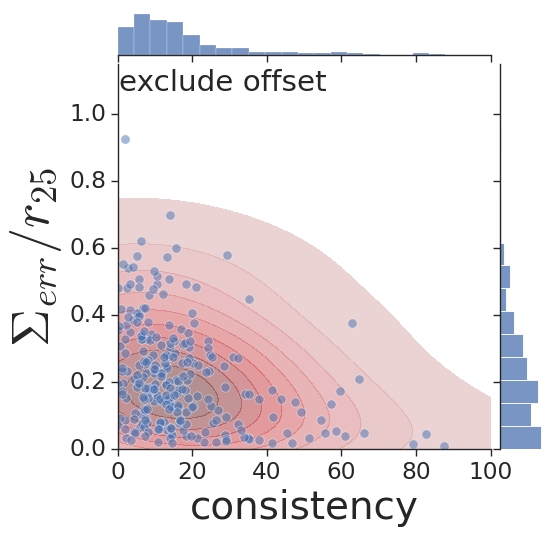

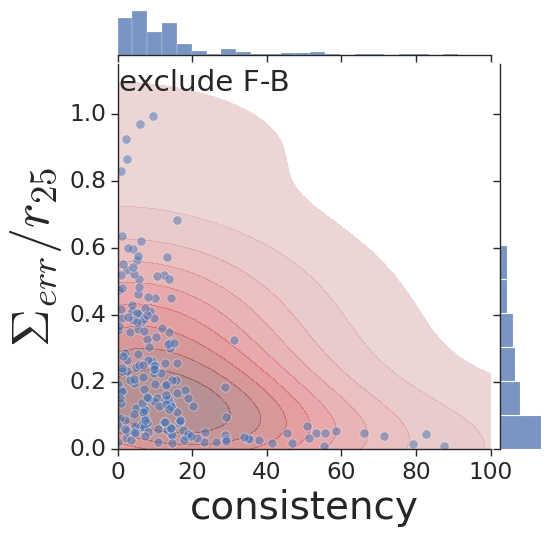

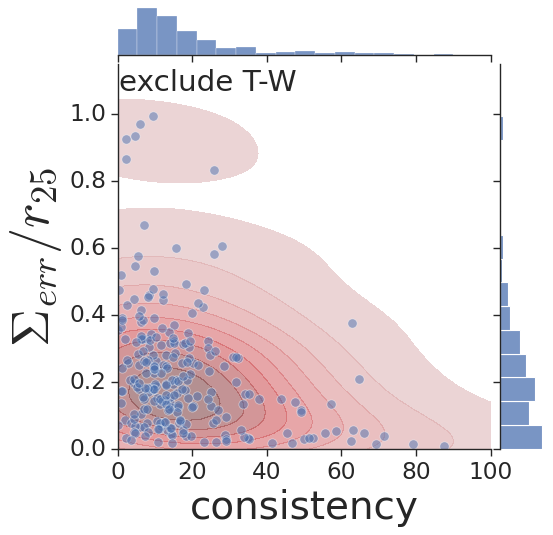

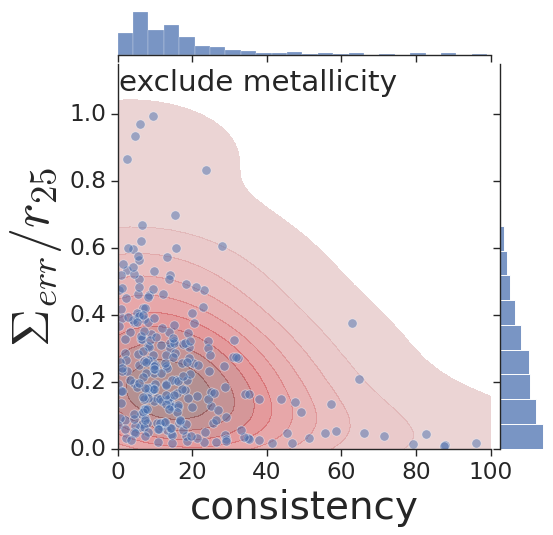

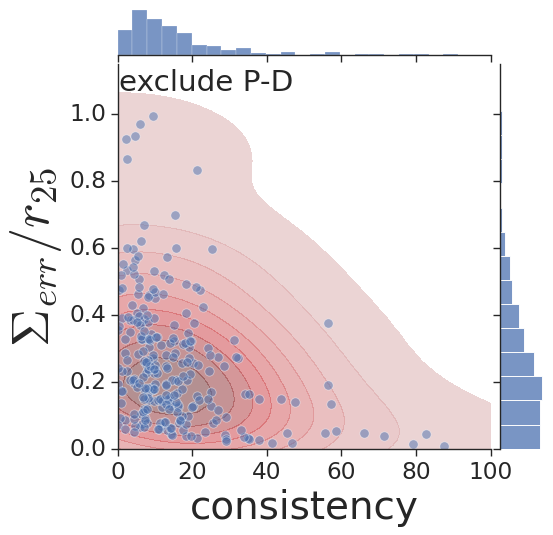

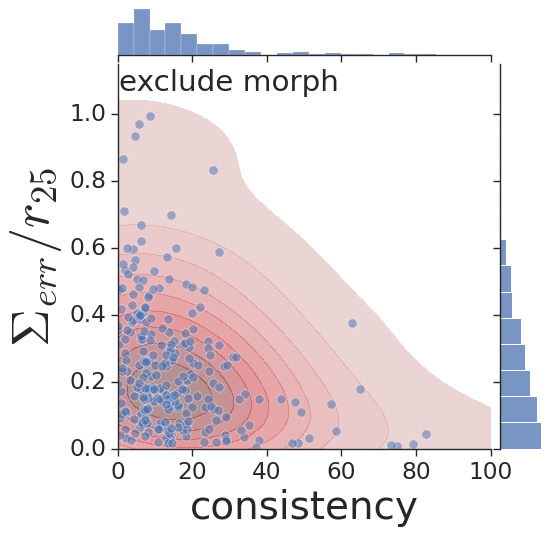

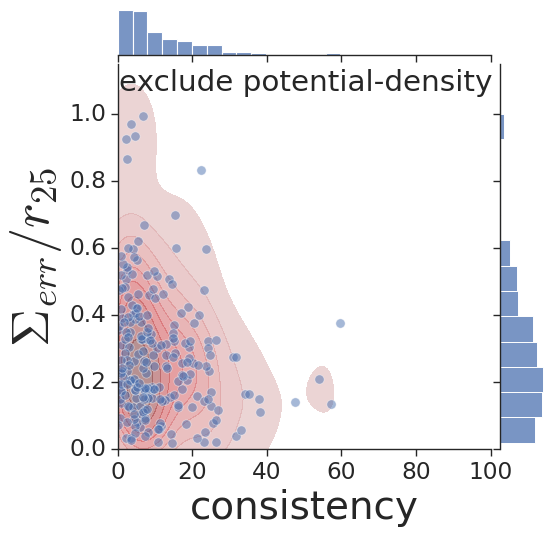

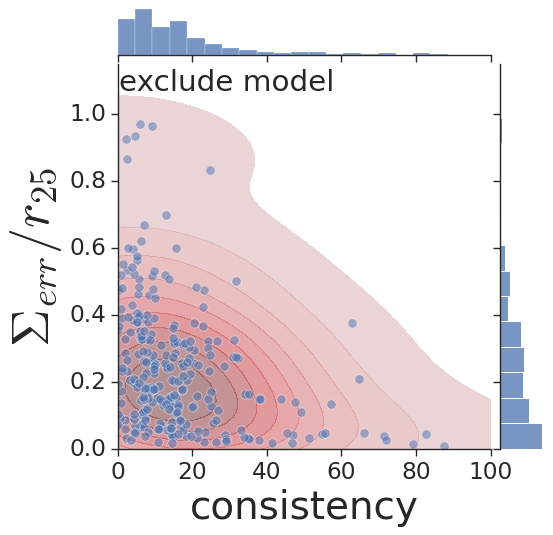

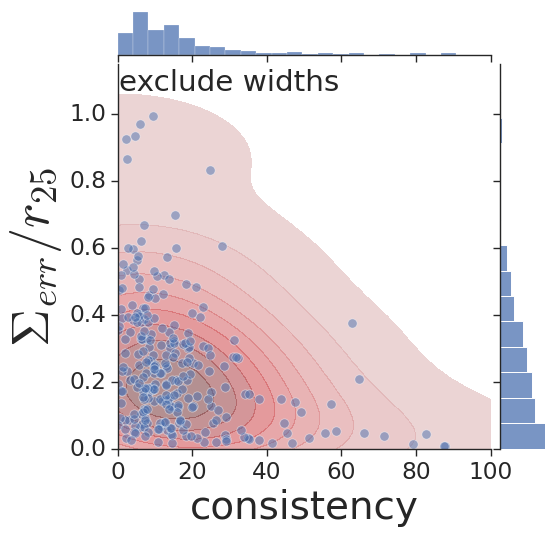

In [15]:
df = pd.read_csv('./../../data/crs/total_crs.csv',index_col=0) 
methods = ['offset', 'F-B', 'T-W', 'metallicity', 'P-D', 'morph', 'potential-density','model', 'widths']

df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr'] = df['cr']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']

for ind,name in enumerate(methods):
    
    dff = df.loc[df.method != name]
    gf = dff.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
    gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
    gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
    gf['far_cr'] = gf['cr_r'].apply(max)
    gf_ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]
    gf['cr_number'] = [len(row) for row in gf['cr'].values]
    gff = gf[gf['cr_number']>1]
    gff['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gff['cr_l'].values, gff['cr_r'].values,gff['cr'].values,gff['cr_number'].values))]
    gf_ = gff[(gff['cover_CR']>0) & (gff['cover_CR']<3)]

    
    sns.set(font_scale=1.9)
    sns.set_style("ticks")
    g1=sns.jointplot(data=gf_, x='consistence', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=7, ratio=7)

    g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
    ax = g1.ax_joint
    ax.set_xlim(0,100)
    ax.set_ylim(0,1.15)
    ax.set_xlabel(r'consistency',fontsize=35)
    ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=47)
    ax.text(0.25, 1.07, 'exclude '+name, fontsize=26.5)
    plt.savefig('./images_RAA/cosistency_'+name+'_excl.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

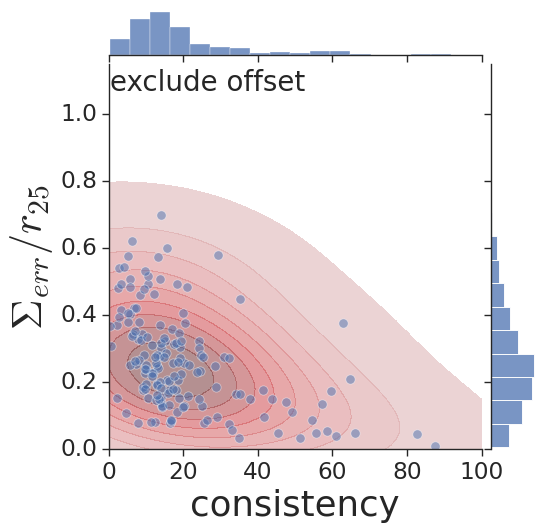

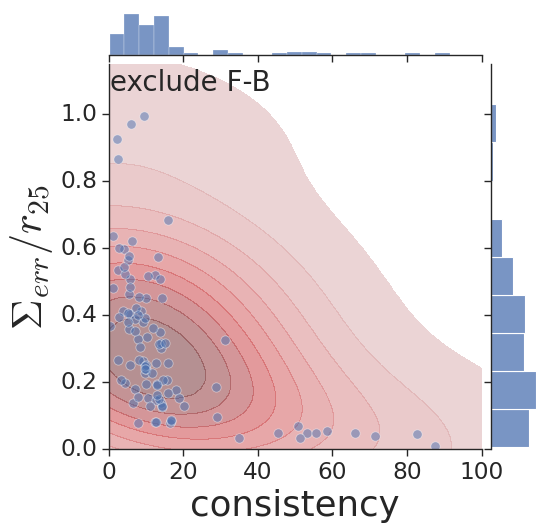

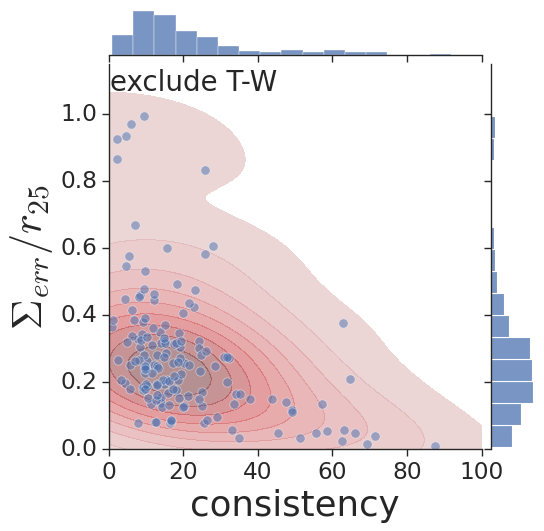

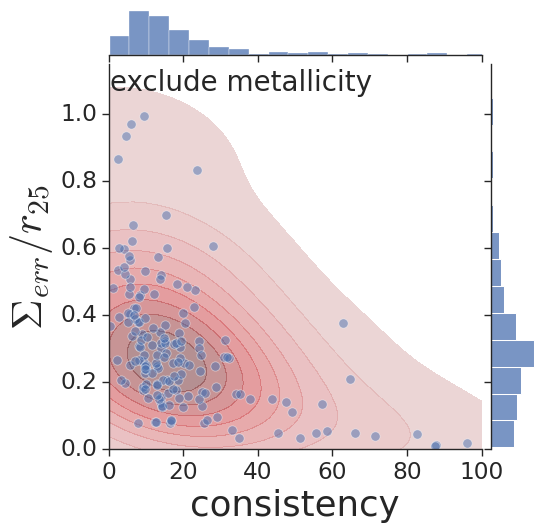

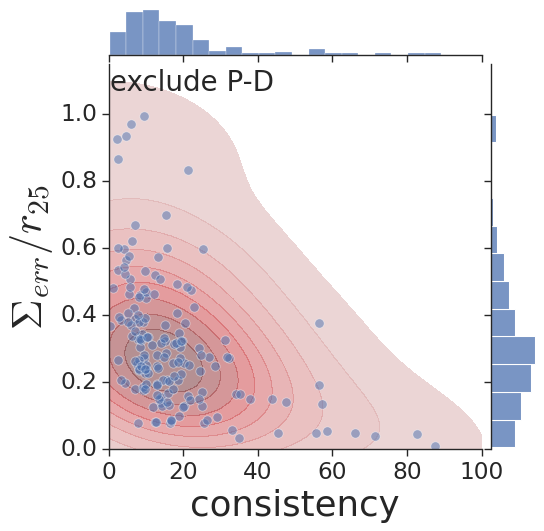

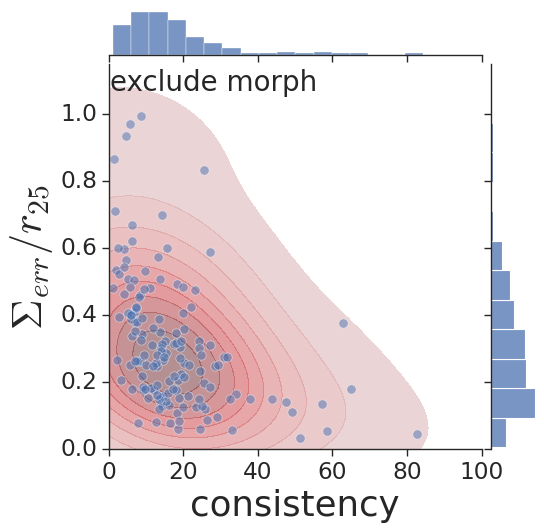

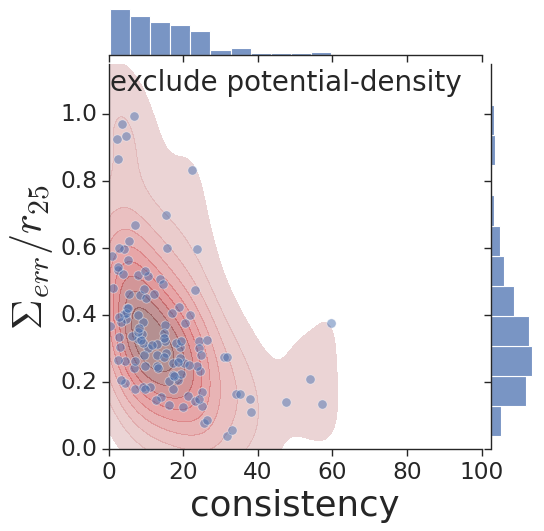

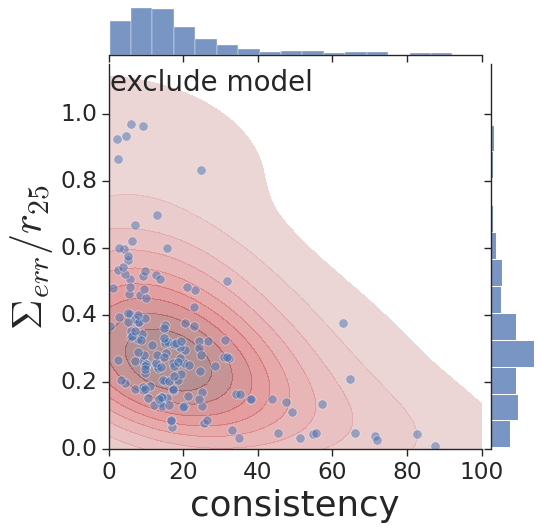

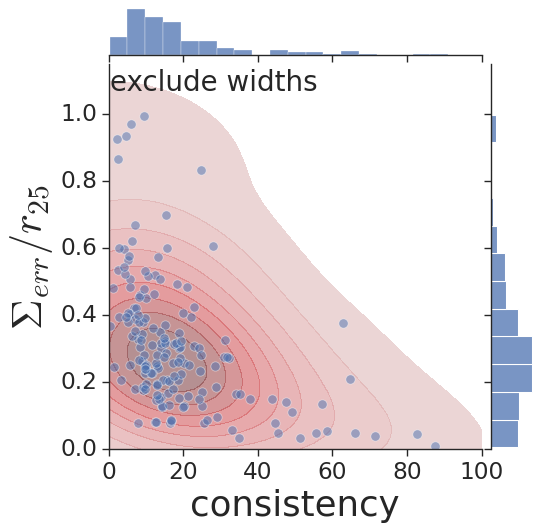

In [102]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 
methods = ['offset', 'F-B', 'T-W', 'metallicity', 'P-D', 'morph', 'potential-density','model', 'widths']

df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr'] = df['cr']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']

for ind,name in enumerate(methods):
    
    dff = df.loc[df.method != name]
    gf = dff.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
    gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
    gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
    gf['far_cr'] = gf['cr_r'].apply(max)
    gf_ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]
    gf['cr_number'] = [len(row) for row in gf['cr'].values]
    gff = gf[gf['cr_number']>3]
    gff['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gff['cr_l'].values, gff['cr_r'].values,gff['cr'].values,gff['cr_number'].values))]
    gf_ = gff[(gff['cover_CR']>0) & (gff['cover_CR']<3)]

    
    sns.set(font_scale=1.9)
    sns.set_style("ticks")
    g1=sns.jointplot(data=gf_, x='consistence', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=7, ratio=7)

    g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.6)
    ax = g1.ax_joint
    ax.set_xlim(0,100)
    ax.set_ylim(0,1.15)
    ax.set_xlabel(r'consistency',fontsize=32)
    ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=38)
    ax.text(0.25, 1.07, 'exclude '+name, fontsize=25)
    plt.savefig('./../images/images_RAA/cosistency_'+name+'_excl_num3.png',transparent = False, dpi=300, bbox_inches='tight', pad_inches=0.05)

#### Distance, morphological and spiral structure types, presence of bar

In [103]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0)
df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr'] = df['cr']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']
gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)
gf['cr_number'] = [len(row) for row in gf['cr'].values]

In [104]:
colors=['#4388b0','#d679bc','#ff9545']

In [105]:
altnames = []
for val in gf['altname']:
    altnames.append(val[0])

In [106]:
md=pd.read_table('./../data/info_about_galaxies/spiral_type.tsv',sep=',')
dist_Mpc=[]
type_=[]
hubble_type=[]
dustpedia=[]
bar=[]
for i,val in enumerate(altnames):
    
    modz = hyp[hyp['name']==val].modz.to_numpy()
    Mpc = zToMpc(modz)
    if Mpc > 0.:
            dist_Mpc.append(Mpc[0])
    else:
            modz = hyp[hyp['name']==val].mod0.to_numpy()
            Mpc = zToMpc(modz) 
            if Mpc > 0.:
                dist_Mpc.append(Mpc[0])
            else:
                dist_Mpc.append(0.0)
                                
    t='nan'            
    for k, row in md[md['Altname']==val].iterrows():
        t=row['Type']
            
    type_.append(t)    
    h_type = hyp[hyp['name']==val].type.to_numpy()
            
    if (h_type == 'SBa') or (h_type == 'Sa') or (h_type == 'SABa'):
        hubble_type.append('Sa')
    elif (h_type == 'SBb') or (h_type == 'Sb') or (h_type == 'SABb') or (h_type == 'SABab') or (h_type == 'SBab') or (h_type == 'Sab'):
        hubble_type.append('Sb')
    elif (h_type == 'SBc') or (h_type == 'Sc') or (h_type == 'SABc') or (h_type == 'SABbc') or (h_type == 'SBbc') or (h_type == 'Sbc') or (h_type == 'Scd') or (h_type == 'SBcd') or (h_type == 'SBd') or (h_type == 'Sd') or (h_type == 'SABd'):
        hubble_type.append('Sc') 
    elif len(h_type)==0:
        hubble_type.append('nan')
    elif (h_type == 'SBm') or (h_type == 'Sm') or (h_type == 'SABm'):
        hubble_type.append('Sm')  
    else:    
        hubble_type.append(str(h_type[0]))
    
    try:      
        bar_ = hyp[hyp['name']==val].bar.to_numpy()
        if bar_=='B':
            bar.append('True')
        else:
            bar.append('False')
    except:
        
        bar.append('Nan')

In [107]:
gf['Type'] = type_
gf['Hubble Type'] = hubble_type
gf['Bar'] = bar
gf['dist_Mpc'] = dist_Mpc

In [108]:
gf_ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3) & (gf['dist_Mpc']>0)]
# gf_.drop(indexdrop , inplace=True, errors='ignore') 
gf_type = gf_[gf_['Type'].isin(['G','F','M'])]
gf_bar  = gf_[gf_['Bar'].isin(['True','False'])]

In [109]:
gf_hubble =  gf_[gf_['Hubble Type'].isin(['Sa','Sb','Sc'])]
gf_hubble = gf_hubble.drop('CGCG 008-010',axis = 0)
gf_hubble = gf_hubble.drop('CGCG 106-036',axis = 0)

<Figure size 680x800 with 0 Axes>

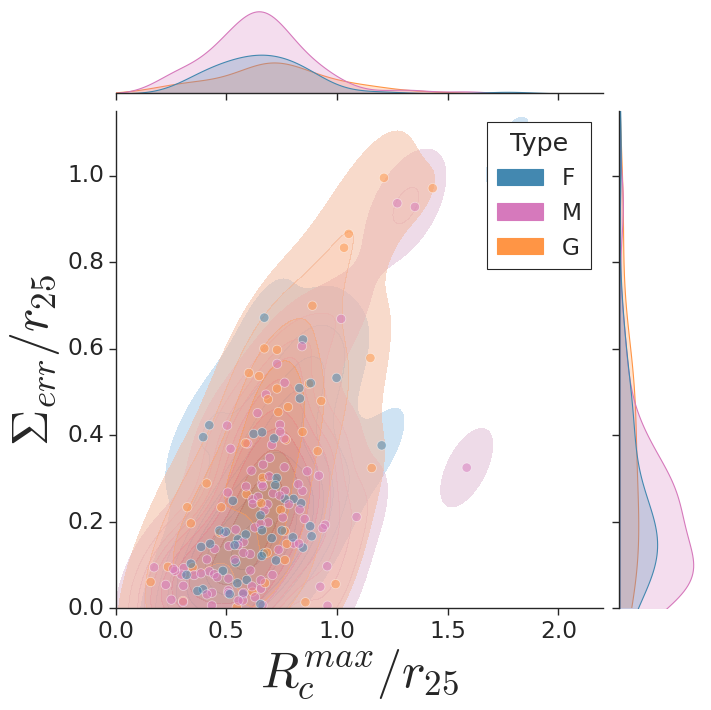

In [110]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')
fig = plt.figure(figsize=[8.5,10])

sns.set(font_scale=1.9)
sns.set_style("ticks")

g1=sns.jointplot(data=gf_type, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=9, ratio=5, hue='Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint
ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)

ax.set_xlim(0,2.2)
ax.set_ylim(0,1.15)
plt.savefig('./../images/images_RAA/cover_type.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

<Figure size 680x800 with 0 Axes>

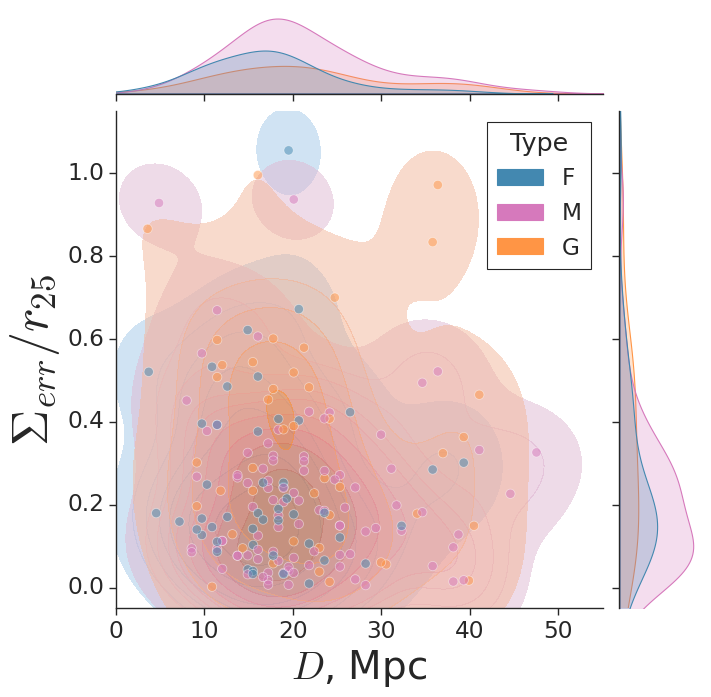

In [111]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_type, x='dist_Mpc', y='cover_CR', s=70, color='b', alpha=0.5, marginal_ticks=False, dropna=False,  height=9, ratio=5,hue='Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint
ax.set_xlabel(r'$D$, Mpc',fontsize=35)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)

ax.set_xlim(0,55)
ax.set_ylim(-0.05,1.15)
plt.savefig('./../images/images_RAA/cover_dist.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

<Figure size 680x800 with 0 Axes>

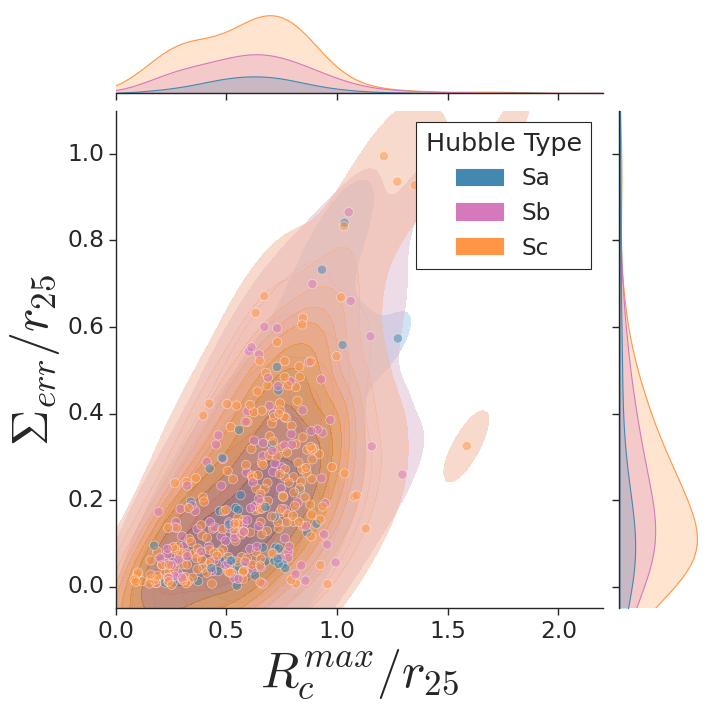

In [112]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_hubble, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, height=9, marginal_ticks=False, dropna=False, ratio=5,hue='Hubble Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint

ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)

ax.set_xlim(0,2.2)
ax.set_ylim(-0.05,1.1)
plt.savefig('./../images/images_RAA/cover_hubble.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

<Figure size 680x800 with 0 Axes>

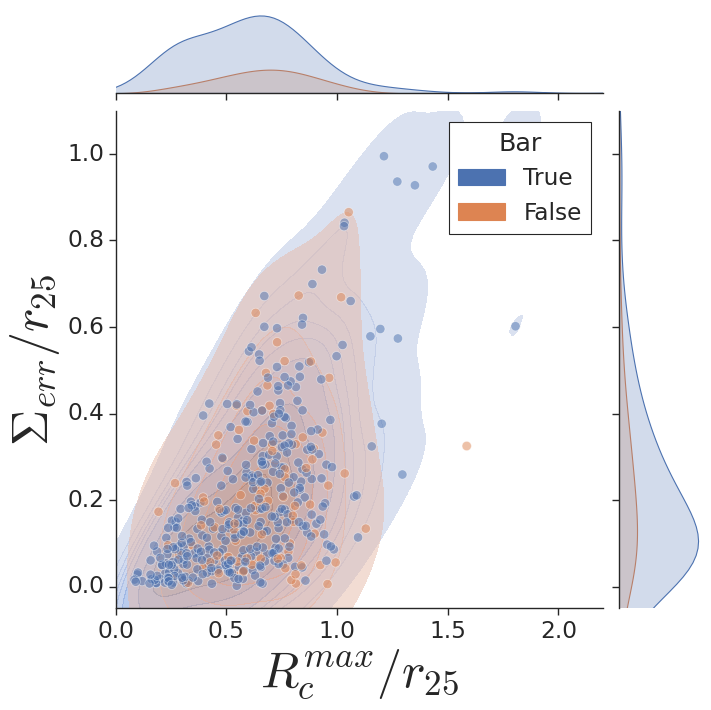

In [113]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_bar, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, height=9, marginal_ticks=False, dropna=False, ratio=5,hue='Bar')

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint

ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)

ax.set_xlim(0,2.2)
ax.set_ylim(-0.05,1.1)
plt.savefig('./../images/images_RAA/cover_bar.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

In [114]:
gf_hubble_ = gf_hubble[gf_hubble['cr_number']>1]
gf_type_ = gf_type[gf_type['cr_number']>1]
gf_bar_ = gf_bar[gf_bar['cr_number']>1]

gf_hubble_['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gf_hubble_['cr_l'].values, gf_hubble_['cr_r'].values,gf_hubble_['cr'].values,gf_hubble_['cr_number'].values))]
gf_type_['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gf_type_['cr_l'].values, gf_type_['cr_r'].values,gf_type_['cr'].values,gf_type_['cr_number'].values))]
gf_bar_['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gf_bar_['cr_l'].values, gf_bar_['cr_r'].values,gf_bar_['cr'].values,gf_bar_['cr_number'].values))]


<Figure size 680x800 with 0 Axes>

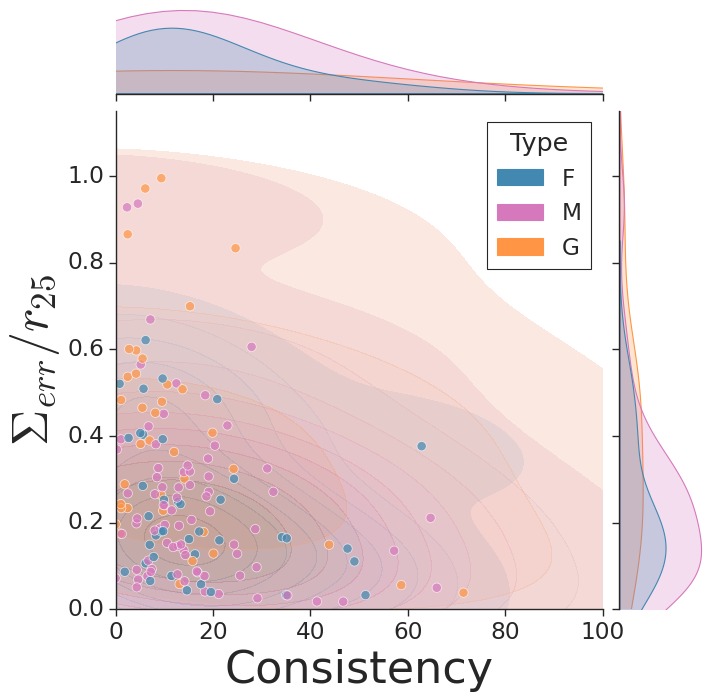

In [115]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')
fig = plt.figure(figsize=[8.5,10])

sns.set(font_scale=1.9)
sns.set_style("ticks")

g1=sns.jointplot(data=gf_type_, x='consistence', y='cover_CR', s=70, color='b', alpha=0.7, marginal_ticks=False, dropna=False,  height=9, ratio=5, hue='Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.3)
ax = g1.ax_joint
ax.set_xlabel(r'Consistency',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)

ax.set_xlim(0,100)
ax.set_ylim(0,1.15)
plt.savefig('./../images/images_RAA/consistency_type.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

<Figure size 680x800 with 0 Axes>

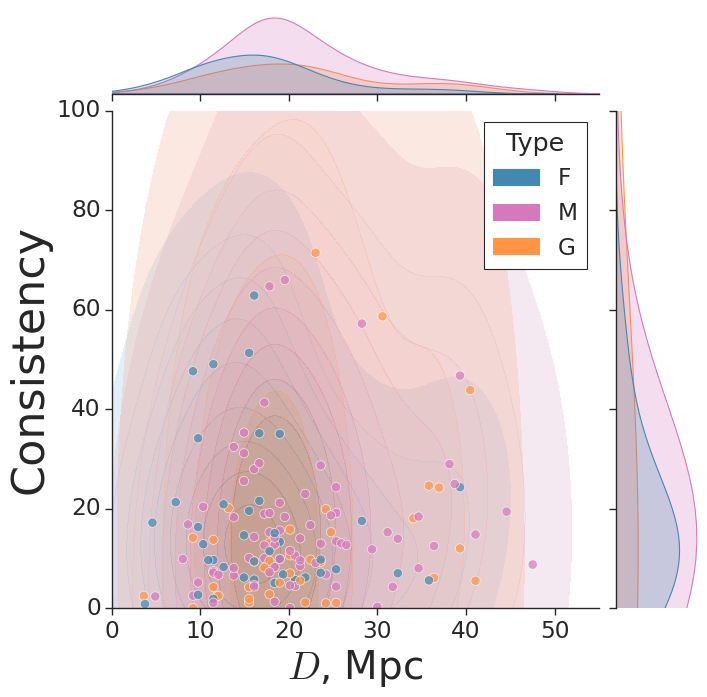

In [116]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_type_, x='dist_Mpc', y='consistence', s=70, color='b', alpha=0.7, marginal_ticks=False, dropna=False,  height=9, ratio=5,hue='Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.3)
ax = g1.ax_joint
ax.set_xlabel(r'$D$, Mpc',fontsize=35)
ax.set_ylabel(r'Consistency',fontsize=40)

ax.set_xlim(0,55)
ax.set_ylim(-0.05,100)
plt.savefig('./../images/images_RAA/consistency_dist.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

<Figure size 680x800 with 0 Axes>

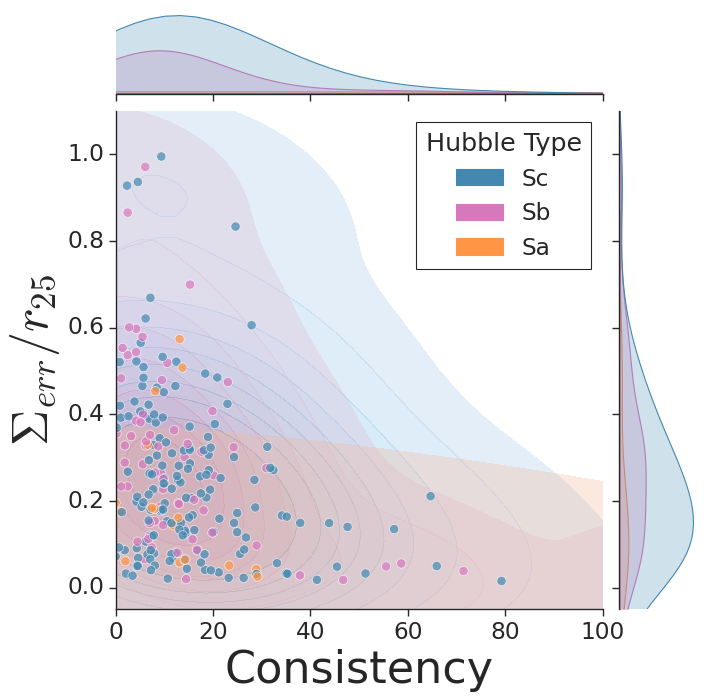

In [117]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_hubble_, x='consistence', y='cover_CR', s=70, color='b', alpha=0.7, height=9, marginal_ticks=False, dropna=False, ratio=5,hue='Hubble Type',palette=colors)

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.3)
ax = g1.ax_joint

ax.set_xlabel(r'Consistency',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)

ax.set_xlim(0,100)
ax.set_ylim(-0.05,1.1)
plt.savefig('./../images/images_RAA/consistency_hubble.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

<Figure size 680x800 with 0 Axes>

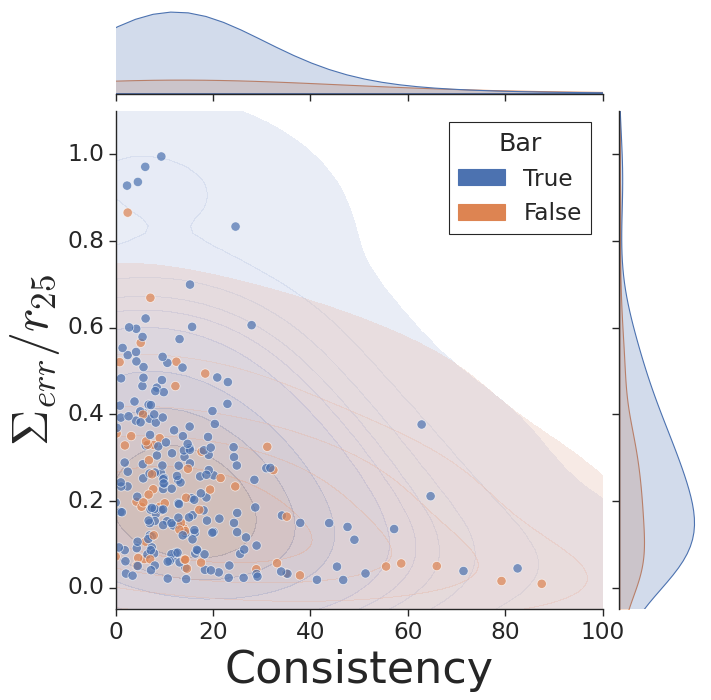

In [118]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_bar_, x='consistence', y='cover_CR', s=70, color='b', alpha=0.7, height=9, marginal_ticks=False, dropna=False, ratio=5,hue='Bar')

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.3)
ax = g1.ax_joint

ax.set_xlabel(r'Consistency',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)

ax.set_xlim(0,100)
ax.set_ylim(-0.05,1.1)
plt.savefig('./../images/images_RAA/consistency_bar.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

#### Presence of bar from LEDA, exlude weakly barred galaxies

In [119]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0)
df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr'] = df['cr']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']
gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','altname','method']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)
gf['cr_number'] = [len(row) for row in gf['cr'].values]

In [120]:
altnames = []
for val in gf['altname']:
    altnames.append(val[0])

In [121]:
bar_LEDA_all = []
bar_LEDA_clear = []
for i,val in enumerate(altnames):

    try:
        h_type = hyp[hyp['name']==val].type.to_numpy()[0]
        bar_ = hyp[hyp['name']==val].bar.to_numpy()[0]
        if bar_=='B':
            bar_LEDA_all.append('True')
            if ('A' in h_type):
                bar_LEDA_clear.append('False')
            else:
                bar_LEDA_clear.append('True')
            
        else:
            bar_LEDA_all.append('False')
            bar_LEDA_clear.append('False')
    except:
        
        bar_LEDA_all.append('Nan')
        bar_LEDA_clear.append('Nan')

In [122]:
gf['Bar_LEDA_all'] = bar_LEDA_all
gf['Bar'] = bar_LEDA_clear
gf_ = gf[(gf['cover_CR']>0) & (gf['cover_CR']<3)]

(-0.05, 1.1)

<Figure size 680x800 with 0 Axes>

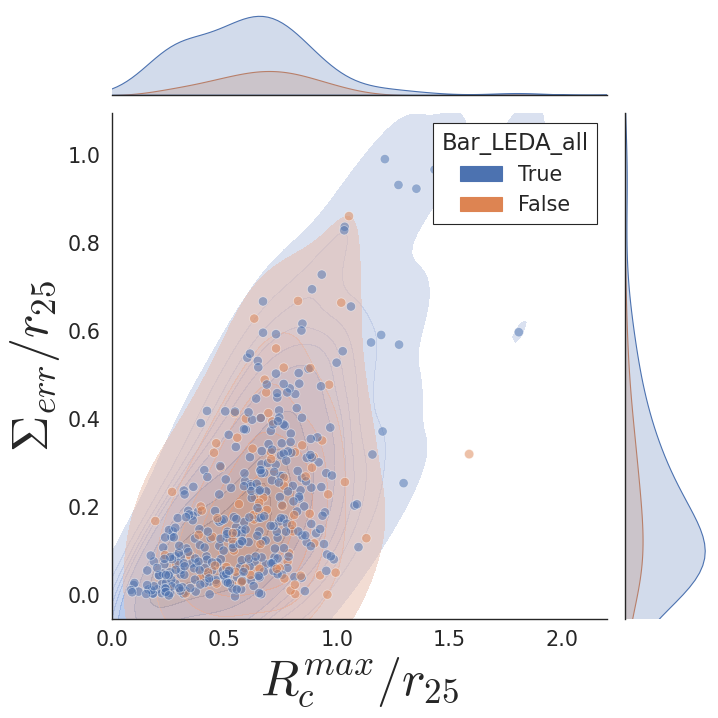

In [123]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')

sns.set_theme(style="white")
sns.color_palette("muted")
sns.set_context("notebook", font_scale=1.7, rc={"lines.linewidth": 6.5})

gf_bar  = gf_[gf_['Bar_LEDA_all'].isin(['True','False'])]
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_bar, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, height=9, marginal_ticks=False, dropna=False, ratio=5,hue='Bar_LEDA_all')

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint

ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)

ax.set_xlim(0,2.2)
ax.set_ylim(-0.05,1.1)

<Figure size 680x800 with 0 Axes>

<Figure size 680x800 with 0 Axes>

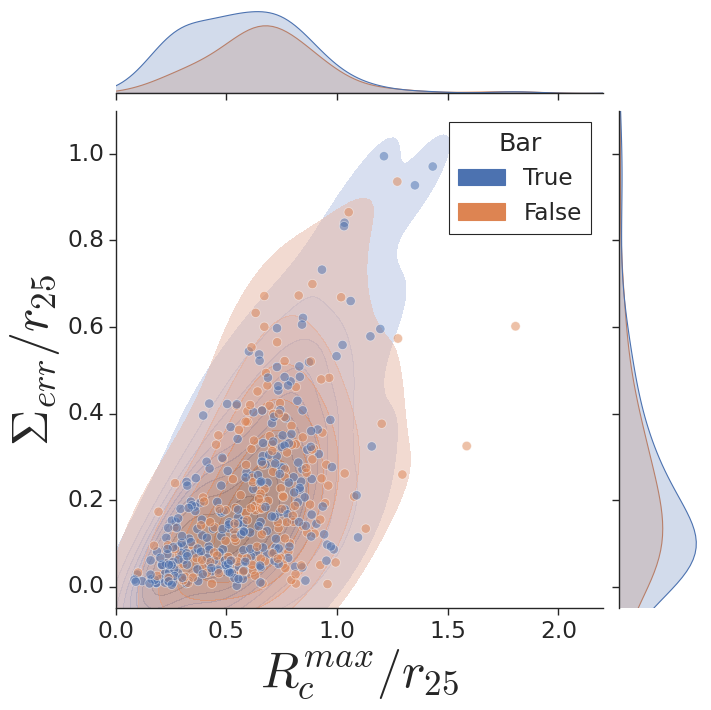

In [124]:
import matplotlib as mpl
mpl.style.use('classic')
warnings.filterwarnings('ignore')
fig = plt.figure(figsize=[8.5,10])

sns.set(font_scale=1.9)
sns.set_style("ticks")

gf_bar  = gf_[gf_['Bar_LEDA_all'].isin(['True','False'])]
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_bar, x='far_cr', y='cover_CR', s=70, color='b', alpha=0.5, height=9, marginal_ticks=False, dropna=False, ratio=5,hue='Bar')

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.5)
ax = g1.ax_joint

ax.set_xlabel(r'$R_{c}^{max}/r_{25}$',fontsize=45)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)

ax.set_xlim(0,2.2)
ax.set_ylim(-0.05,1.1)
plt.savefig('./../images/images_RAA/cover_bar.png',transparent = False, dpi=200, bbox_inches='tight', pad_inches=0.05)

In [125]:
gf_bar_ = gf_bar[gf_bar['cr_number']>1]
gf_bar_['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gf_bar_['cr_l'].values, gf_bar_['cr_r'].values,gf_bar_['cr'].values,gf_bar_['cr_number'].values))]

(-0.05, 1.1)

<Figure size 680x800 with 0 Axes>

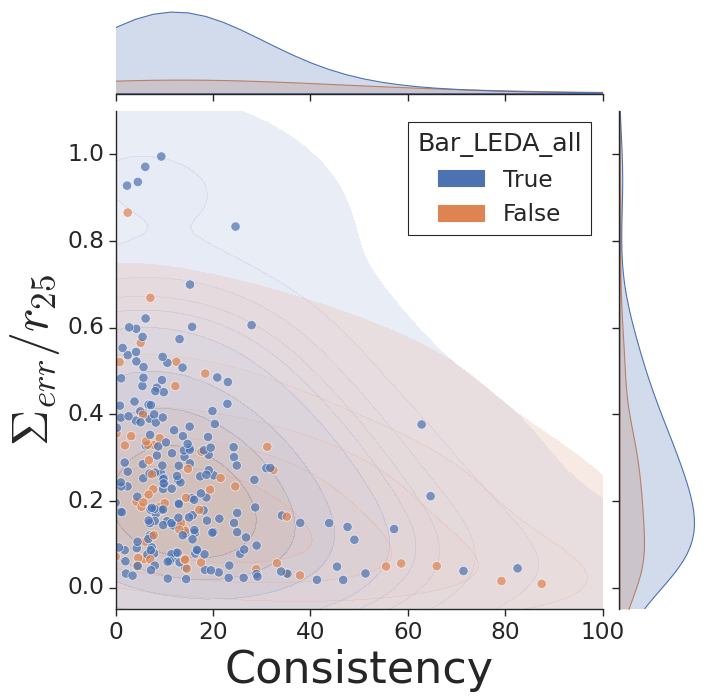

In [126]:
fig = plt.figure(figsize=[8.5,10])

g1=sns.jointplot(data=gf_bar_, x='consistence', y='cover_CR', s=70, color='b', alpha=0.7, height=9, marginal_ticks=False, dropna=False, ratio=5,hue='Bar_LEDA_all')

g1.plot_joint(sns.kdeplot, color="r", zorder=0, levels=10,fill=True, alpha=0.3)
ax = g1.ax_joint

ax.set_xlabel(r'Consistency',fontsize=40)
ax.set_ylabel(r'$\Sigma_{err}/r_{25}$',fontsize=45)

ax.set_xlim(0,100)
ax.set_ylim(-0.05,1.1)

### $r_{25}$ from LEDA and NED (compare)

In [5]:
def get_r25_NED(galname):
    try:   
        D_25 = Ned.get_table(galname, table='diameters')['NED Major Axis']
        target = Ned.get_table(galname, table='diameters')['Frequency targeted']
        r_25 = 0 
        for ind,tar in enumerate(target):
            if 'R_25' in tar:
                r_25 = D_25[ind]/2
        if r_25 == 0:
            for ind,tar in enumerate(target):
                if ('POSS1' in tar) or ('Blue' in tar) or ('SDSS Isophotal' in tar) :
                    r_25 = D_25[ind]/2
    except:
        r_25=None
            
    return r_25   

In [6]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0) 

df['r25_NED'] = df['altname'].apply(lambda l: get_r25_NED(l))

df.to_csv('./../data/crs/total_crs.csv')


In [159]:
gf = dff.groupby('altname')[['r25','r25_NED']].aggregate(list)

gf_r25['r_25'] = gf['r25'].apply(max)
gf_r25['r_25_NED'] = gf['r25_NED'].apply(max)
gff_r25 = gf_r25[(gf_r25['r_25']>0) & (gf_r25['r_25_NED']>0)]

(0.0, 1000.0)

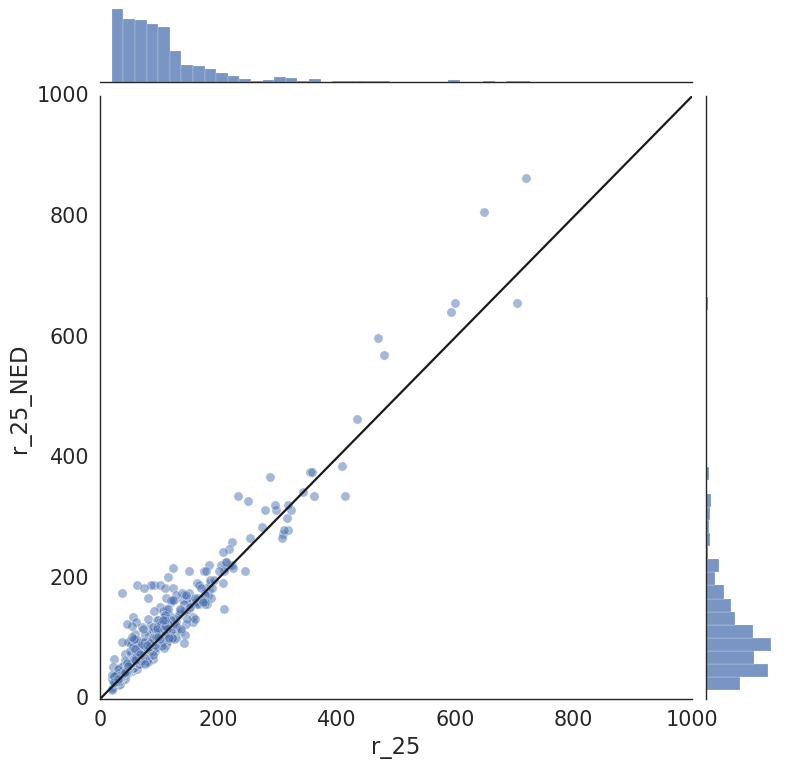

In [171]:
g1=sns.jointplot(data=gff_r25, x='r_25', y='r_25_NED', s=70, color='b', alpha=0.5, height=10, ratio=7)
ax = g1.ax_joint
ax.plot([0,1000],[1,1000], lw=2, color='k')
ax.set_xlim(0,1000)
ax.set_ylim(0,1000)

### Create a table with all objects

In [6]:
def consistancy(cr_l,cr_r,cr,num):
    
    if num>1:
    
        sigma = (np.array(cr_r)-np.array(cr_l))/2

        sum_mu = 0
        k=0
        while k!=num-1:
            for i in range(k+1,num):
                sum_mu+=(cr[i]-cr[k])**2
            k+=1

        result = np.sqrt(sum_mu)/np.sqrt(np.sum(sigma**2)) 
    
    else:
        result = 'Nan'
        
    return result    
        

In [10]:
df = pd.read_csv('./../data/crs/total_crs.csv',index_col=0)
df['cr_l'] = df['cr_l']/df['r25_NED']
df['cr'] = df['cr']/df['r25_NED']
df['cr_r'] = df['cr_r']/df['r25_NED']
gf = df.groupby('altname')[['cr', 'cr_r', 'cr_l','method','r25_NED','altname']].aggregate(list)
gf['crs'] = [list(zip(_[0], _[1])) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values))]
gf['cover_CR'] = gf['crs'].apply(lambda l: err_serf(l))
gf['far_cr'] = gf['cr_r'].apply(max)
gf['cr_number'] = [len(row) for row in gf['cr'].values]
gf['consistence'] = [consistancy(_[0],_[1],_[2],_[3]) for _ in list(zip(gf['cr_l'].values, gf['cr_r'].values,gf['cr'].values,gf['cr_number'].values))]

gf['cr_l'] = [np.array(_[0])*np.array(_[1]) for _ in list(zip(gf['cr_l'].values, gf['r25_NED'].values))]
gf['cr'] = [np.array(_[0])*np.array(_[1]) for _ in list(zip(gf['cr'].values, gf['r25_NED'].values))]
gf['cr_r'] = [np.array(_[0])*np.array(_[1]) for _ in list(zip(gf['cr_r'].values, gf['r25_NED'].values))]

/tmp/ipykernel_28757/3359275721.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  result = np.sqrt(sum_mu)/np.sqrt(np.sum(sigma**2))
/tmp/ipykernel_28757/4216826001.py:12: RuntimeWarning: invalid value encountered in multiply
  gf['cr_l'] = [np.array(_[0])*np.array(_[1]) for _ in list(zip(gf['cr_l'].values, gf['r25_NED'].values))]
/tmp/ipykernel_28757/4216826001.py:13: RuntimeWarning: invalid value encountered in multiply
  gf['cr'] = [np.array(_[0])*np.array(_[1]) for _ in list(zip(gf['cr'].values, gf['r25_NED'].values))]
/tmp/ipykernel_28757/4216826001.py:14: RuntimeWarning: invalid value encountered in multiply
  gf['cr_r'] = [np.array(_[0])*np.array(_[1]) for _ in list(zip(gf['cr_r'].values, gf['r25_NED'].values))]


In [11]:
altnames = []
for val in gf['altname']:
    altnames.append(val[0])

In [14]:
md=pd.read_table('./../data/info_about_galaxies/spiral_type.tsv',sep=',')
dist_Mpc=[]
spiral_type=[]
hubble_type=[]
bar=[]
for i,val in enumerate(altnames):
    
    modz = hyp[hyp['name']==val].modz.to_numpy()
    Mpc = zToMpc(modz)
    if Mpc > 0.:
            dist_Mpc.append(Mpc[0])
    else:
            modz = hyp[hyp['name']==val].mod0.to_numpy()
            Mpc = zToMpc(modz) 
            if Mpc > 0.:
                dist_Mpc.append(Mpc[0])
            else:
                dist_Mpc.append('Nan')
                                
    t='Nan'            
    for k, row in md[md['Altname']==val].iterrows():
        t=row['Type']
            
    spiral_type.append(t) 
    
    try:
        h_type = hyp[hyp['name']==val].type.to_numpy()[0]
        bar_ = hyp[hyp['name']==val].bar.to_numpy()[0]
        if bar_=='B':
            if ('A' in h_type):
                bar.append('False')
            else:
                bar.append('True')
            
        else:
            bar.append('False')
        hubble_type.append(h_type)    
    except:
        
        hubble_type.append('Nan')
        bar.append('Nan')

/tmp/ipykernel_28757/87111825.py:10: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if Mpc > 0.:
/tmp/ipykernel_28757/87111825.py:15: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if Mpc > 0.:


In [15]:
gf['Spiral_type'] = spiral_type
gf['Hubble_type'] = hubble_type
gf['Bar'] = bar
gf['dist_Mpc'] = dist_Mpc

In [18]:
gf.head(100)

,cr,cr_r,cr_l,method,r25_NED,altname,crs,cover_CR,far_cr,cr_number,consistence,Spiral_type,Hubble_type,Bar,dist_Mpc
altname,,,,,,,,,,,,,,,
2MASX J14192411+4554021,[12.52978723158978],[43.3621488634021],[4.069341774609974],[T-W],[18.155],[2MASX J14192411+4554021],"[(0.22414441060919713, 2.38844113816591)]",2.164297,2.388441,1,Nan,Nan,S0-a,True,119.674053
2MASX J14213483+4021294,[24.045877101006205],[37.4844789284094],[15.519259669533016],[T-W],[20.73],[2MASX J14213483+4021294],"[(0.7486377071651238, 1.8082237785050361)]",1.059586,1.808224,1,Nan,Nan,S?,False,285.759054
CGCG 008-010,[21.9],[23.5],[20.3],[gaps],[26.14],[CGCG 008-010],"[(0.7765876052027544, 0.8990053557765876)]",0.122418,0.899005,1,Nan,Nan,Sb,False,161.957103
CGCG 013-075,"[12.6, 21.19843157006126]","[13.199999999999998, 21.19843157006126]","[12.0, 21.19843157006126]","[gaps, rings]","[26.15, 26.15]","[CGCG 013-075, CGCG 013-075]","[(0.45889101338432126, 0.5047801147227533), (0...",0.045889,0.810647,2,14.330719,Nan,S0-a,True,112.305235
CGCG 039-041,[21.28748439607381],[21.28748439607381],[21.28748439607381],[rings],[32.9],[CGCG 039-041],"[(0.647035999880663, 0.647035999880663)]",0.000000,0.647036,1,Nan,Nan,S0-a,True,126.415405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MESSIER 100,"[31.8, 33.1, 76.5, 108.8, 97.0, 123.4999999999...","[35.2, 43.7, 83.3, 119.1, 99.2, 125.6, 158.6, ...","[28.4, 22.5, 69.7, 98.5, 94.8, 121.40000000000...","[F-B, F-B, F-B, F-B, F-B, F-B, F-B, F-B, F-B, ...","[222.4, 222.4, 222.4, 222.4, 222.4, 222.4, 222...","[MESSIER 100, MESSIER 100, MESSIER 100, MESSIE...","[(0.06506294964028778, 0.06506294964028778), (...",0.699191,0.888939,27,15.267975,G,SABb,False,24.751413
MESSIER 101,"[463.34847780144844, 111.4944898632953, 292.67...","[463.34847780144844, 139.36811232911913, 306.6...","[463.34847780144844, 83.62086739747149, 278.73...","[morph, T-W, T-W, morph, morph, metallicity, o...","[865.2, 865.2, 865.2, 865.2, 865.2, 865.2, 865...","[MESSIER 101, MESSIER 101, MESSIER 101, MESSIE...","[(0.09664917637248206, 0.16108196062080343), (...",0.451079,0.641106,9,9.876274,M,SABc,False,8.016781
MESSIER 109,"[46.24853186583229, 114.90000000000002]","[49.36371795005933, 115.8]","[43.13334578160524, 114.0]","[T-W, morph]","[227.55, 227.55]","[MESSIER 109, MESSIER 109]","[(0.18955546377325969, 0.2169356974293972), (0...",0.035291,0.508899,2,21.171806,M,Sbc,True,18.958327


In [19]:
gf.to_csv('./../data/crs/galaxies_sample.csv')